# fitting cross validation with hexameric origami, fixed distance
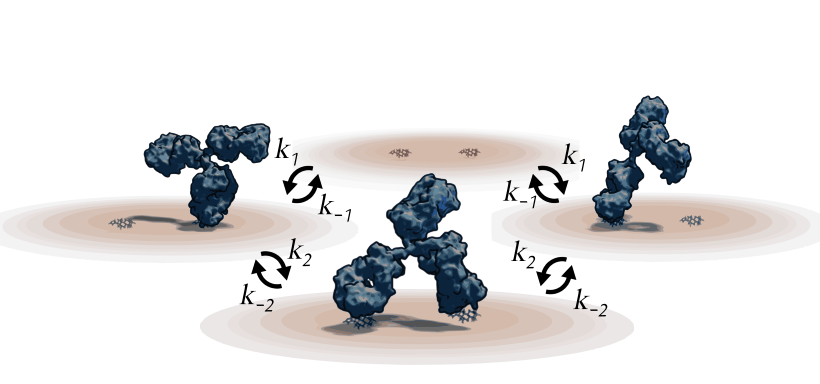

In [38]:
%matplotlib inline
import numpy as np
import fitting_lib_1_3 as mk
import os
import imp
import scipy.optimize as opt
import ipdb
import matplotlib.pyplot as plt
import pandas as pd
import pickle
from scipy import stats
import matplotlib.cm as cm
from IPython.display import display, Markdown
import sympy
new_rc_params = {'text.usetex': False,
"svg.fonttype": 'none'
}
plt.rcParams.update(new_rc_params)

plt.rc('xtick', labelsize=25) 
plt.rc('ytick', labelsize=25) 
plt.rcParams.update({'font.size': 25})



In [39]:
### USER PARAMETERS ###
master_name = "JR_cross_val"

mono_data_source = "JR1"

data_sets = [("JR2_config_a","bivalent_close"),
            ("JR2_config_b","bivalent_far"),
            ("JR2_config_c","obtuse_triangle"),
            ("JR2_config_d","equilateral_triangle_far"),
            ("JR2_config_e","trapezoid"),
            ("JR2_config_f","rectangle_far"),
            ("JR2_config_g","pentagon"),
            ("JR2_config_h","hexagon"),]

bivalent_data_source = data_sets[0]



In [40]:
def apparent_KD(concentration, KD1, KD2):
    K_Dapp = (-1*KD2*(concentration**2-KD1**2))/(2*concentration*KD2 + KD1 + 2*KD1*KD2)
    return K_Dapp

## progressive fitting for IgG1 dig - basic case

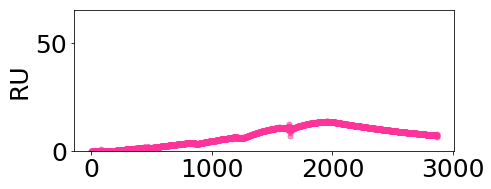

<Figure size 432x288 with 0 Axes>

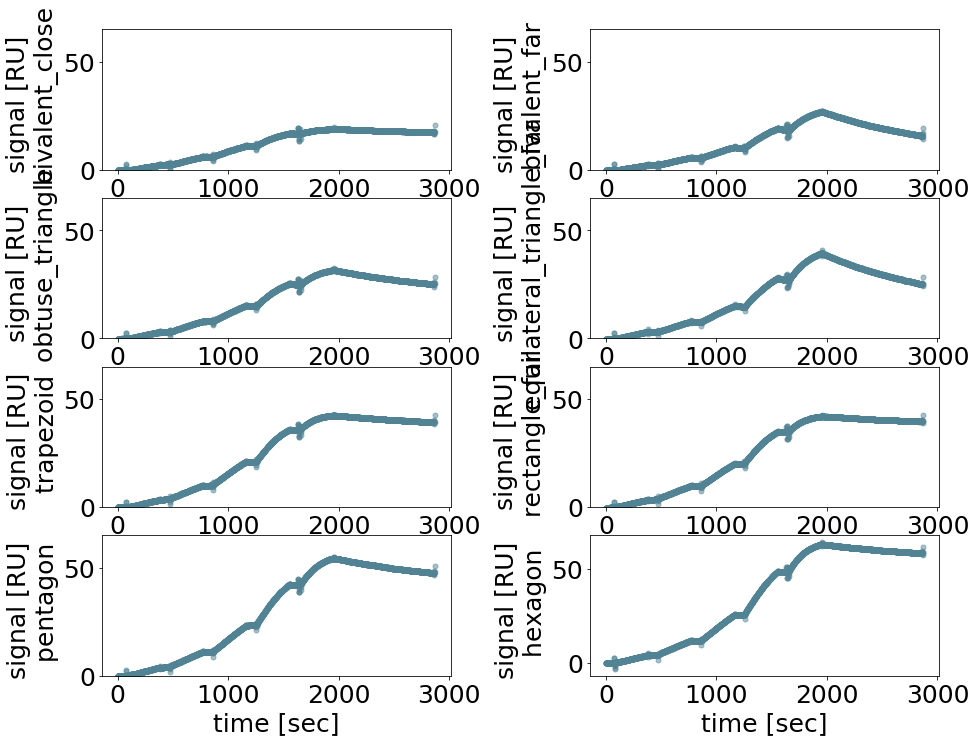

In [29]:
output_directory = master_name+"/OUTPUT_rawsprplots"
if not os.path.exists(output_directory):
            os.makedirs(output_directory)

plt.figure(figsize=(15,15))
mono_run = list(pd.read_csv('data_directory/'+mono_data_source+".txt", sep="\t", header=None)[0])
plt.subplot(521)
plt.scatter(range(0, len(mono_run)), mono_run, alpha = 0.5, s = 25, c = "#ff3399")
plt.ylabel("RU")
plt.ylim(0,65)
plt.savefig(output_directory+"/ raw_"+master_name+"_monoplot.svg")
plt.show()




plt.tight_layout()
plt.figure(figsize=(15,15))
left = 0.9  # the left side of the subplots of the figure
right = 0.9   # the right side of the subplots of the figure
bottom = 0.1  # the bottom of the subplots of the figure
top = 0.0     # the top of the subplots of the figure
wspace =10  # the amount of width reserved for space between subplots,
hspace = 0.2
# plt.tight_layout()
plt.subplots_adjust(left=None, bottom=None, right=None, top=None, wspace=.4, hspace=None)
for i in range(len(data_sets)):
    plt.ylim(0,65)
    run_data = list(pd.read_csv('data_directory/'+data_sets[i][0]+'.txt', sep="\t", header=None)[0])
    plotnum = 521+i
    plt.subplot(plotnum)
    plt.scatter(range(0, len(run_data)), run_data, alpha = 0.5, s = 25, c = "#518394")
    plt.ylabel("signal [RU] \n %s"% data_sets[i][1])
    plt.xlabel("time [sec]")

plt.savefig(output_directory+"/ raw_"+master_name+"_distanceplots.svg")
plt.show()
plt.close()

### getting the initial guess for the monovalent rates

<Figure size 432x288 with 0 Axes>

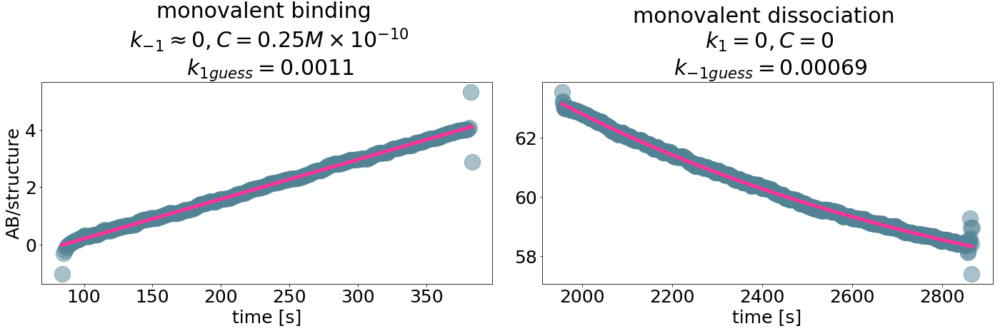

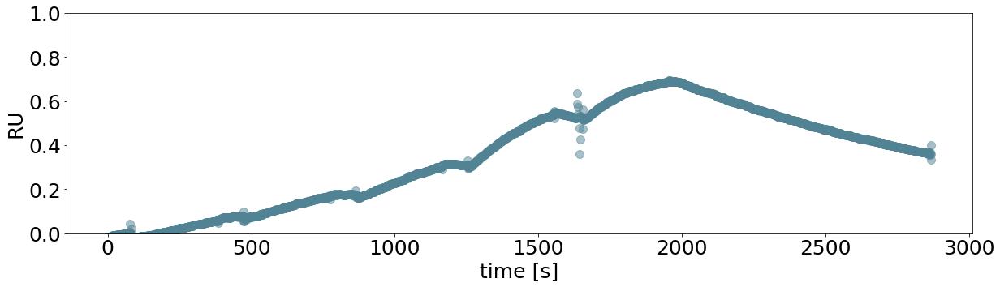

In [30]:
imp.reload(mk)
output_directory = master_name+"/monovalent_fitting"
if not os.path.exists(output_directory):
            os.makedirs(output_directory)
if not os.path.exists(master_name+"/pickle_directory"):
            os.makedirs(master_name+"/pickle_directory")
        
scaling_constant = 19.58
time_points = np.array([0, 84, 384, 475, 775, 866, 1166, 1257, 1557, 1656, 1956])
concentrations = np.array([0, 0.25, 0, 0.5, 0, 1, 0, 2.5, 0, 5, 0]) # e-10
run_data_mono = mk.fetch_and_normalize_data('data_directory/' + mono_data_source+".txt", normalize_const=scaling_constant)
t1 = np.arange(time_points[1], time_points[2])
t2 = np.arange(time_points[-1], len(run_data_mono)-1)


run_data1 = run_data[time_points[1]:time_points[2]]
run_data2 = run_data[time_points[-1]:-1]


k_on_g, k_off_g = mk.avg_slope_guess(time_points, concentrations,run_data_mono)
# pickle_out = open("IgG1_dig_guess_on_rates.pickle", "wb")
# pickle.dump([k_on_g, k_off_g], pickle_out)
# pickle_out.close()
# plots of fitting for figures, etc
k1, intercept1, r_value1, p_value1, std_err1 = stats.linregress(t1[0:300], run_data1[0:300])
popt, pcov = opt.curve_fit(mk.exponential_decay_fit, t2, run_data2,p0=(1, 1e-6, 1), maxfev=1000000)
plt.rc('xtick', labelsize=25) 
plt.rc('ytick', labelsize=25) 
plt.rcParams.update({'font.size': 25})
plt.tight_layout()

plt.figure(figsize=(20,7))
plt.subplots_adjust(left=None, bottom=None, right=None, top=0.78, wspace=.1, hspace=None)
plt.subplot(121)
plt.scatter(t1,run_data1, alpha = 0.5, s = 500, c = "#518394")
plt.plot(t1,t1*k1+intercept1,c="#ff3399", linewidth=5)
plt.title("monovalent binding \n $k_{-1} \\approx 0, C = 0.25 M \\times 10 ^{-10}$ \n $k_{1 guess} = $"+str(np.round(k_on_g,5)))
plt.ylabel("AB/structure")
plt.xlabel("time [s]")
plt.subplot(122)
plt.scatter(t2,run_data2, alpha = 0.5, s = 500, c = "#518394")
plt.plot(t2,mk.exponential_decay_fit(t2,popt[0],popt[1],popt[2]),c="#ff3399", linewidth=5)
plt.title("monovalent dissociation \n $k_{1} = 0, C = 0$ \n $k_{-1 guess} = $"+str(np.round(np.abs(k_off_g),5)))
plt.xlabel("time [s]")

plt.savefig(output_directory+"/monovalent_guess.svg")

plt.tight_layout()
plt.show()
plt.close()

plt.figure(figsize=(20,5))
plt.scatter(range(0,len(run_data_mono)), run_data_mono, alpha = 0.5, s = 100, c = "#518394")
plt.ylim(0,1)

plt.ylabel("RU")
plt.xlabel("time [s]")
plt.savefig(output_directory+"/monovalent_spr_curve_.svg")
plt.show()
plt.close()

import pickle as pkl
pkl.dump([scaling_constant, time_points,  concentrations, run_data_mono, data_sets,
          t1, t2, run_data1,run_data2,
          k_on_g, k_off_g,k1, intercept1, r_value1, p_value1, std_err1,popt, pcov          
         ], open(master_name+'/pickle_directory/guess_on_rates.pickle', 'wb'))

In [31]:
import pickle as pkl
scaling_constant, time_points,  concentrations, \
run_data_mono,data_sets, t1, t2, run_data1,run_data2,k_on_g, \
k_off_g,k1, intercept1, r_value1, p_value1, std_err1,popt, pcov = \
    pkl.load(open(master_name+'/pickle_directory/guess_on_rates.pickle', 'rb'))

## monovalent fine fit - simulated annealing

('(fit_annealing) variable parameter: ', array([1.09987288e-03, 6.89424101e-04, 1.95800000e+01]), 'log10 variable parameter: ', array([-2.95865751, -3.16151354,  1.29181269]))
basinhopping step 0: f 26.0064
basinhopping step 1: f 26.0064 trial_f 26.0064 accepted 1  lowest_f 26.0064
found new global minimum on step 1 with function value 26.0064
('JR1', [-2.9926109015036735, -3.0735790113363244, 1.255272505103306])


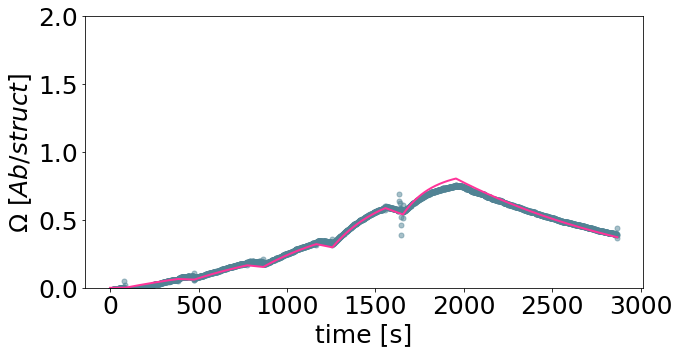

[1.01715959e-03 8.44152651e-04 1.80000000e+01]


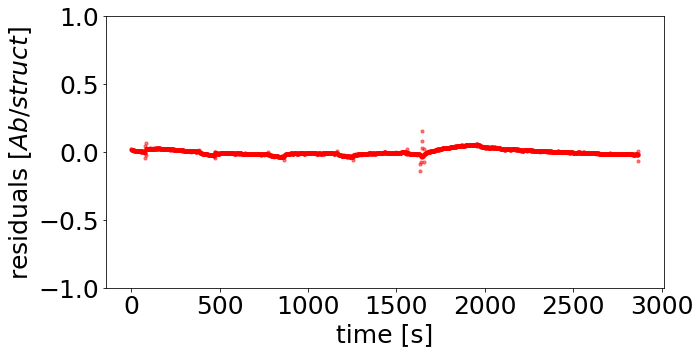

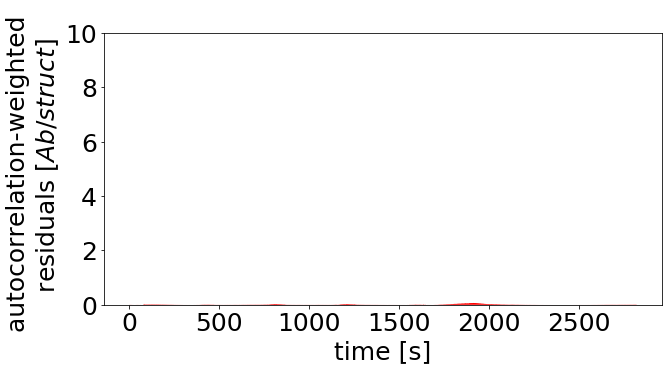

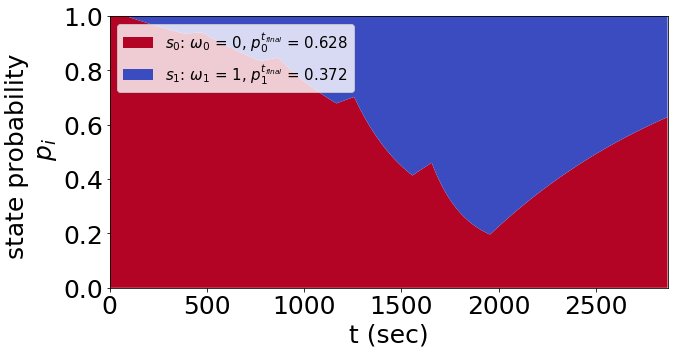

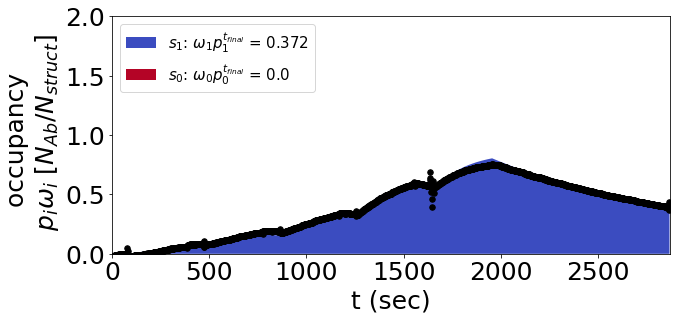

[array([-2.9926109 , -3.07357901,  1.25527251])]


$${\huge K_{D1,fine}=8.29911705547494e-10M \huge}$$

('kon, koff:', 1017159.5909890371, 0.0008441526509717032)


In [32]:
import fitting_lib_1_3 as mk
import scipy.optimize as opt
import scipy.stats as stats
import numpy as np
import imp
import pickle
imp.reload(mk)

k_on_g, k_off_g = k_on_g, k_off_g
origami_1 = mk.Fitting(run_list = np.array([[mono_data_source,"monovalent"]]), 
                       run_type = "mono",
                       mono_rates = np.array([k_on_g, k_off_g]),
                       KD_biv = None,
                       concentrations = concentrations,
                       time_points = time_points, 
                       scaling_constant = 19.58,
                      output_dir = master_name+"/monovalent_fine_fitting")
origami_1.set_bounds(((-12,2),(-12,2),(np.log10(18),np.log10(20))))
origami_1.print_graph = False
xopt_compilation = np.power(10,origami_1.fit_annealing())
k_on, k_off, norm1 = xopt_compilation[0][0], xopt_compilation[0][1], xopt_compilation[0][2]
KD1 = k_off /(k_on*10**9) # M
pkl.dump([xopt_compilation, 
          k_on, k_off, norm1,origami_1          
         ], open(master_name+'/pickle_directory/monovalent_fine_fitting_result.pickle', 'wb'))
display(Markdown("$${\huge K_{D1,fine}="+str(KD1)+"M \huge}$$"))
print("kon, koff:",k_on*10**9, k_off)

In [33]:
import pickle as pkl
xopt_compilation, \
          k_on, k_off, norm1,origami_1 = \
    pkl.load(open(master_name+'/pickle_directory/monovalent_fine_fitting_result.pickle', 'rb'))

[0.00142102 0.00084685 0.03916   ]

## bivalent fit

(0.001689336284608581, 0.000600366057061402, 17.904803732090443)

('(fit_annealing) variable parameter: ', array([1.0e-02, 1.8e+01]), 'log10 variable parameter: ', array([-2.        ,  1.25527251]))
basinhopping step 0: f 18.9278
basinhopping step 1: f 18.9278 trial_f 18.9278 accepted 1  lowest_f 18.9278
('JR2_config_a', [-1.460871342134674, 1.244096484828325])


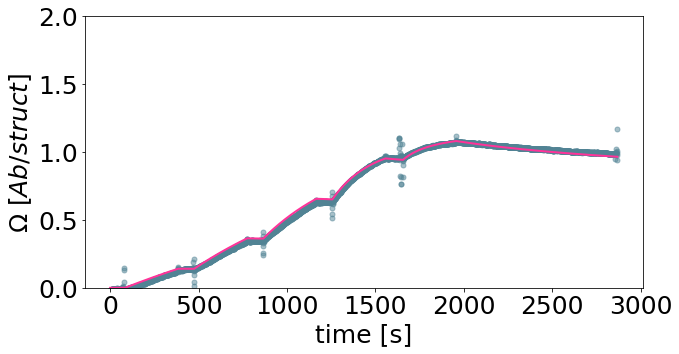

[ 0.03460419 17.54270195]


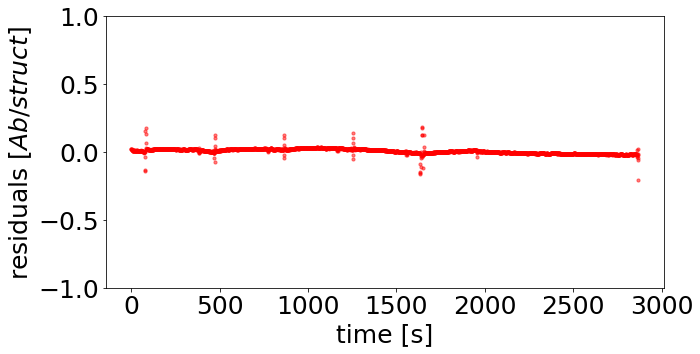

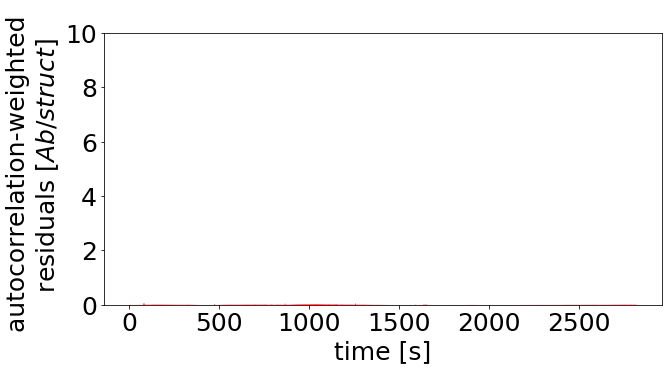

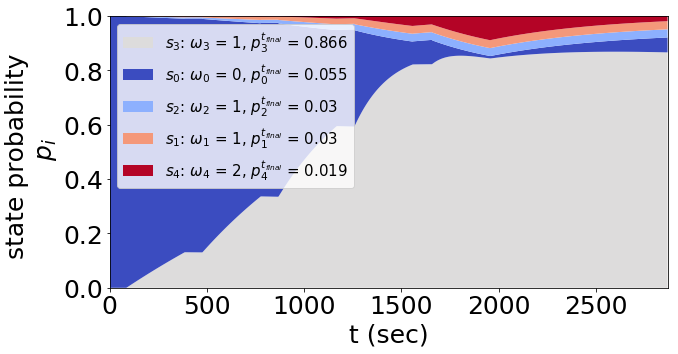

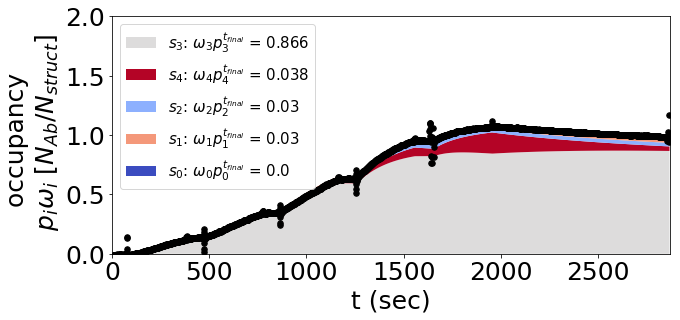

[array([-1.46087134,  1.24409648])]


IndexError: index 2 is out of bounds for axis 0 with size 2

In [37]:
imp.reload(mk)

origami_2 = mk.Fitting(
    run_list = np.array([bivalent_data_source]), 
    run_type = "biv", 
    mono_rates = np.array([k_on, k_off]),
    KD_biv = .01, 
    concentrations = concentrations, 
    time_points = time_points, 
    scaling_constant = norm1,
    output_dir = master_name+"/bivalent_fine_fitting",
    k_monobiv = 1,
    k_bivmono = 1,
)
origami_2.set_bounds(((-6,2),(np.log10(10),np.log10(25))))#(((-6,2),(-6,2),(np.log10(10),np.log10(25))))
origami_2.print_graph = False
xopt_compilation_2 = origami_2.fit_annealing()
xopt_pow = np.power(10,xopt_compilation_2)
KD_biv, norm_2 = xopt_pow[0][1]/xopt_pow[0][0], xopt_pow[0][2]
logKD_biv, lognorm_2 =xopt_compilation_2[0][1]/xopt_compilation_2[0][0], xopt_compilation_2[0][1]

pkl.dump([xopt_compilation_2, 
          origami_2, KD_biv, norm_2, xopt_pow,  logKD_biv, lognorm_2  
         ], open(master_name+'/pickle_directory/bivalent_fitting_result.pickle', 'wb'))
Kdapp = apparent_KD(np.average(concentrations)*10**-9,KD1, KD_biv)
display(Markdown("$${\large K_{D2}="+str(KD_biv)+"\large}$$"))
display(Markdown("$${\large K_{Dapp} = "+str(Kdapp)+"\large}$$"))


In [35]:
import pickle as pkl
xopt_compilation_2, origami_2, KD_biv, norm_2, xopt_pow,  logKD_biv, lognorm_2 = \
    pkl.load(open(master_name+'/pickle_directory/bivalent_fitting_result.pickle', 'rb'))

# JR cross validation matrix 

('(fit_annealing) variable parameter: ', array([ 1.,  1., 18.]), 'log10 variable parameter: ', array([0.        , 0.        , 1.25527251]))
basinhopping step 0: f 3.67556
basinhopping step 1: f 3.67556 trial_f 3.67556 accepted 1  lowest_f 3.67556
('JR2_config_a', [-0.9739556733508608, -2.530651995458483, 1.2507827129811186])


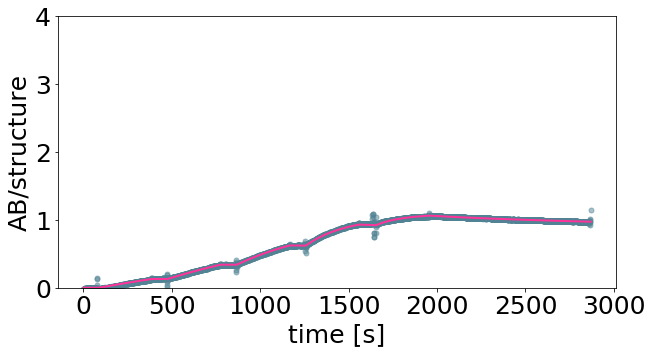

[1.06180393e-01 2.94678197e-03 1.78148723e+01]


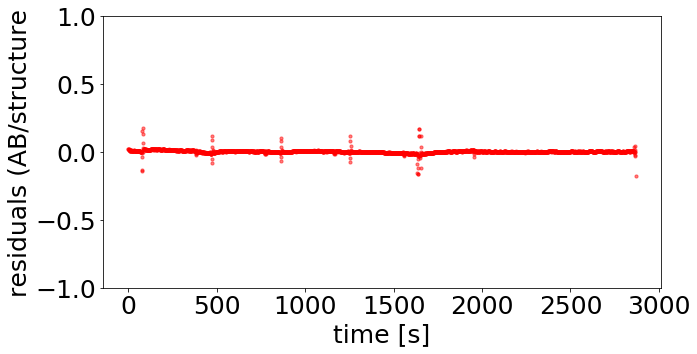

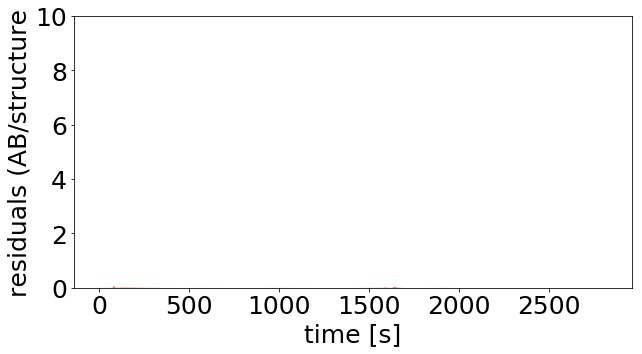

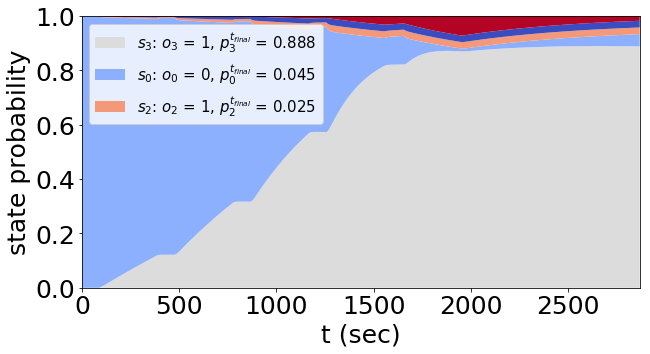

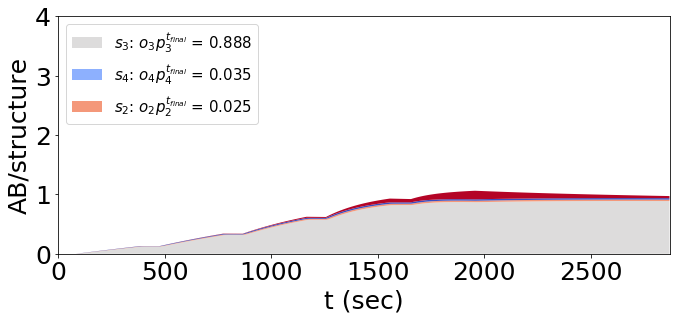

[array([-0.97395567, -2.530652  ,  1.25078271])]
('(fit_annealing) variable parameter: ', array([18.]), 'log10 variable parameter: ', array([1.25527251]))
basinhopping step 0: f 3.67556
basinhopping step 1: f 3.67556 trial_f 3.67556 accepted 1  lowest_f 3.67556
('JR2_config_a', [1.2507827129727267])


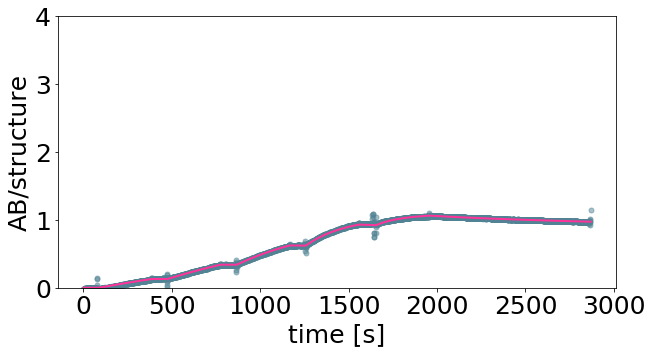

[17.81487227]


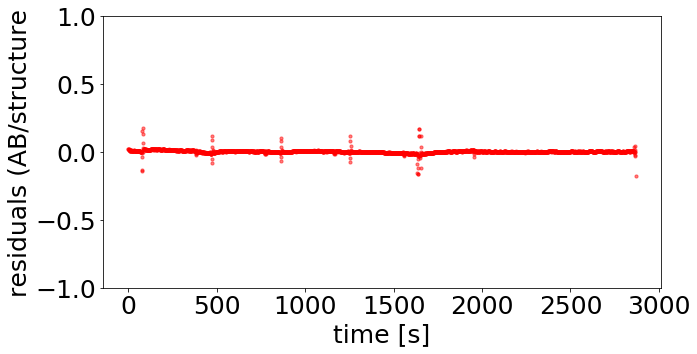

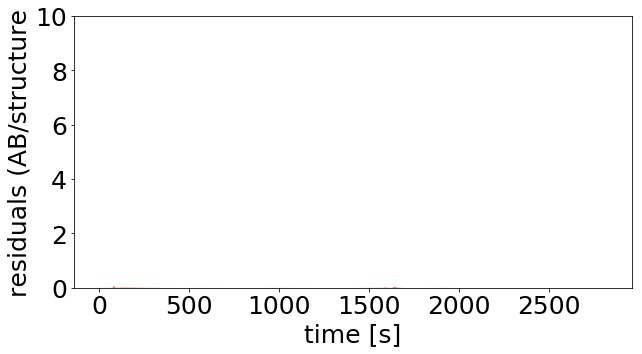

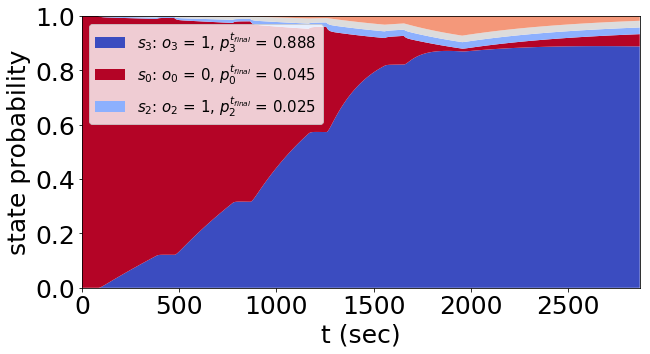

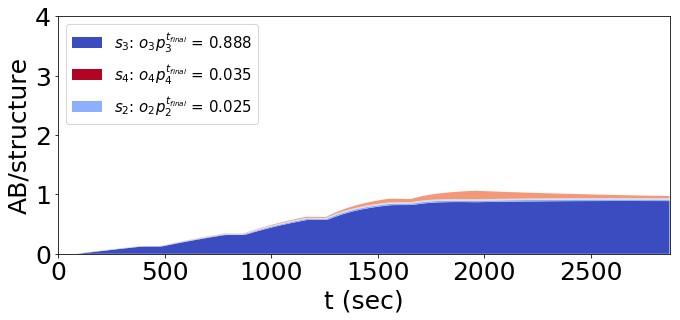

[array([1.25078271])]
('(fit_annealing) variable parameter: ', array([18.]), 'log10 variable parameter: ', array([1.25527251]))
basinhopping step 0: f 222.807
basinhopping step 1: f 222.807 trial_f 222.807 accepted 1  lowest_f 222.807
('JR2_config_b', [1.2387683829149592])


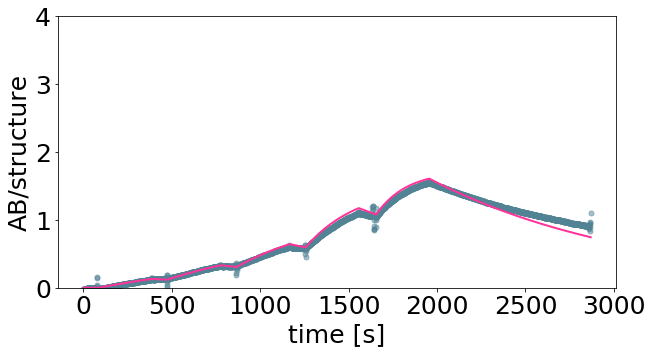

[17.32879575]


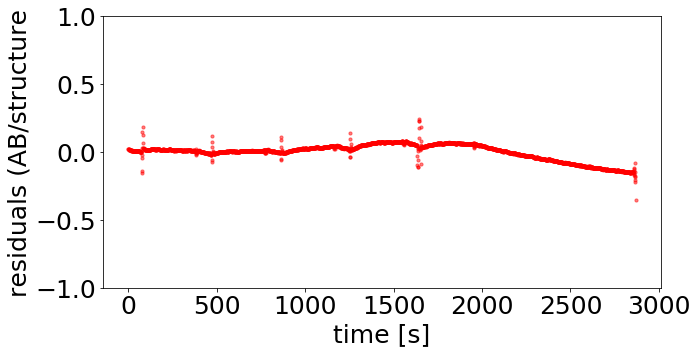

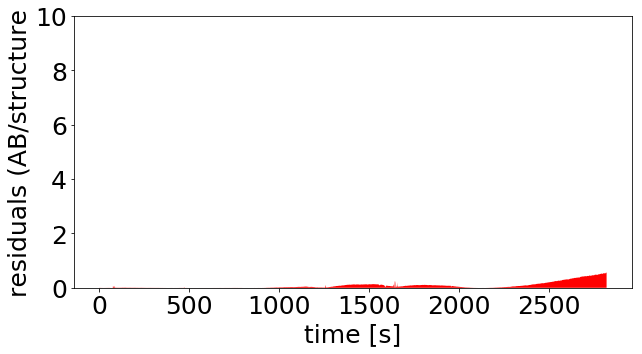

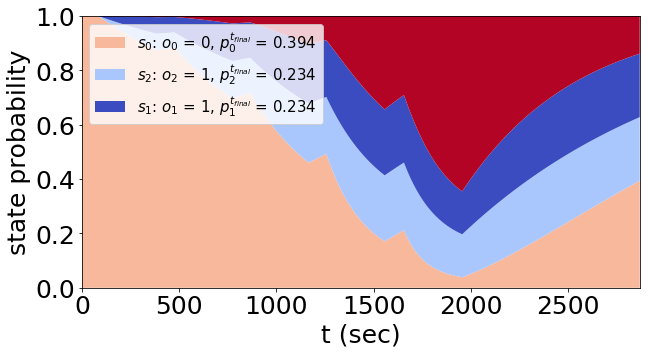

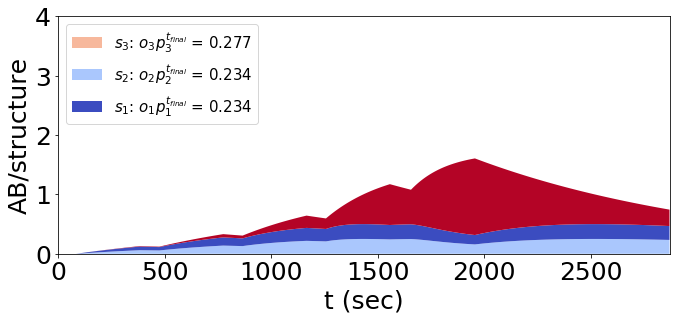

[array([1.23876838])]
('(fit_annealing) variable parameter: ', array([18.]), 'log10 variable parameter: ', array([1.25527251]))
basinhopping step 0: f 40.039
basinhopping step 1: f 40.039 trial_f 40.039 accepted 1  lowest_f 40.039
found new global minimum on step 1 with function value 40.039
('JR2_config_c', [1.2464547805221309])


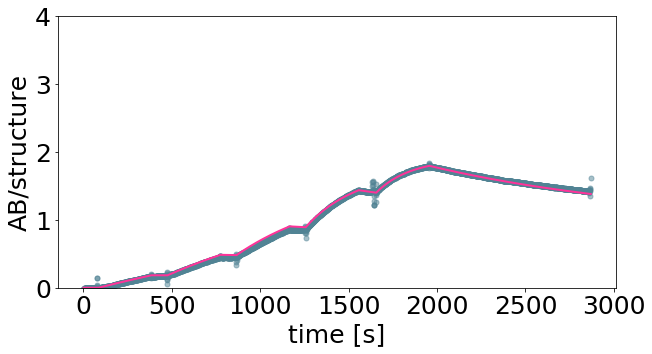

[17.63822103]


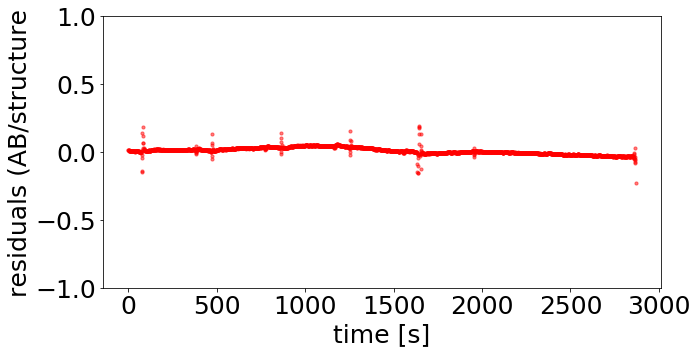

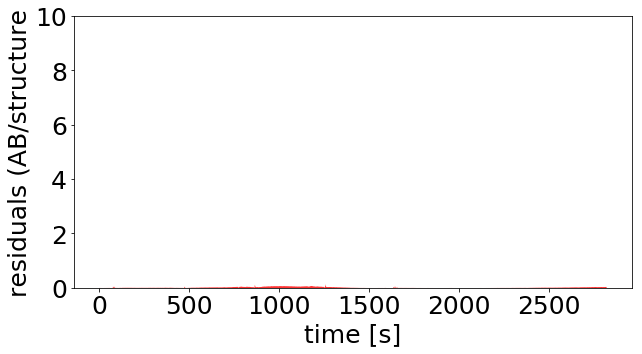

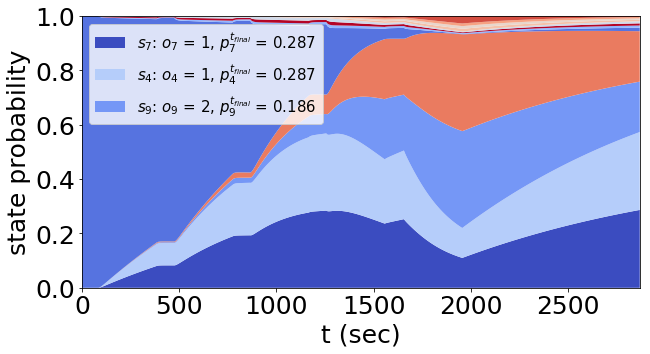

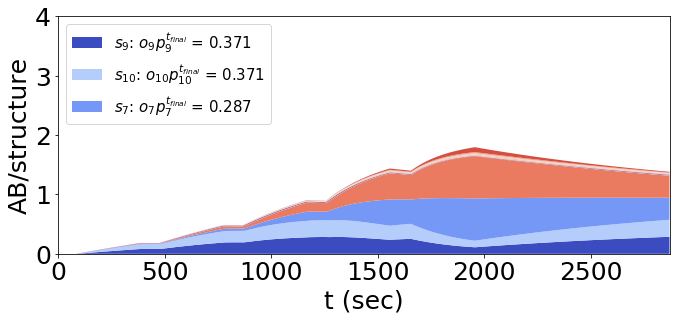

[array([1.24645478])]
('(fit_annealing) variable parameter: ', array([18.]), 'log10 variable parameter: ', array([1.25527251]))
basinhopping step 0: f 974.01
basinhopping step 1: f 974.01 trial_f 974.01 accepted 1  lowest_f 974.01
found new global minimum on step 1 with function value 974.01
('JR2_config_d', [1.2379442210872833])


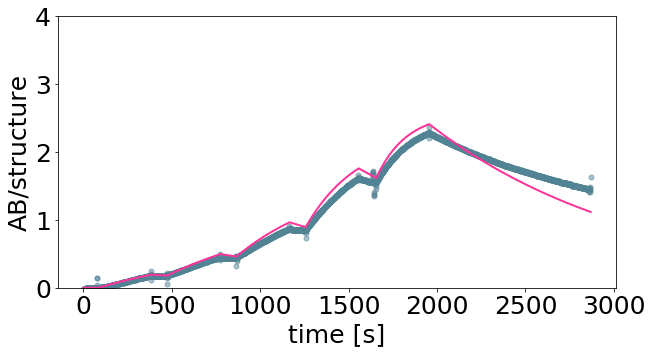

[17.29594203]


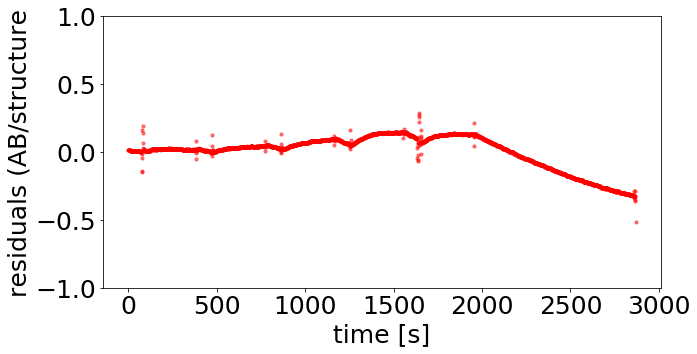

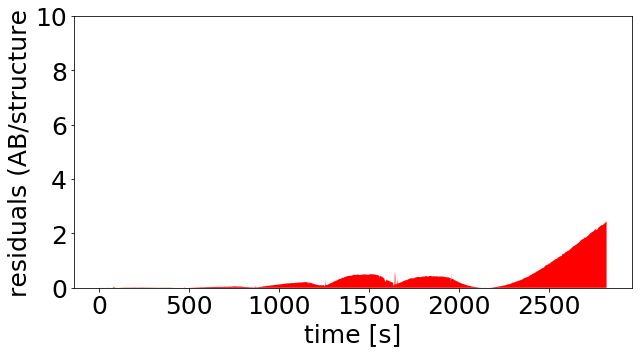

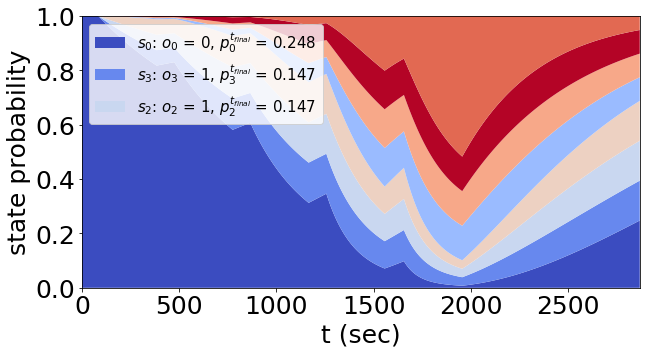

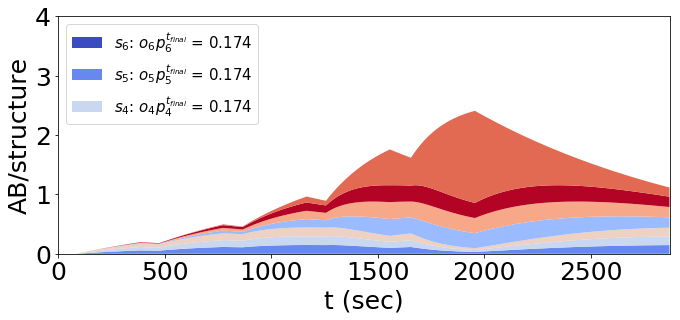

[array([1.23794422])]
('(fit_annealing) variable parameter: ', array([18.]), 'log10 variable parameter: ', array([1.25527251]))
basinhopping step 0: f 256.704
basinhopping step 1: f 256.704 trial_f 256.704 accepted 1  lowest_f 256.704
found new global minimum on step 1 with function value 256.704
('JR2_config_e', [1.2910416954659225])


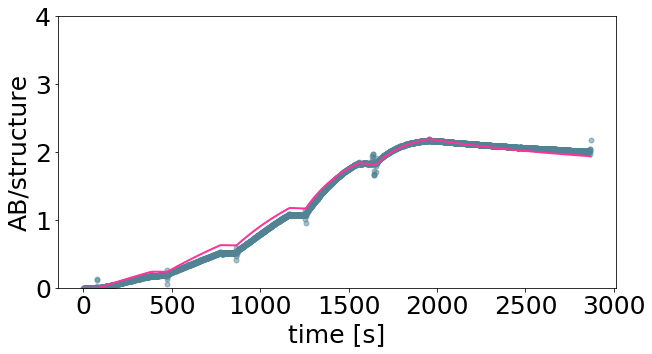

[19.54527096]


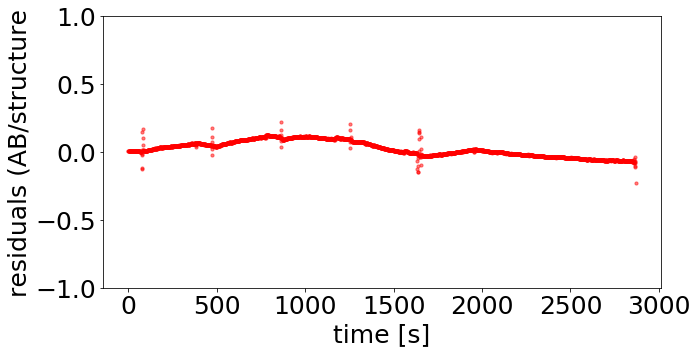

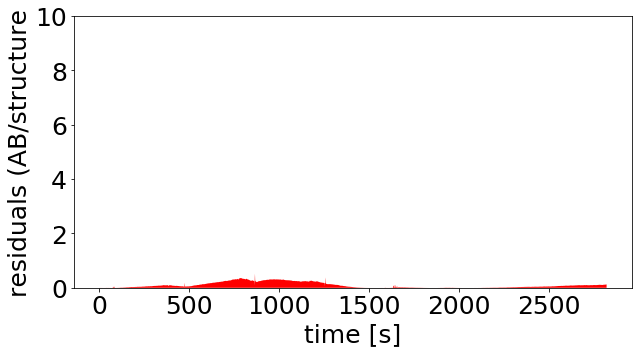

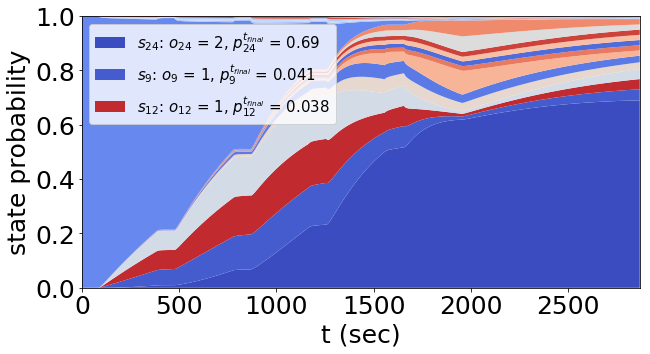

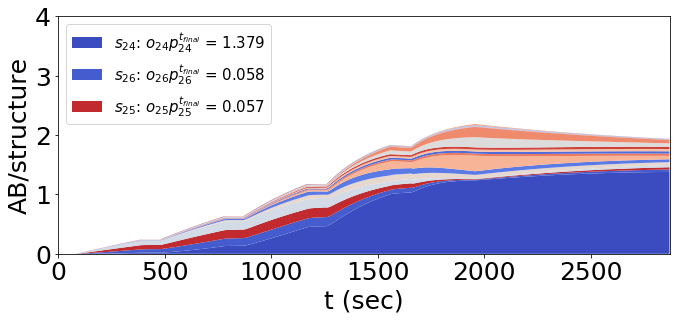

[array([1.2910417])]
('(fit_annealing) variable parameter: ', array([18.]), 'log10 variable parameter: ', array([1.25527251]))
basinhopping step 0: f 616.266
basinhopping step 1: f 616.266 trial_f 616.266 accepted 1  lowest_f 616.266
('JR2_config_f', [1.2903823941443713])


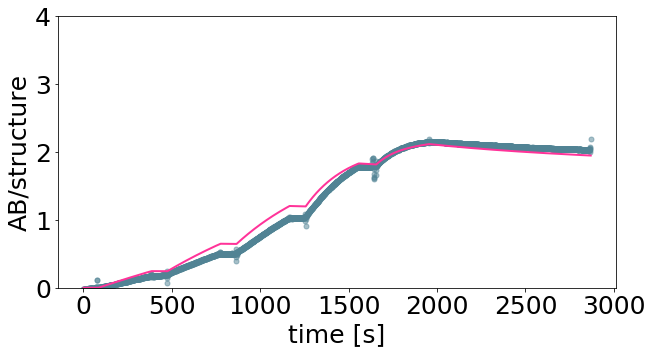

[19.51562184]


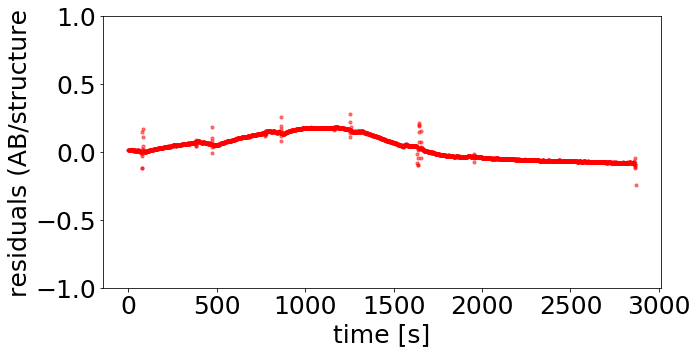

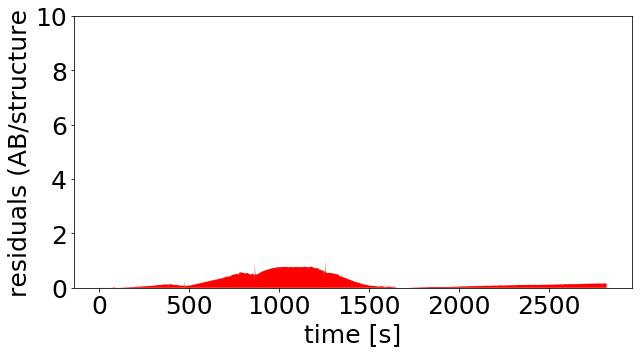

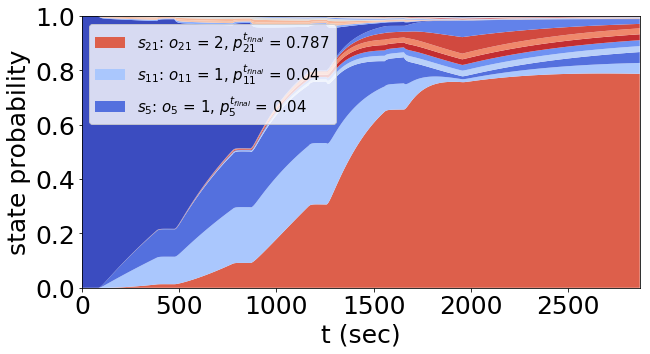

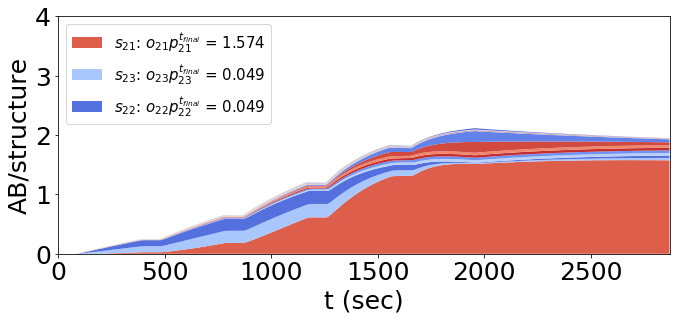

[array([1.29038239])]
('(fit_annealing) variable parameter: ', array([18.]), 'log10 variable parameter: ', array([1.25527251]))
basinhopping step 0: f 1020.74
basinhopping step 1: f 1020.74 trial_f 1020.74 accepted 1  lowest_f 1020.74
('JR2_config_g', [1.2809665686461063])


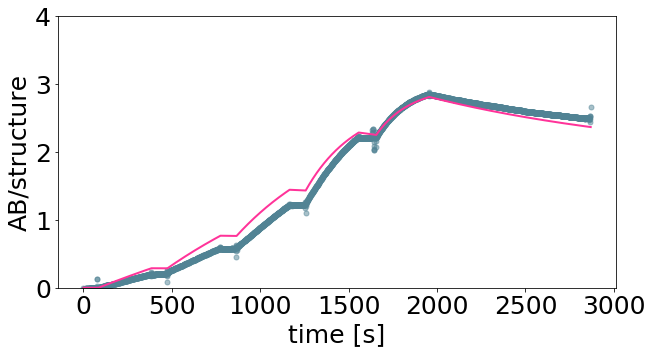

[19.09706247]


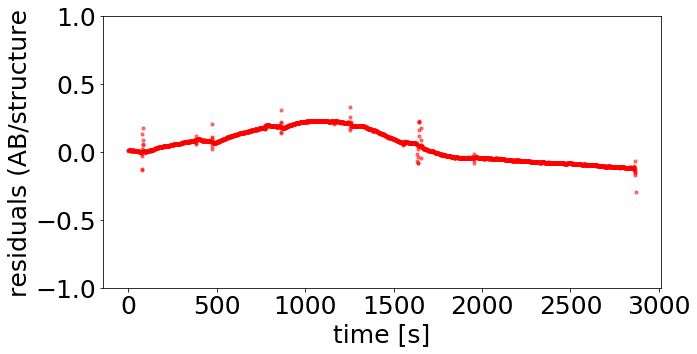

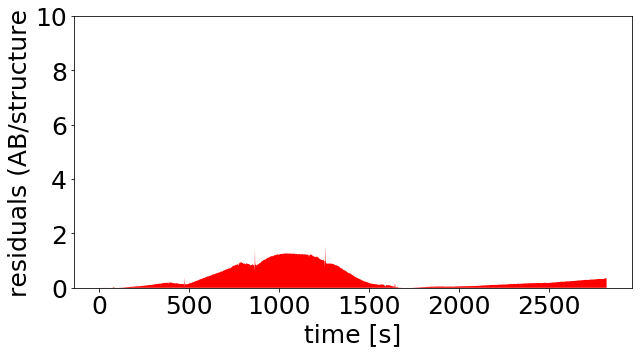

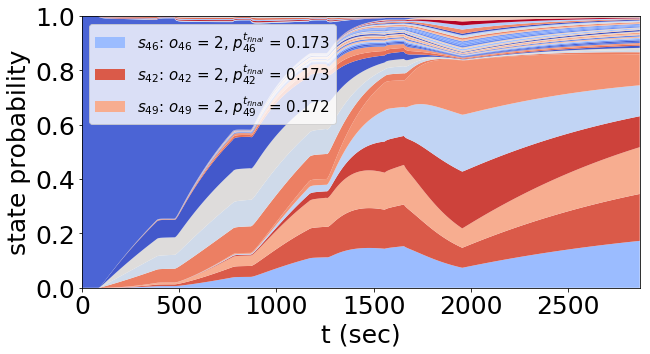

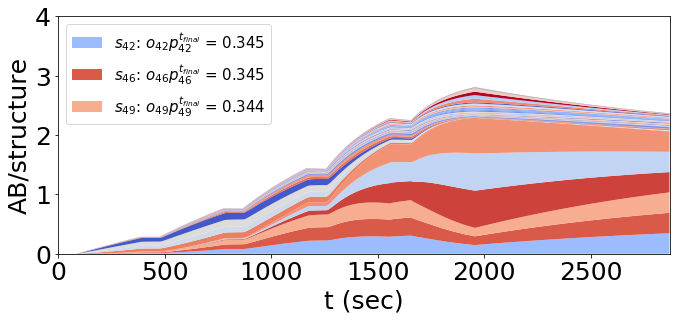

[array([1.28096657])]
('(fit_annealing) variable parameter: ', array([18.]), 'log10 variable parameter: ', array([1.25527251]))
basinhopping step 0: f 2451.16
basinhopping step 1: f 2451.16 trial_f 2451.16 accepted 1  lowest_f 2451.16
found new global minimum on step 1 with function value 2451.16
('JR2_config_h', [1.282751096484166])


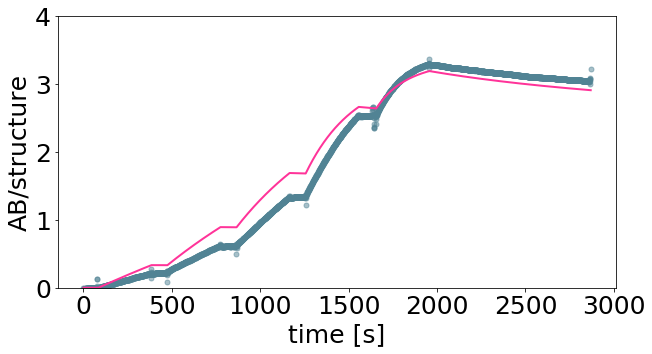

[19.17569425]


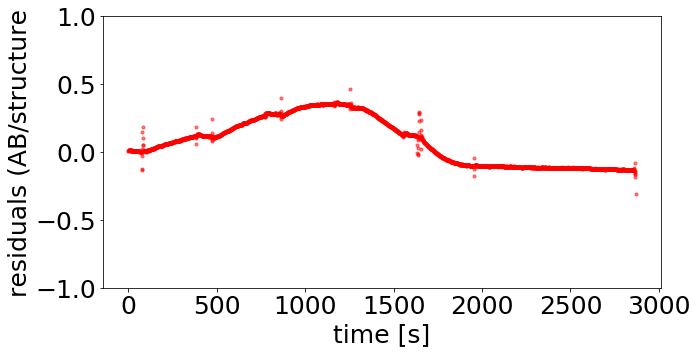

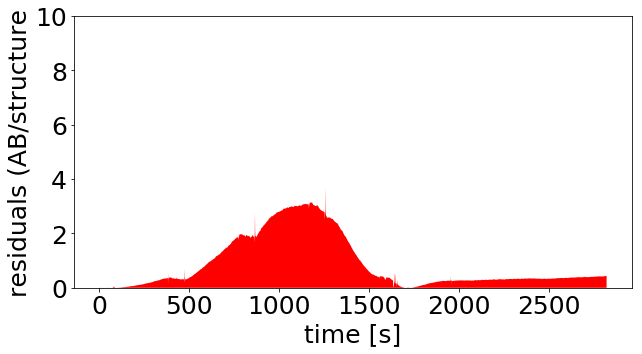

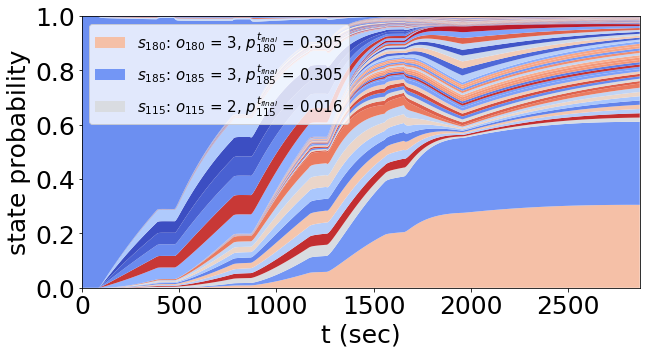

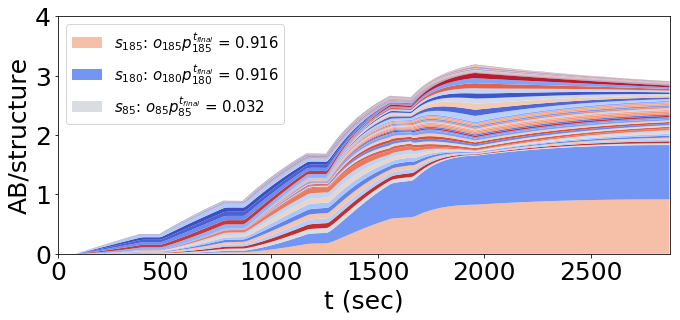

[array([1.2827511])]
('(fit_annealing) variable parameter: ', array([ 1.,  1., 18.]), 'log10 variable parameter: ', array([0.        , 0.        , 1.25527251]))
basinhopping step 0: f 222.807
basinhopping step 1: f 222.807 trial_f 222.807 accepted 1  lowest_f 222.807
('JR2_config_b', [0.0, 0.0, 1.238768378461836])


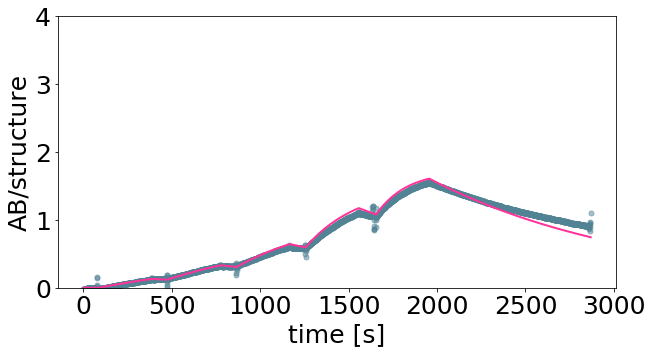

[ 1.          1.         17.32879558]


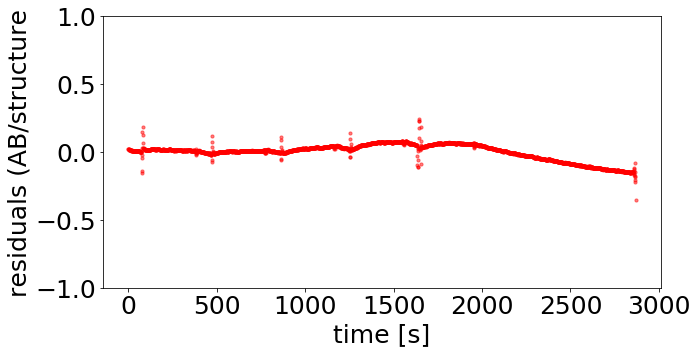

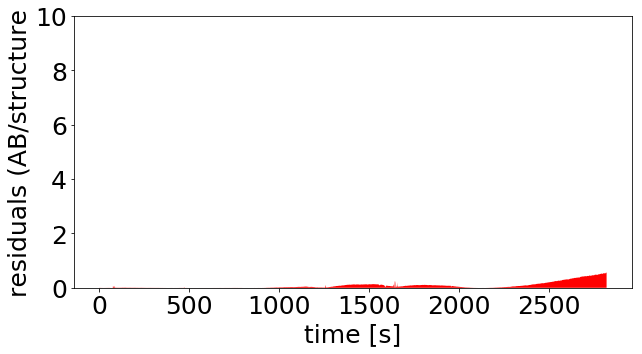

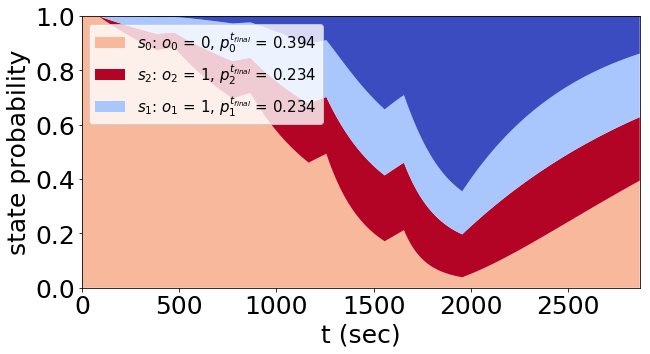

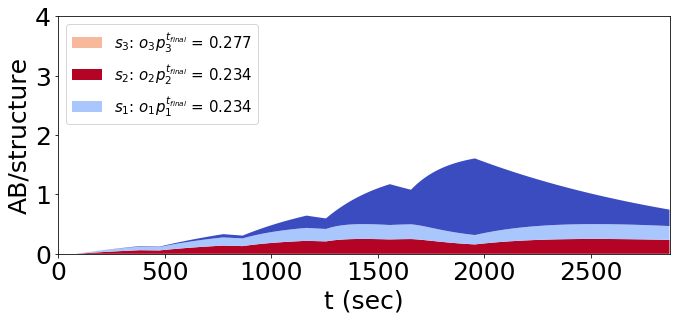

[array([0.        , 0.        , 1.23876838])]
('(fit_annealing) variable parameter: ', array([18.]), 'log10 variable parameter: ', array([1.25527251]))
basinhopping step 0: f 835.361
basinhopping step 1: f 835.361 trial_f 835.361 accepted 1  lowest_f 835.361
('JR2_config_a', [1.2163687006095172])


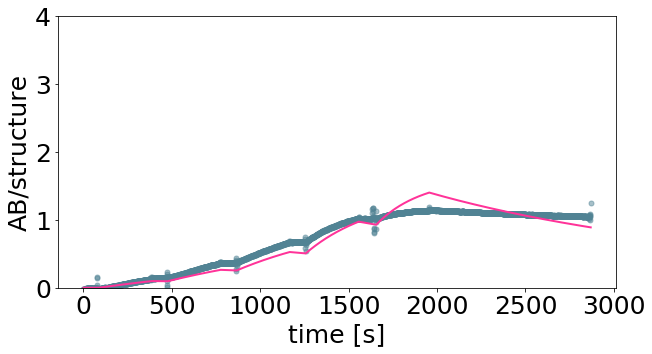

[16.45768329]


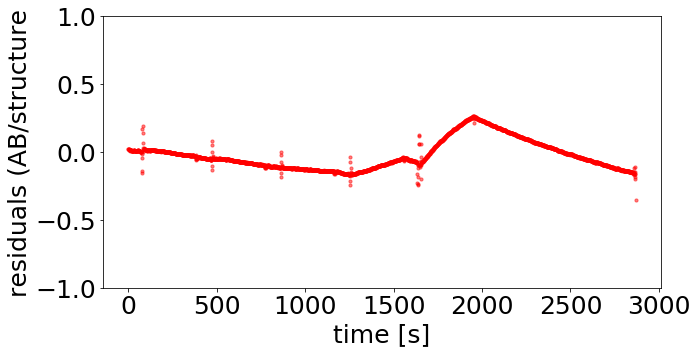

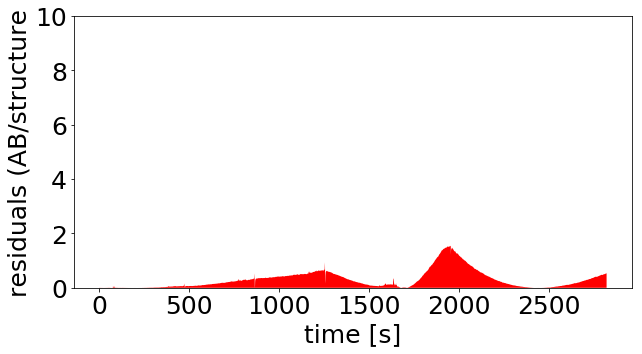

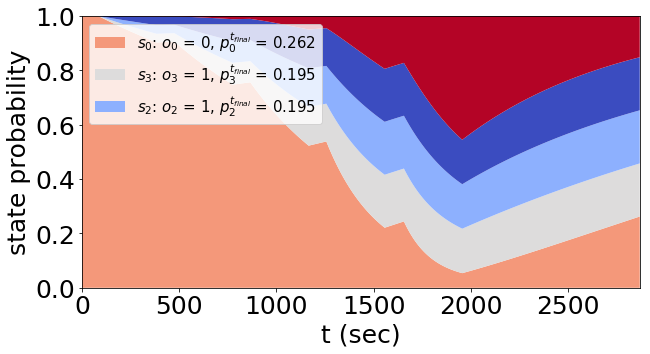

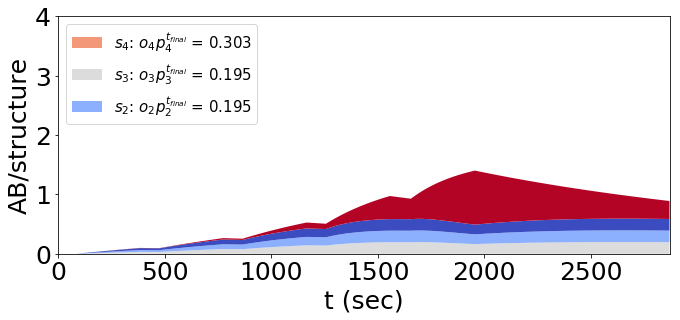

[array([1.2163687])]
('(fit_annealing) variable parameter: ', array([18.]), 'log10 variable parameter: ', array([1.25527251]))
basinhopping step 0: f 222.807
basinhopping step 1: f 222.807 trial_f 222.807 accepted 1  lowest_f 222.807
('JR2_config_b', [1.2387683829149592])


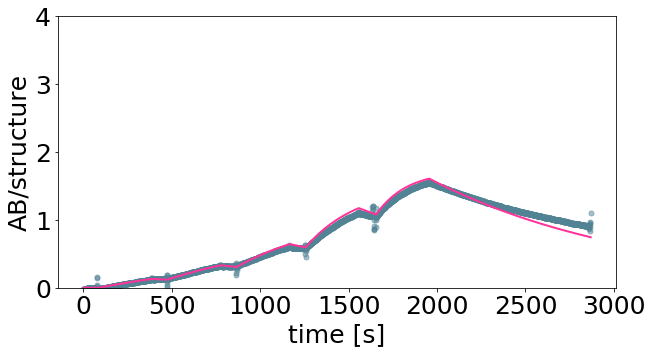

[17.32879575]


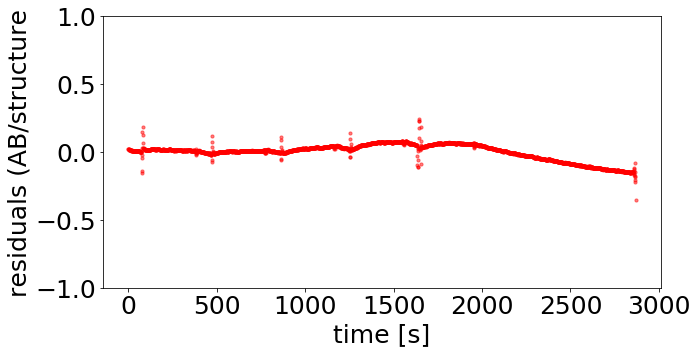

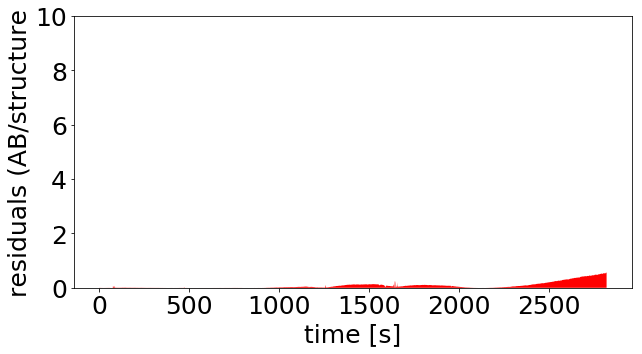

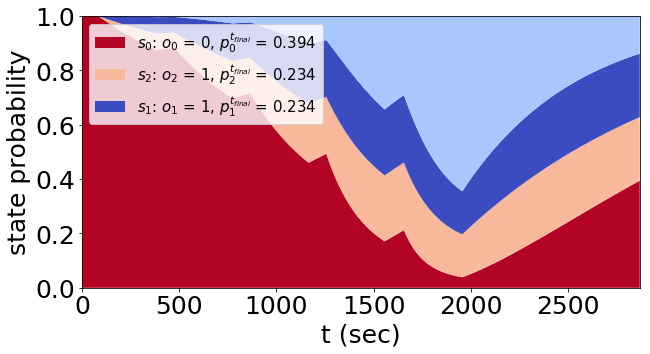

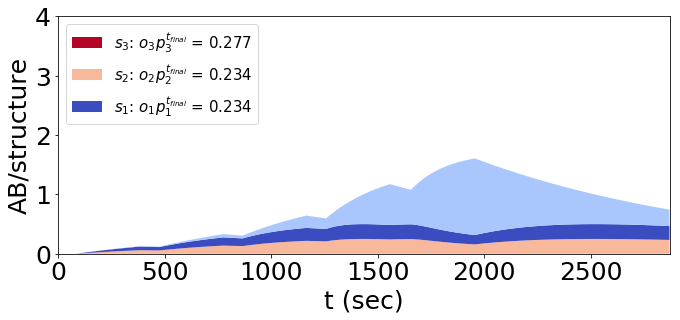

[array([1.23876838])]
('(fit_annealing) variable parameter: ', array([18.]), 'log10 variable parameter: ', array([1.25527251]))
basinhopping step 0: f 535.59
basinhopping step 1: f 535.59 trial_f 535.59 accepted 1  lowest_f 535.59
('JR2_config_c', [1.2263092858175142])


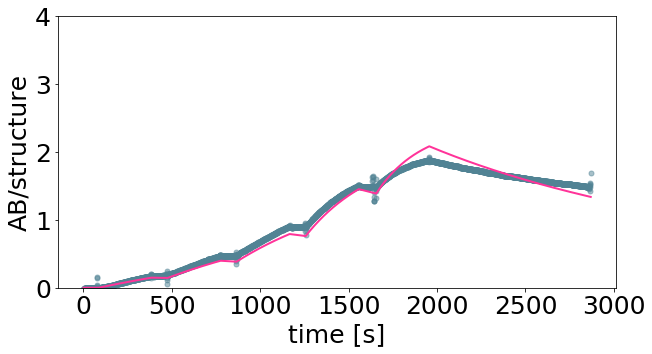

[16.83872816]


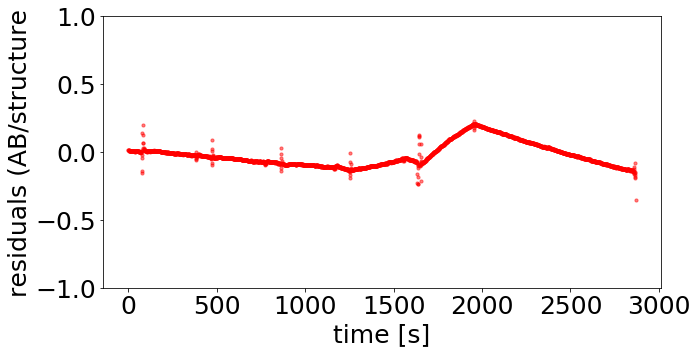

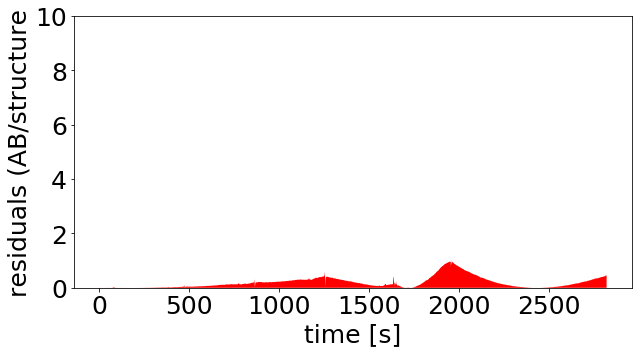

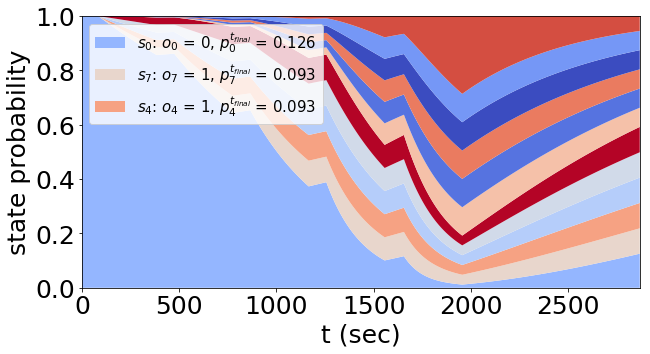

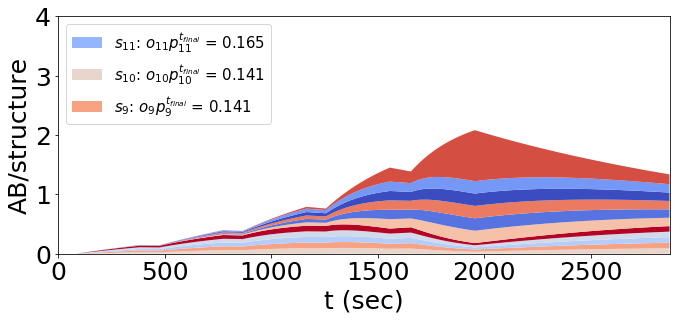

[array([1.22630929])]
('(fit_annealing) variable parameter: ', array([18.]), 'log10 variable parameter: ', array([1.25527251]))
basinhopping step 0: f 974.01
basinhopping step 1: f 974.01 trial_f 974.01 accepted 1  lowest_f 974.01
('JR2_config_d', [1.2379442211009093])


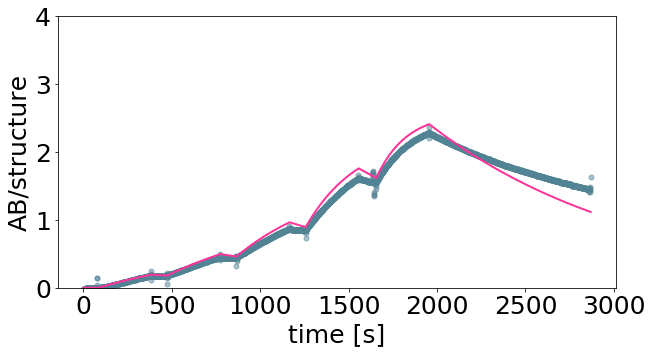

[17.29594203]


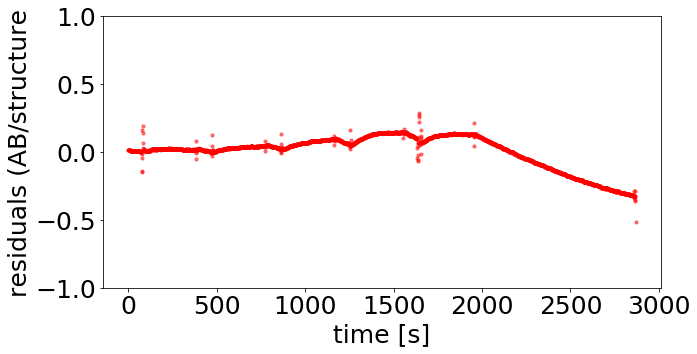

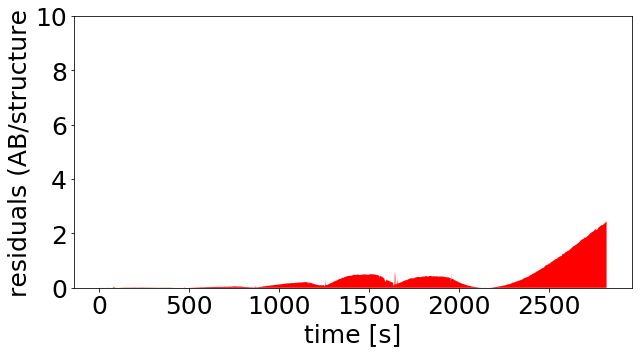

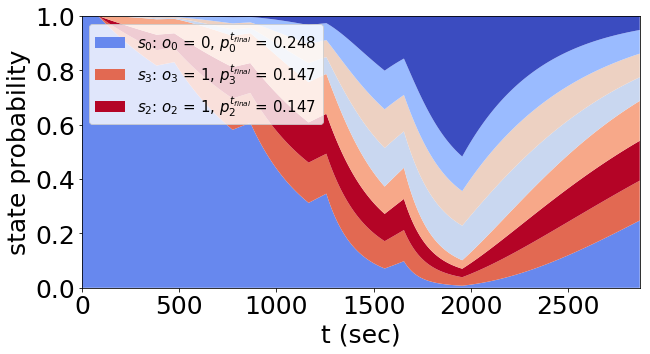

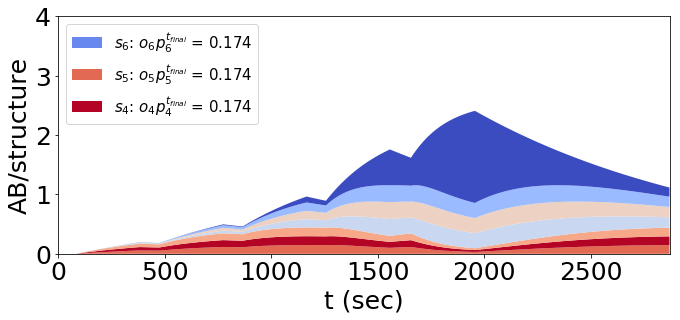

[array([1.23794422])]
('(fit_annealing) variable parameter: ', array([18.]), 'log10 variable parameter: ', array([1.25527251]))
basinhopping step 0: f 1576.02
basinhopping step 1: f 1576.02 trial_f 1576.02 accepted 1  lowest_f 1576.02
found new global minimum on step 1 with function value 1576.02
('JR2_config_e', [1.261035109062519])


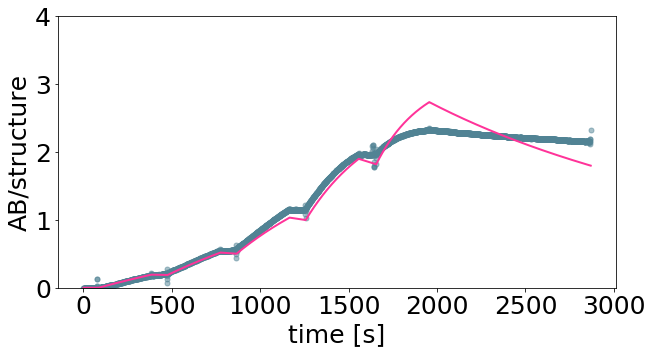

[18.24043155]


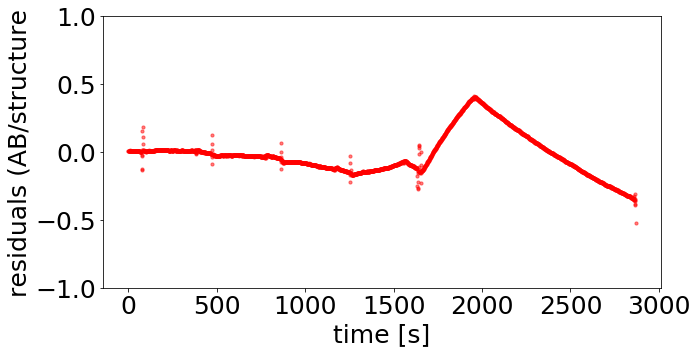

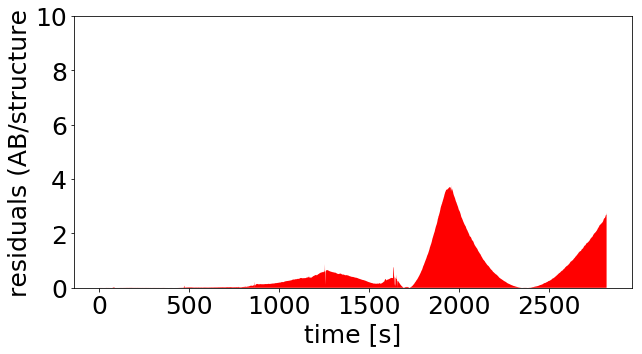

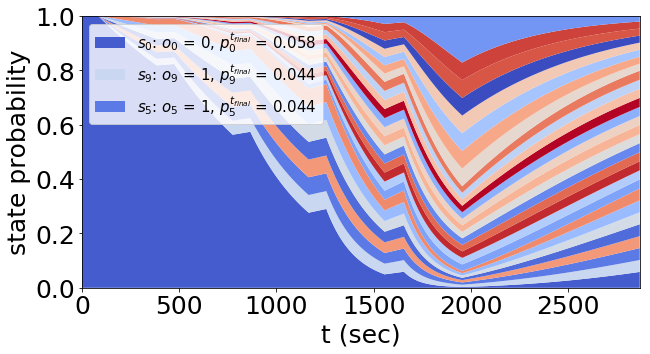

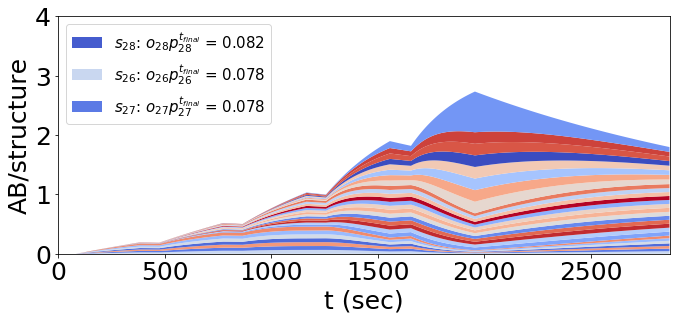

[array([1.26103511])]
('(fit_annealing) variable parameter: ', array([18.]), 'log10 variable parameter: ', array([1.25527251]))
basinhopping step 0: f 1796.53
basinhopping step 1: f 1796.53 trial_f 1796.53 accepted 1  lowest_f 1796.53
('JR2_config_f', [1.2527558067657474])


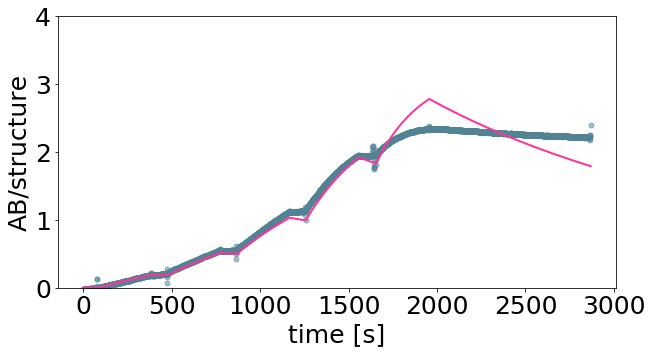

[17.89599323]


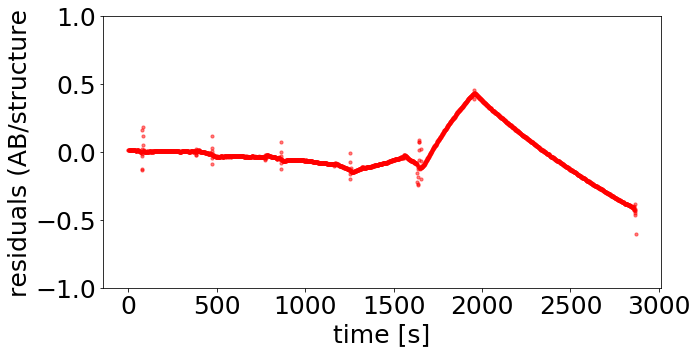

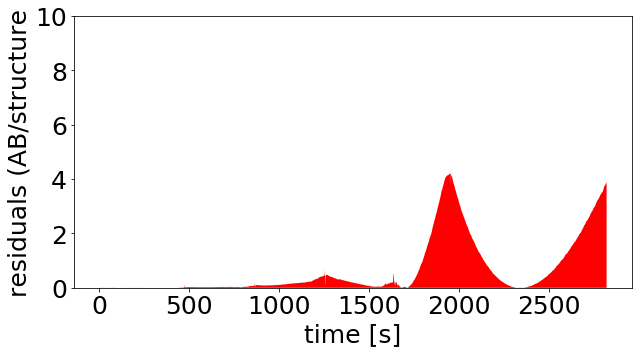

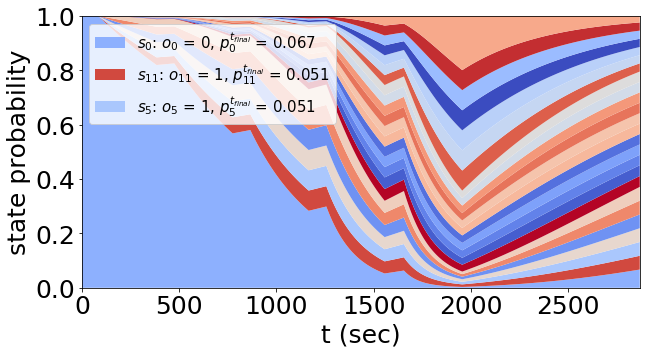

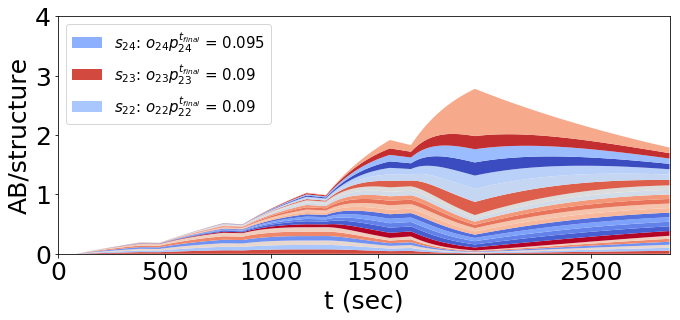

[array([1.25275581])]
('(fit_annealing) variable parameter: ', array([18.]), 'log10 variable parameter: ', array([1.25527251]))
basinhopping step 0: f 1300.31
basinhopping step 1: f 1300.31 trial_f 1300.31 accepted 1  lowest_f 1300.31
found new global minimum on step 1 with function value 1300.31
('JR2_config_g', [1.2515059444322576])


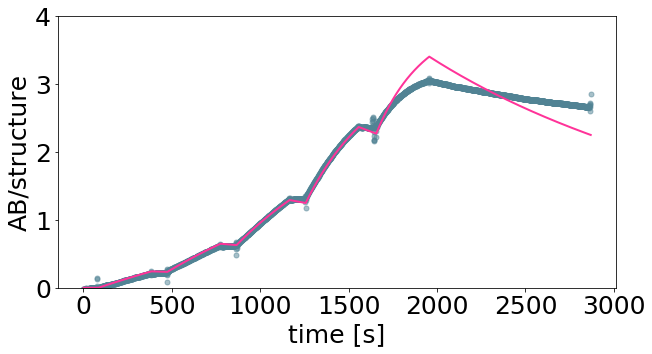

[17.84456413]


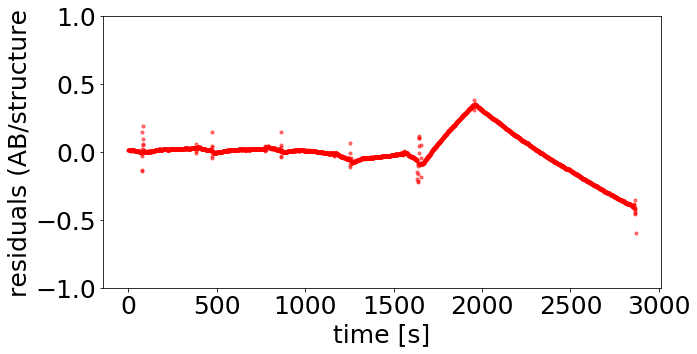

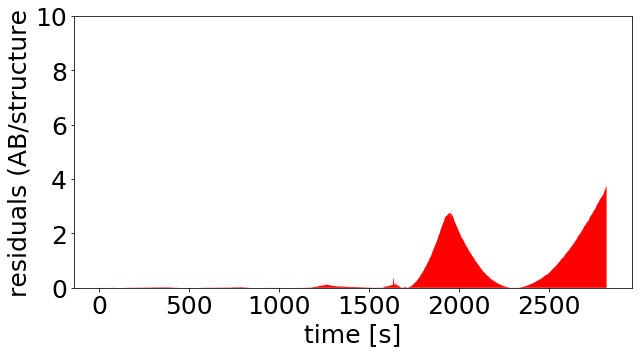

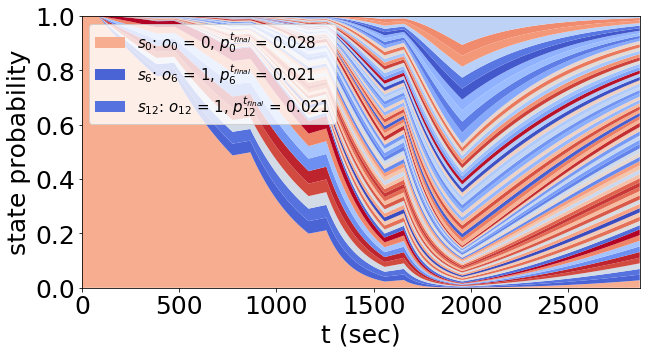

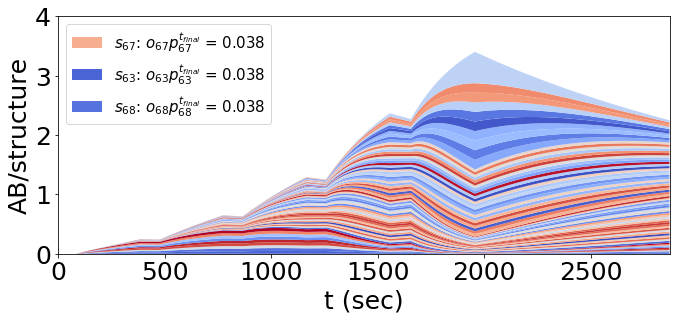

[array([1.25150594])]
('(fit_annealing) variable parameter: ', array([18.]), 'log10 variable parameter: ', array([1.25527251]))
basinhopping step 0: f 2453.48
basinhopping step 1: f 2453.48 trial_f 2453.48 accepted 1  lowest_f 2453.48
('JR2_config_h', [1.2478201428268907])


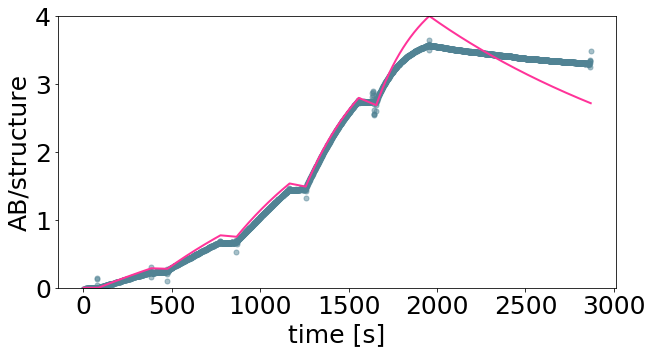

[17.69376043]


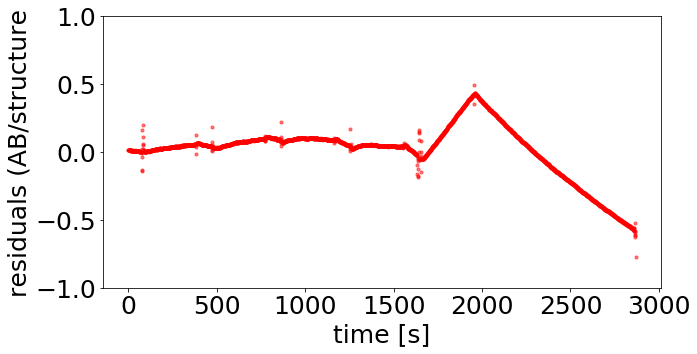

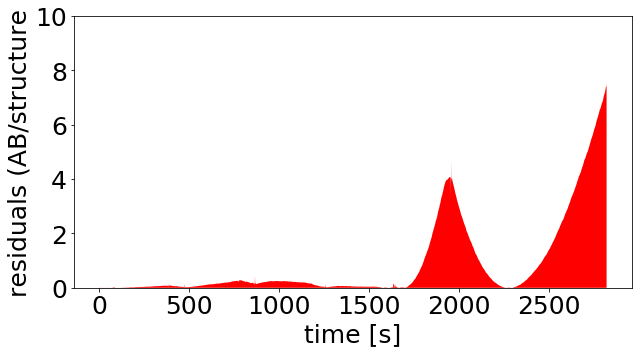

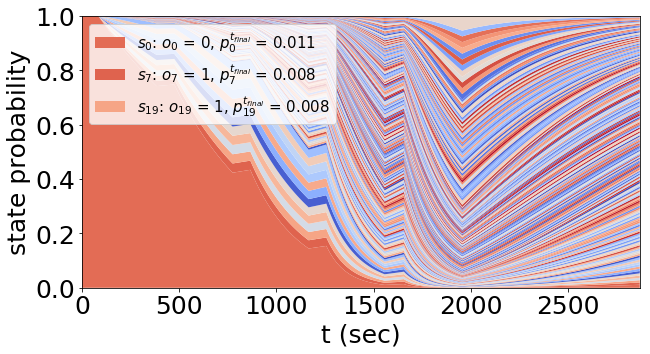

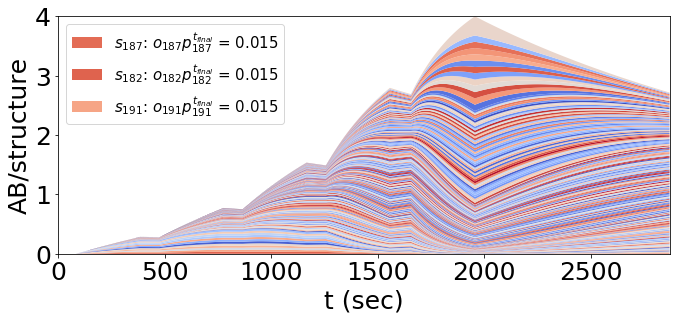

[array([1.24782014])]
('(fit_annealing) variable parameter: ', array([ 1.,  1., 18.]), 'log10 variable parameter: ', array([0.        , 0.        , 1.25527251]))
basinhopping step 0: f 8.78267
basinhopping step 1: f 8.78267 trial_f 8.78267 accepted 1  lowest_f 8.78267
found new global minimum on step 1 with function value 8.78267
('JR2_config_c', [-0.6216568223147996, -2.101088019022178, 1.25208167571557])


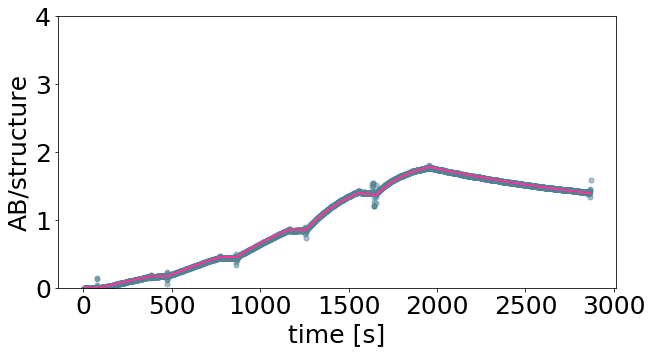

[2.38969887e-01 7.92340729e-03 1.78682358e+01]


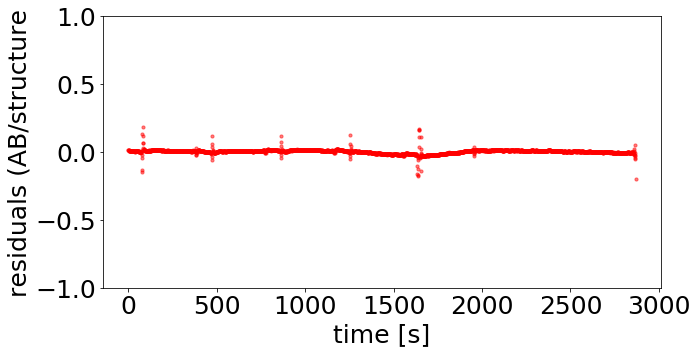

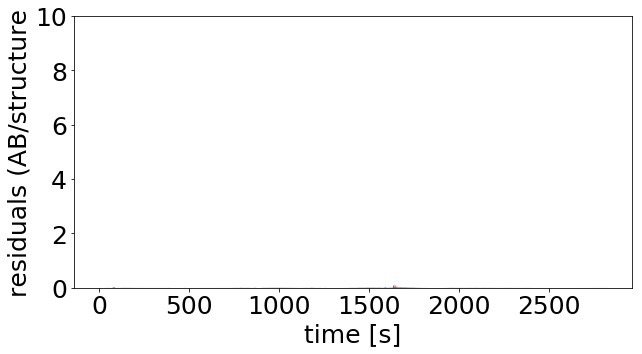

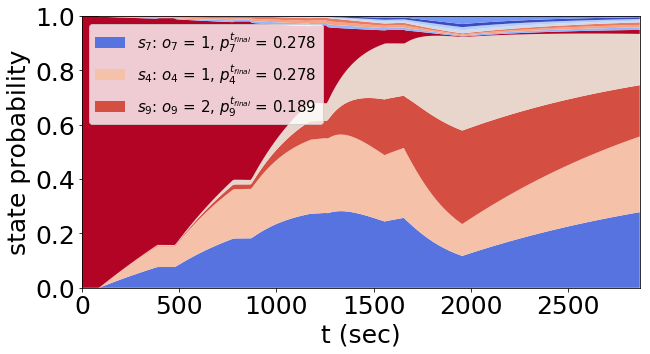

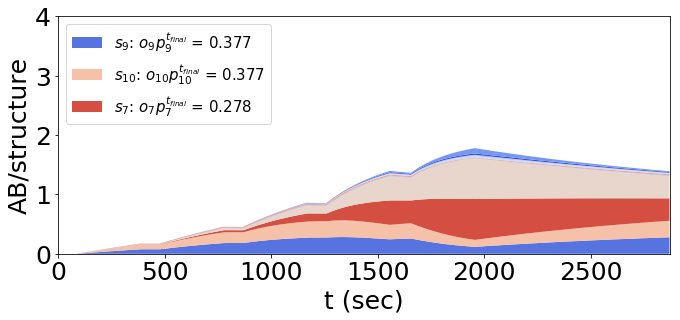

[array([-0.62165682, -2.10108802,  1.25208168])]
('(fit_annealing) variable parameter: ', array([18.]), 'log10 variable parameter: ', array([1.25527251]))
basinhopping step 0: f 12.9491
basinhopping step 1: f 12.9491 trial_f 12.9491 accepted 1  lowest_f 12.9491
('JR2_config_a', [1.2548273323300823])


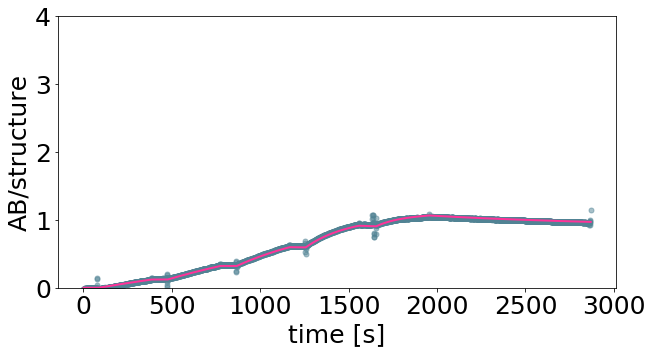

[17.98155859]


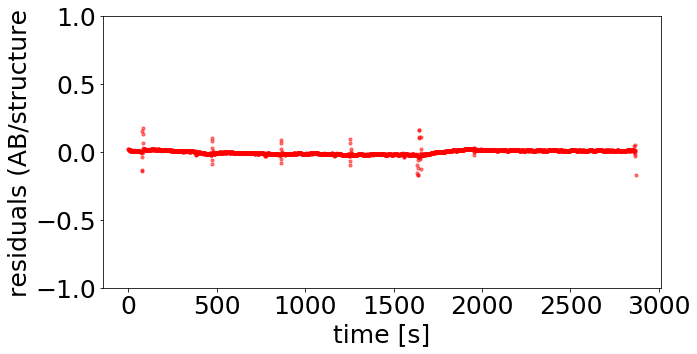

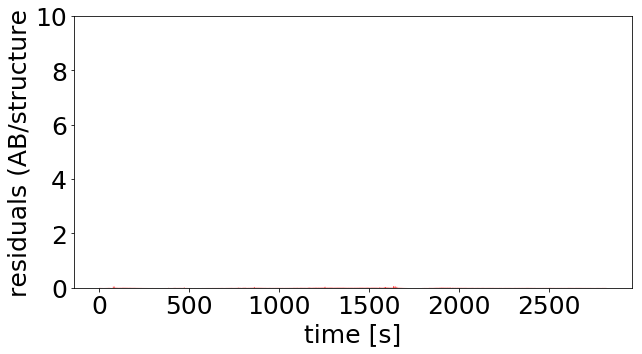

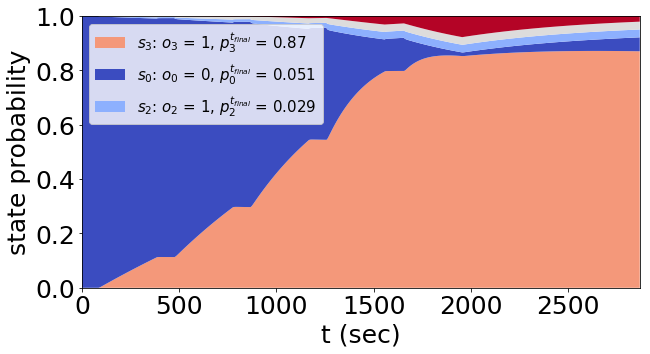

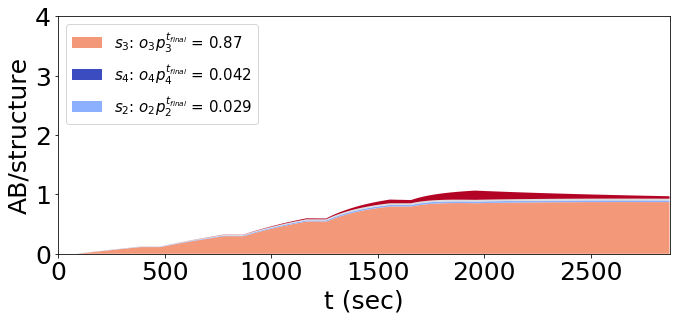

[array([1.25482733])]
('(fit_annealing) variable parameter: ', array([18.]), 'log10 variable parameter: ', array([1.25527251]))
basinhopping step 0: f 222.807
basinhopping step 1: f 222.807 trial_f 222.807 accepted 1  lowest_f 222.807
('JR2_config_b', [1.2387683829149592])


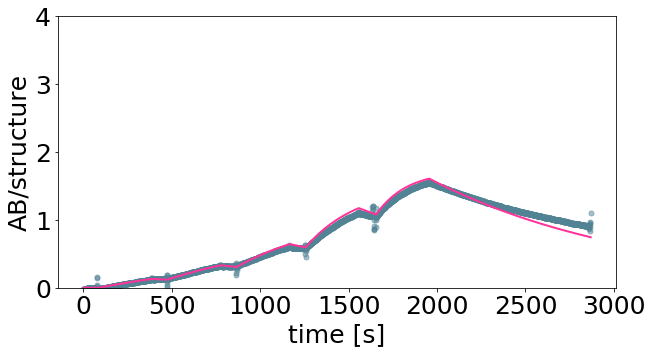

[17.32879575]


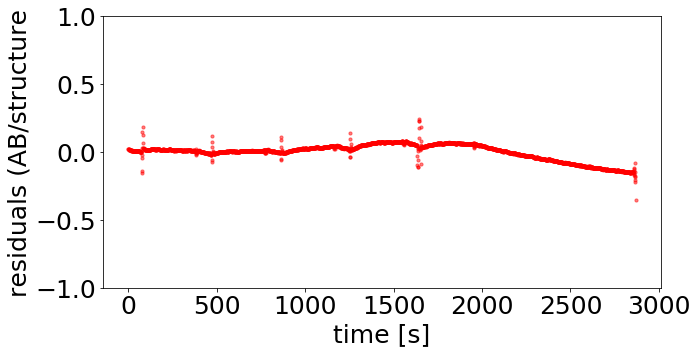

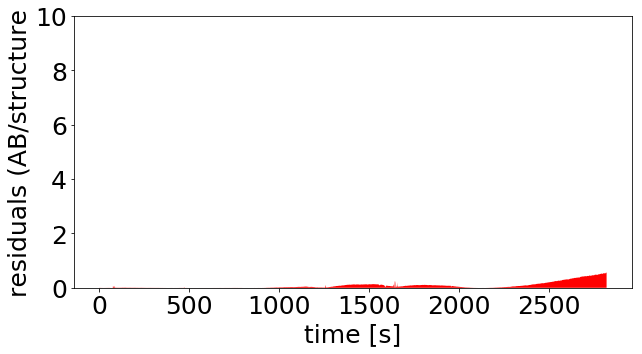

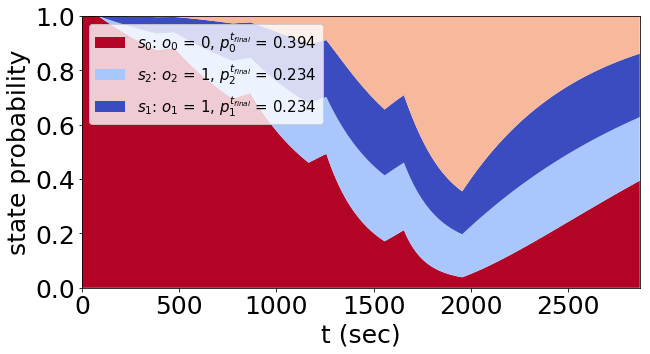

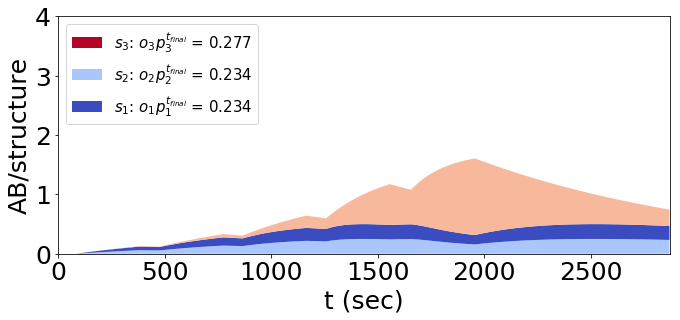

[array([1.23876838])]
('(fit_annealing) variable parameter: ', array([18.]), 'log10 variable parameter: ', array([1.25527251]))
basinhopping step 0: f 8.78267
basinhopping step 1: f 8.78267 trial_f 8.78267 accepted 1  lowest_f 8.78267
found new global minimum on step 1 with function value 8.78267
('JR2_config_c', [1.2520816772748895])


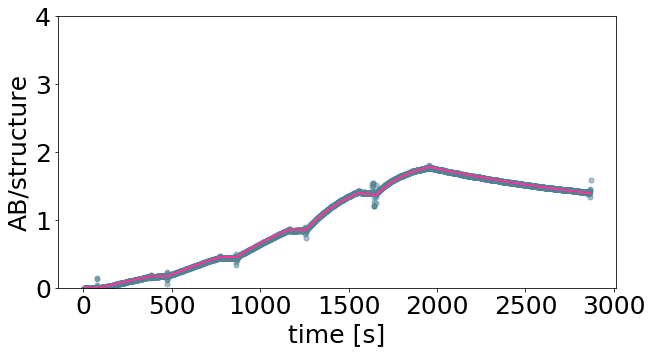

[17.86823589]


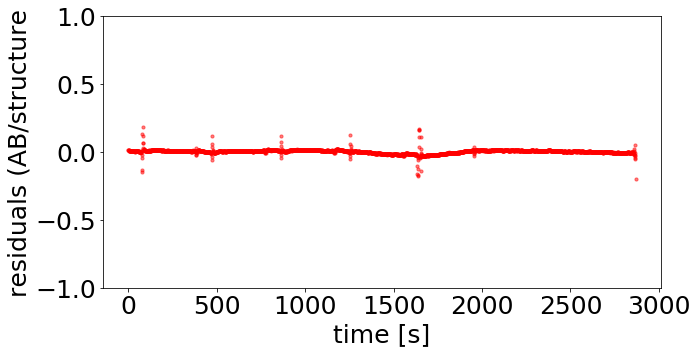

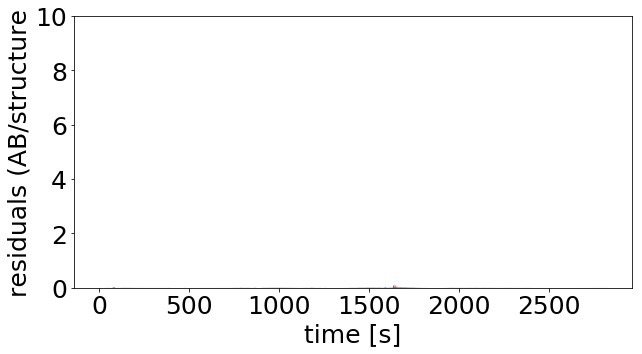

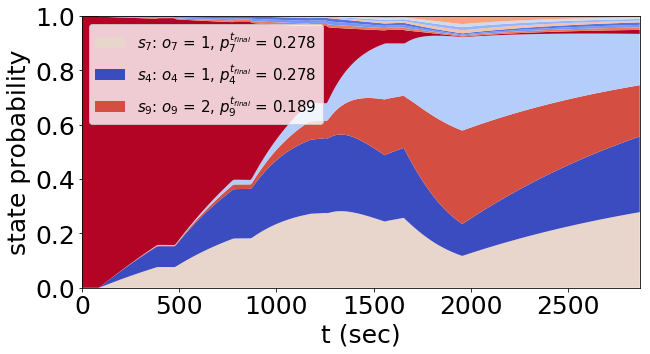

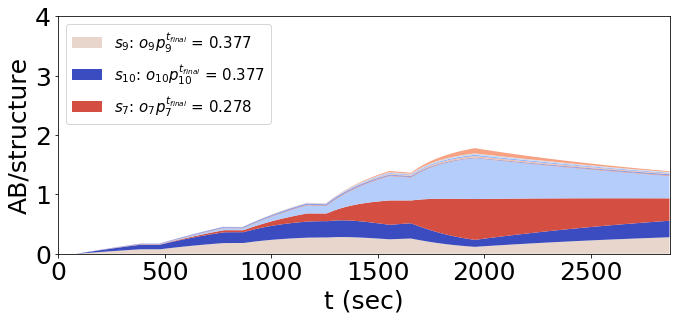

[array([1.25208168])]
('(fit_annealing) variable parameter: ', array([18.]), 'log10 variable parameter: ', array([1.25527251]))
basinhopping step 0: f 974.01
basinhopping step 1: f 974.01 trial_f 974.01 accepted 1  lowest_f 974.01
found new global minimum on step 1 with function value 974.01
('JR2_config_d', [1.2379442211113372])


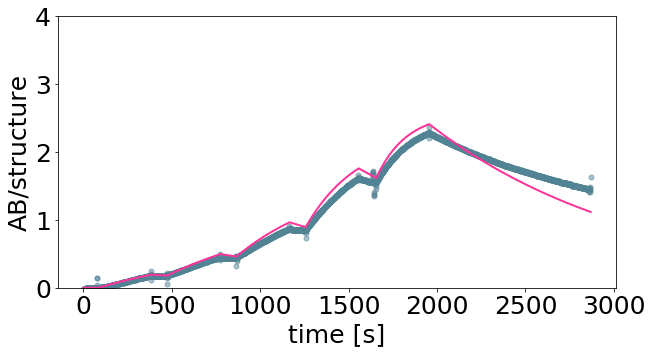

[17.29594203]


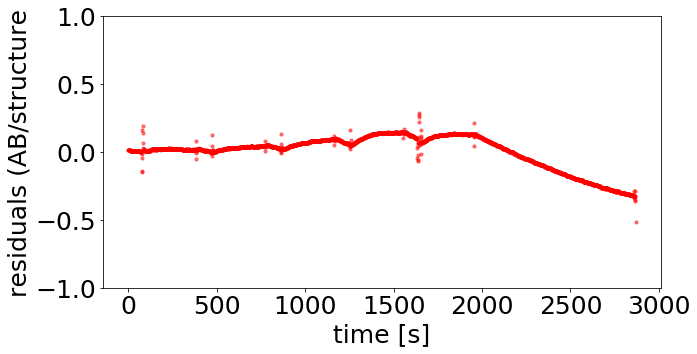

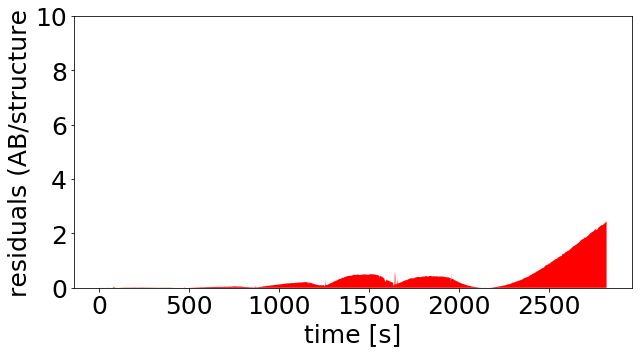

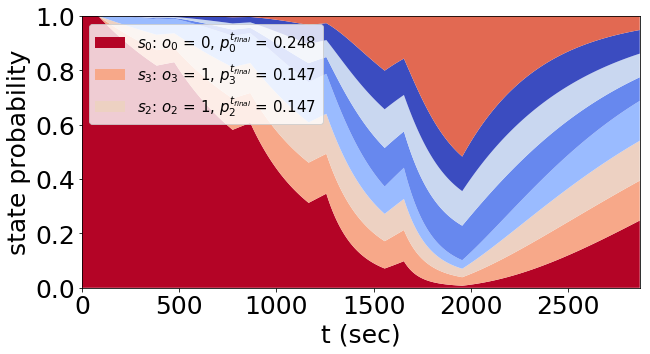

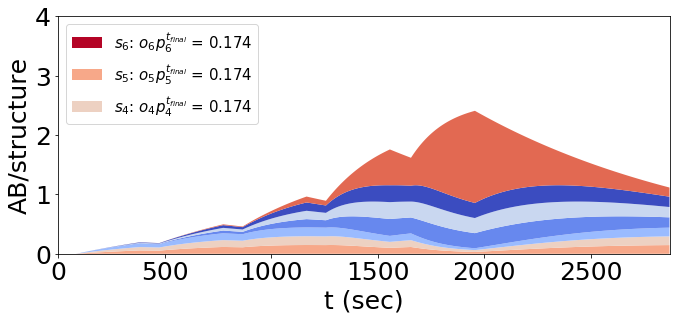

[array([1.23794422])]
('(fit_annealing) variable parameter: ', array([18.]), 'log10 variable parameter: ', array([1.25527251]))
basinhopping step 0: f 117.008
basinhopping step 1: f 117.008 trial_f 117.008 accepted 1  lowest_f 117.008
('JR2_config_e', [1.2980747774167116])


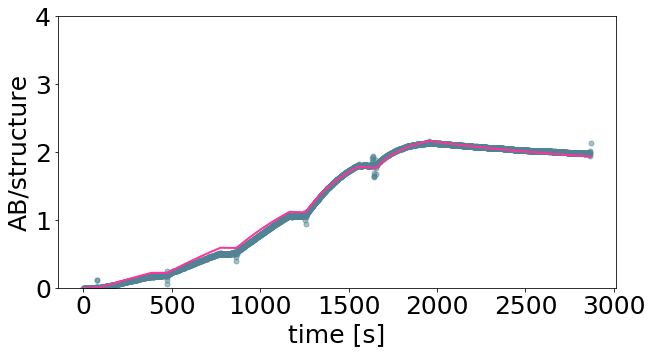

[19.86436915]


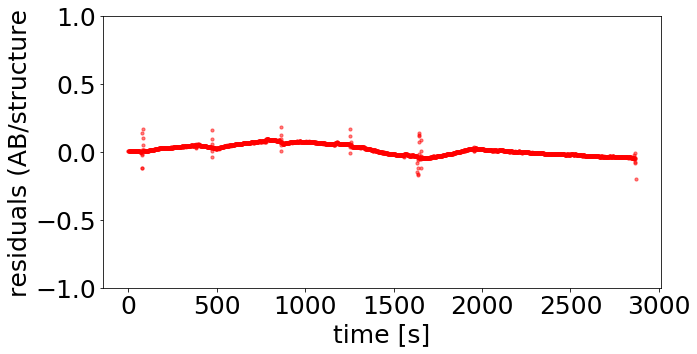

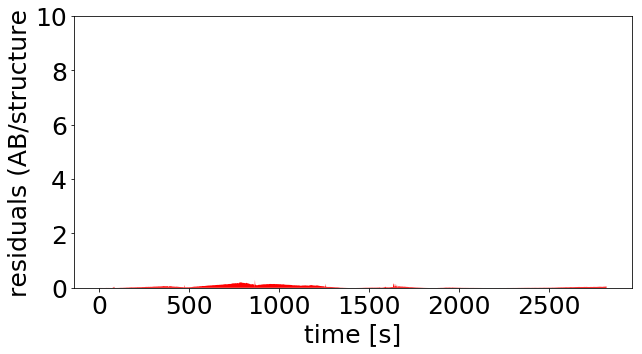

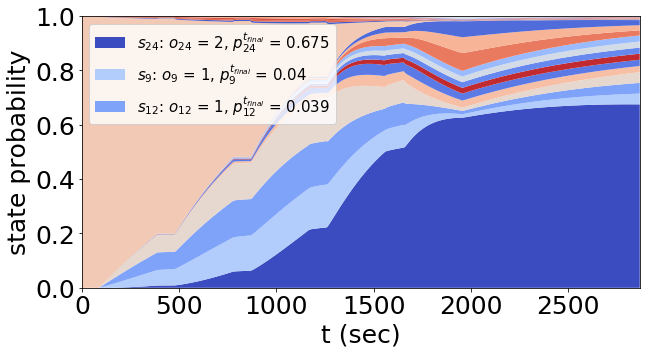

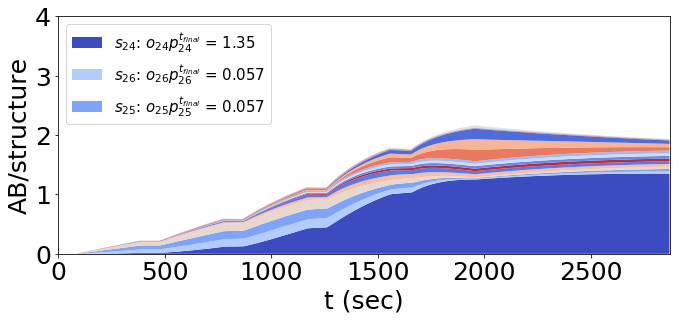

[array([1.29807478])]
('(fit_annealing) variable parameter: ', array([18.]), 'log10 variable parameter: ', array([1.25527251]))
basinhopping step 0: f 321.038
basinhopping step 1: f 321.038 trial_f 321.038 accepted 1  lowest_f 321.038
found new global minimum on step 1 with function value 321.038
('JR2_config_f', [1.2953408368238075])


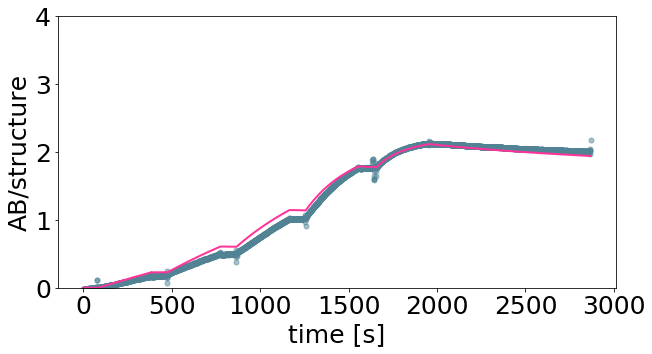

[19.73971312]


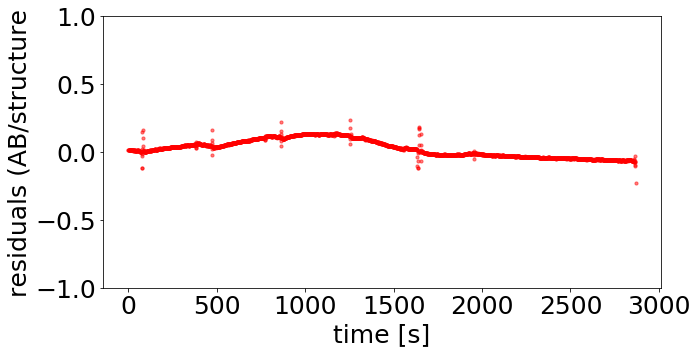

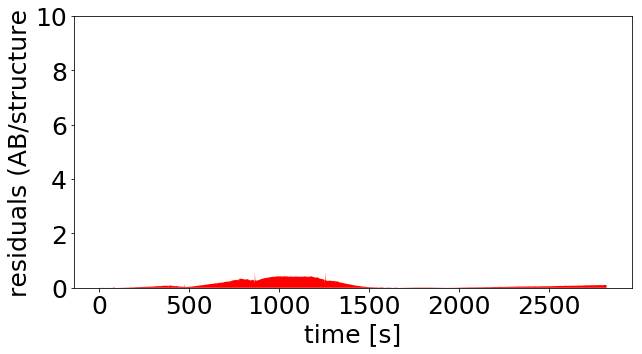

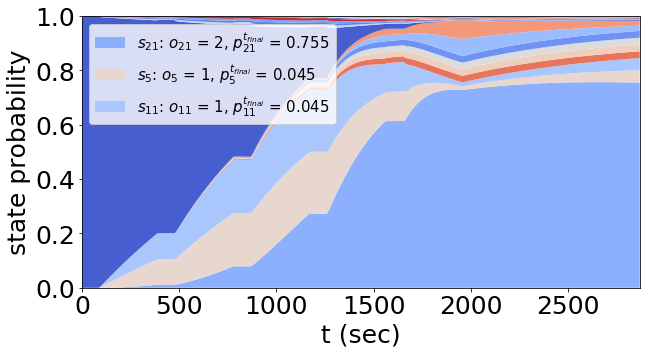

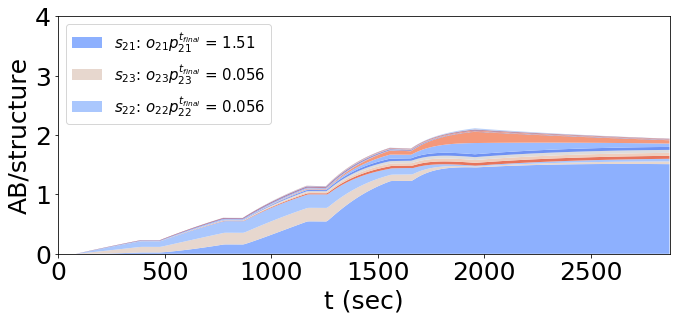

[array([1.29534084])]
('(fit_annealing) variable parameter: ', array([18.]), 'log10 variable parameter: ', array([1.25527251]))
basinhopping step 0: f 589.395
basinhopping step 1: f 589.395 trial_f 589.395 accepted 1  lowest_f 589.395
('JR2_config_g', [1.2864766999780701])


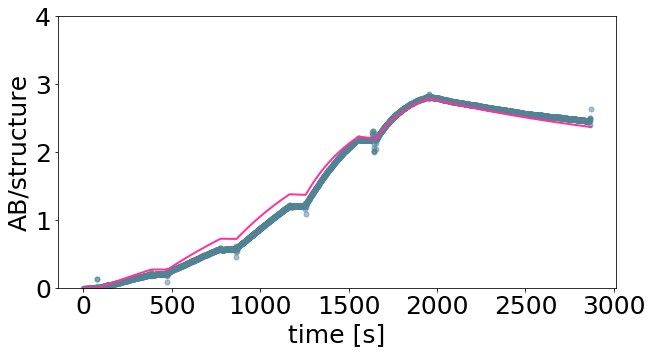

[19.34090091]


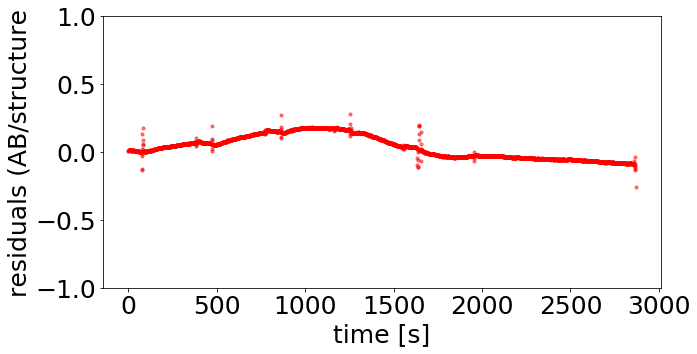

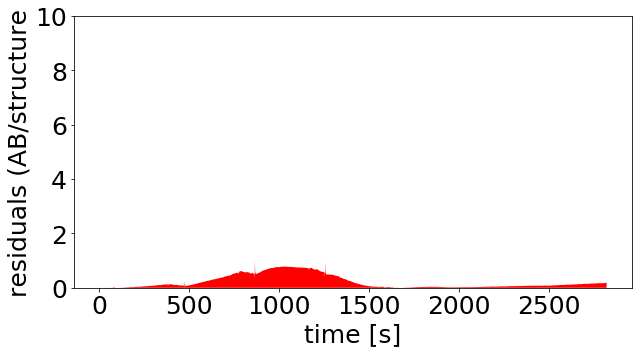

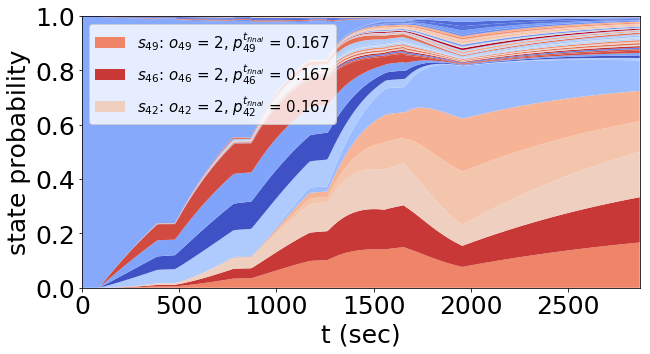

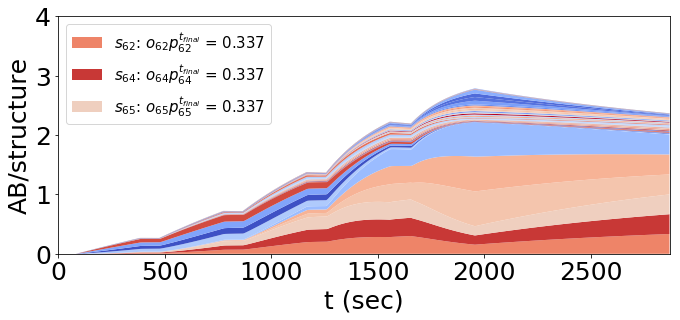

[array([1.2864767])]
('(fit_annealing) variable parameter: ', array([18.]), 'log10 variable parameter: ', array([1.25527251]))
basinhopping step 0: f 1749.97
basinhopping step 1: f 1749.97 trial_f 1749.97 accepted 1  lowest_f 1749.97
('JR2_config_h', [1.2880708049758456])


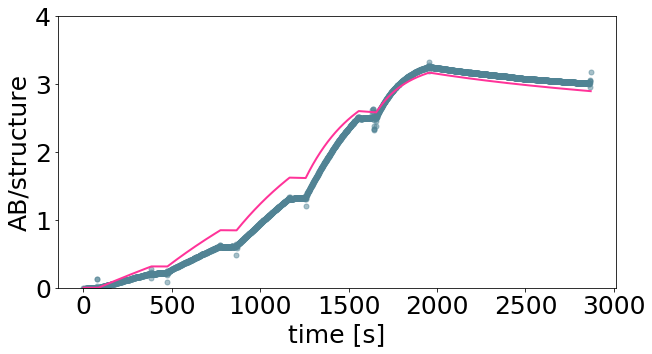

[19.41202335]


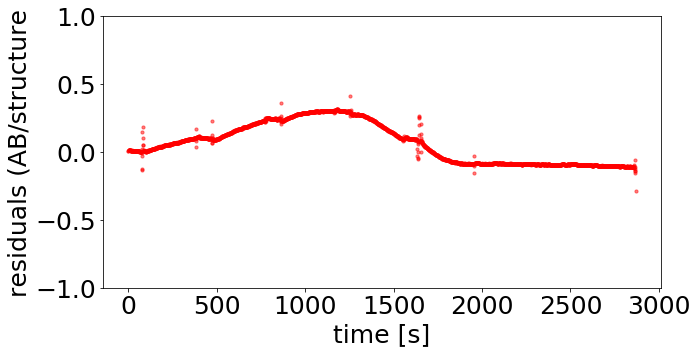

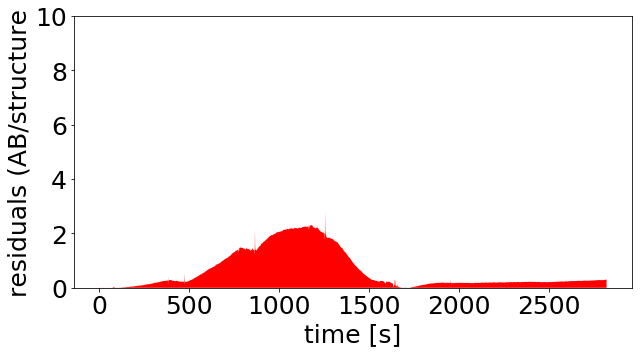

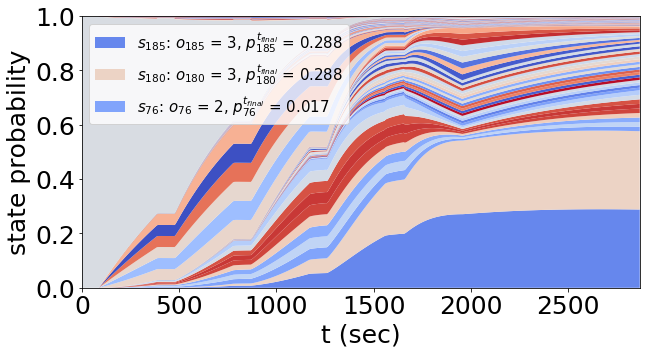

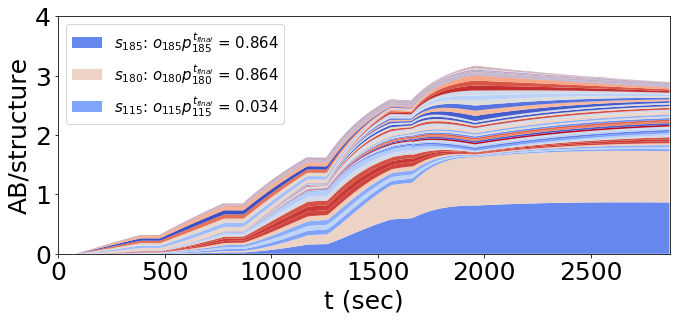

[array([1.2880708])]
('(fit_annealing) variable parameter: ', array([ 1.,  1., 18.]), 'log10 variable parameter: ', array([0.        , 0.        , 1.25527251]))
basinhopping step 0: f 974.01
basinhopping step 1: f 974.01 trial_f 974.01 accepted 1  lowest_f 974.01
('JR2_config_d', [0.0, 0.0, 1.2379442210747915])


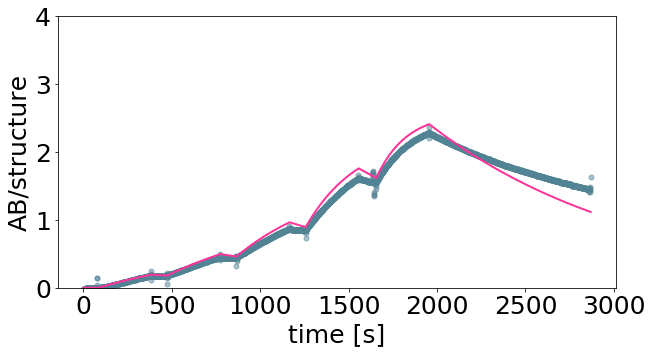

[ 1.          1.         17.29594203]


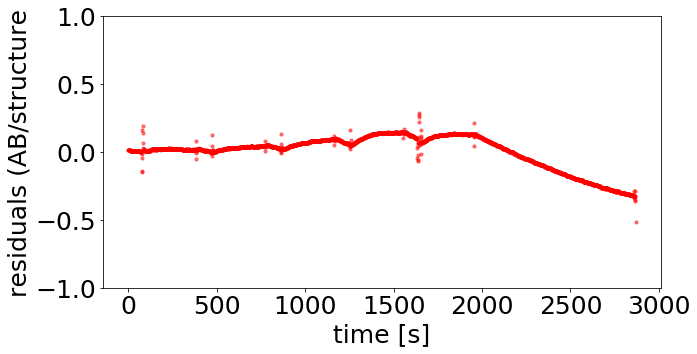

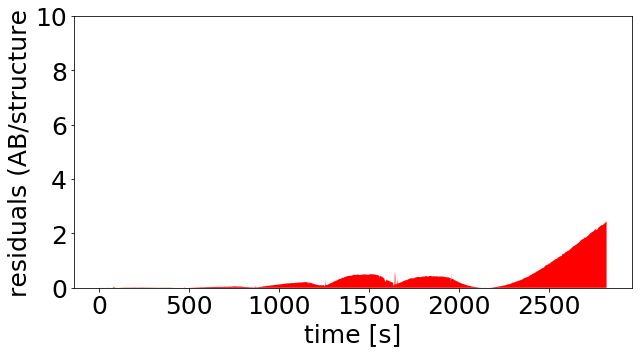

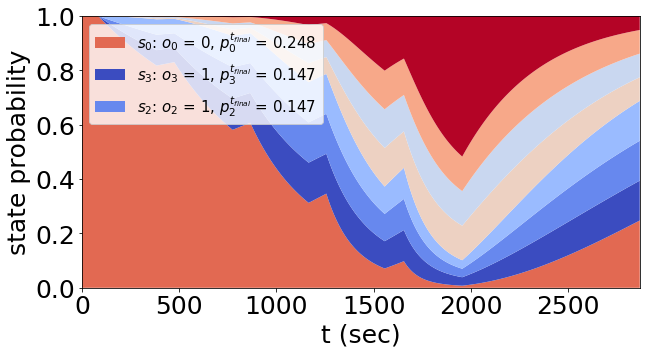

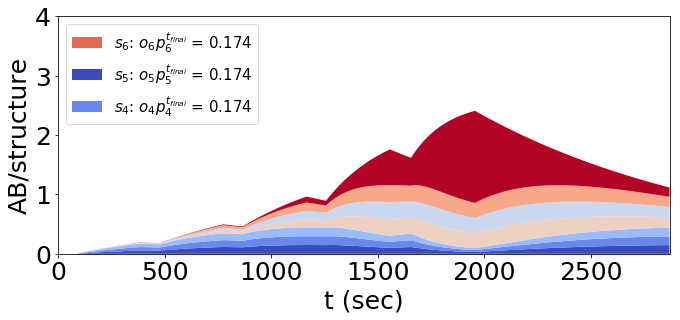

[array([0.        , 0.        , 1.23794422])]
('(fit_annealing) variable parameter: ', array([18.]), 'log10 variable parameter: ', array([1.25527251]))
basinhopping step 0: f 835.361
basinhopping step 1: f 835.361 trial_f 835.361 accepted 1  lowest_f 835.361
('JR2_config_a', [1.2163687006095172])


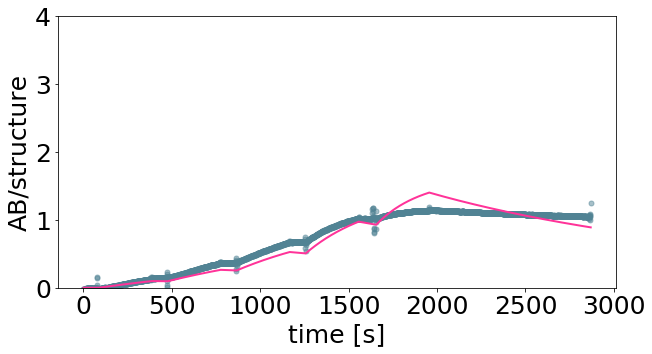

[16.45768329]


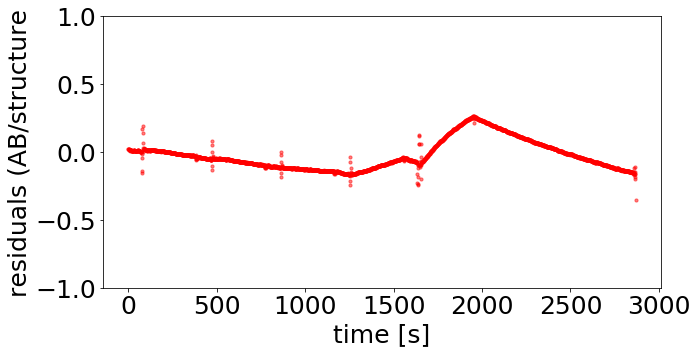

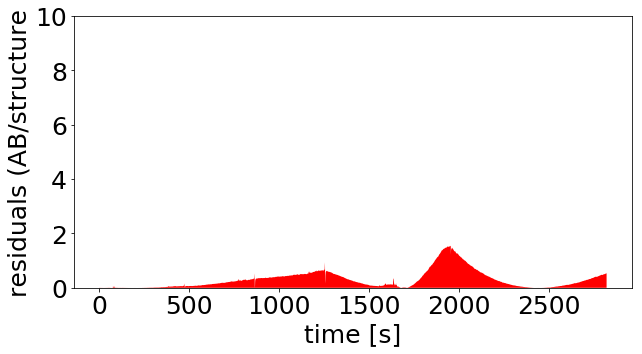

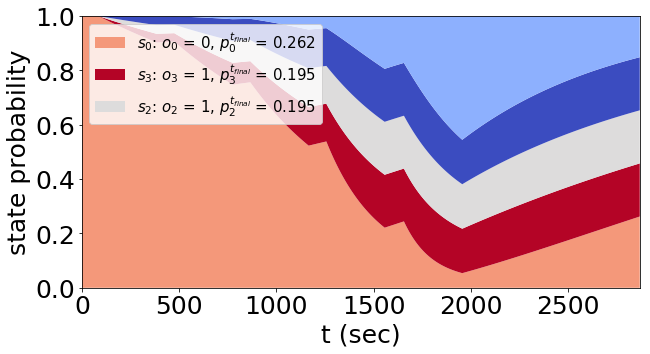

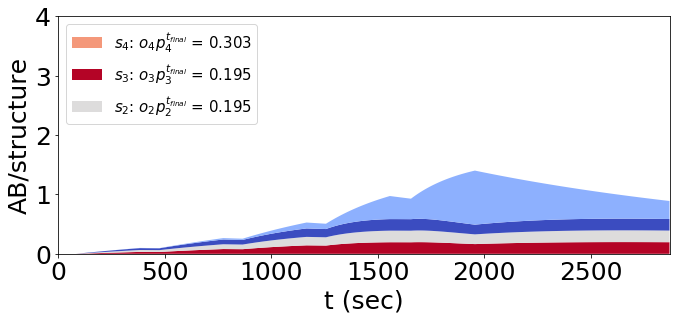

[array([1.2163687])]
('(fit_annealing) variable parameter: ', array([18.]), 'log10 variable parameter: ', array([1.25527251]))
basinhopping step 0: f 222.807
basinhopping step 1: f 222.807 trial_f 222.807 accepted 1  lowest_f 222.807
('JR2_config_b', [1.2387683829149592])


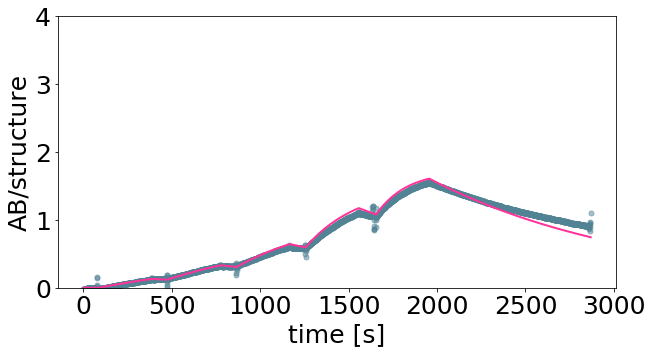

[17.32879575]


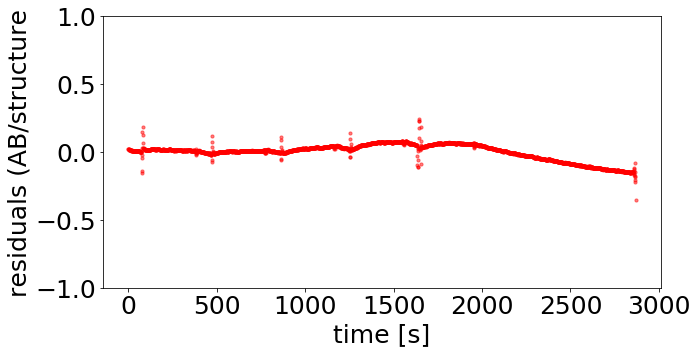

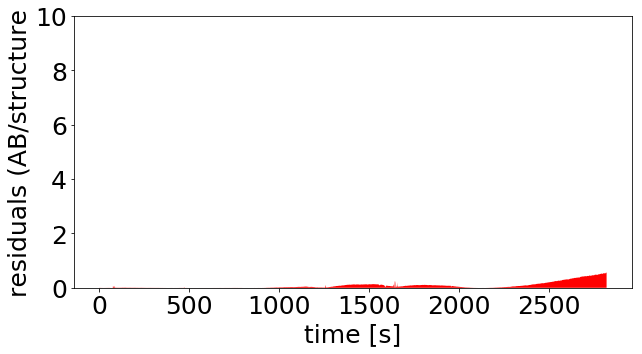

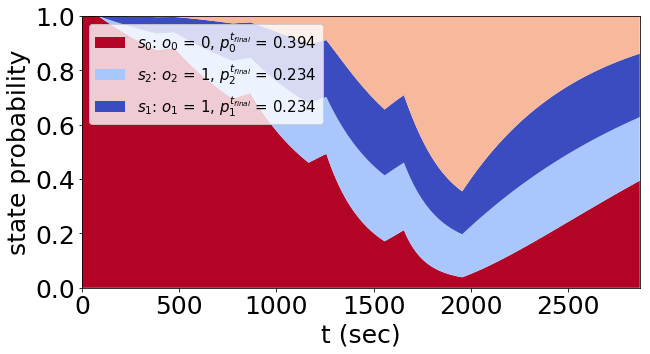

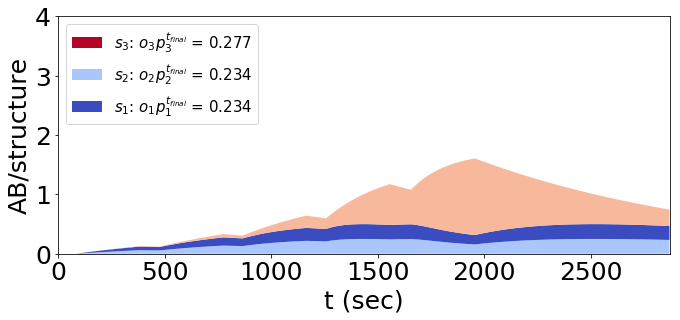

[array([1.23876838])]
('(fit_annealing) variable parameter: ', array([18.]), 'log10 variable parameter: ', array([1.25527251]))
basinhopping step 0: f 535.59
basinhopping step 1: f 535.59 trial_f 535.59 accepted 1  lowest_f 535.59
('JR2_config_c', [1.2263092858175142])


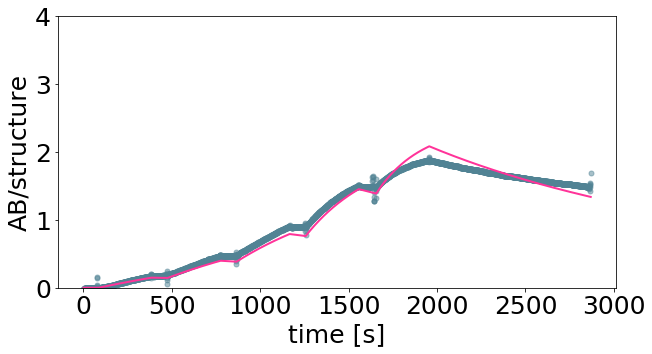

[16.83872816]


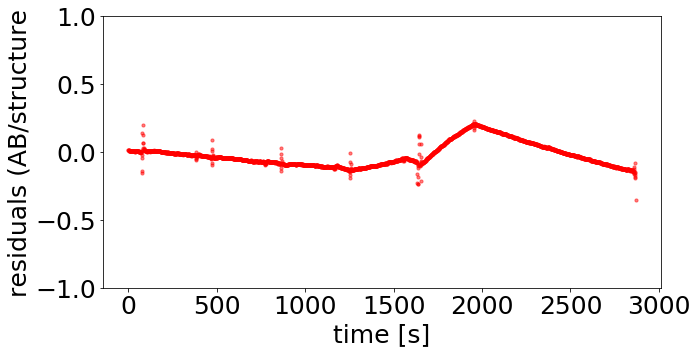

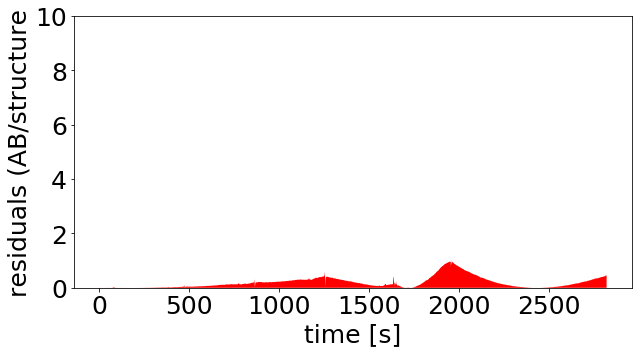

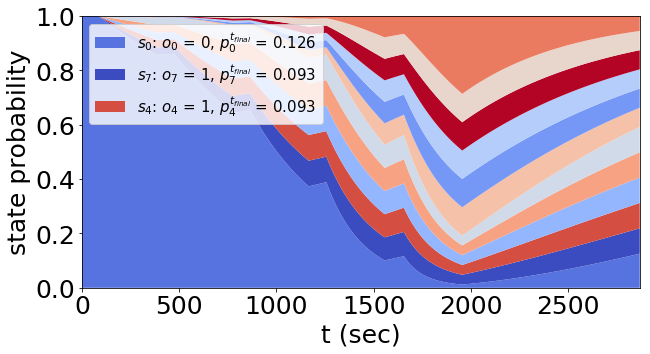

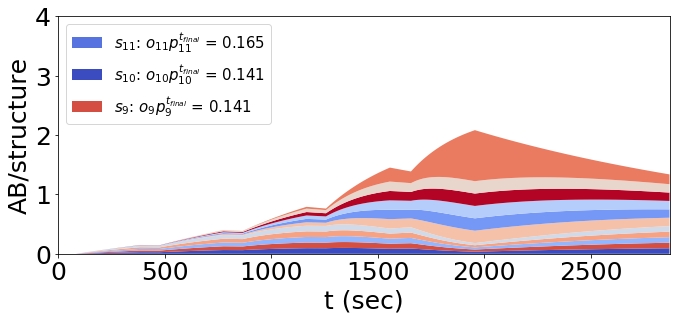

[array([1.22630929])]
('(fit_annealing) variable parameter: ', array([18.]), 'log10 variable parameter: ', array([1.25527251]))
basinhopping step 0: f 974.01
basinhopping step 1: f 974.01 trial_f 974.01 accepted 1  lowest_f 974.01
('JR2_config_d', [1.2379442211009093])


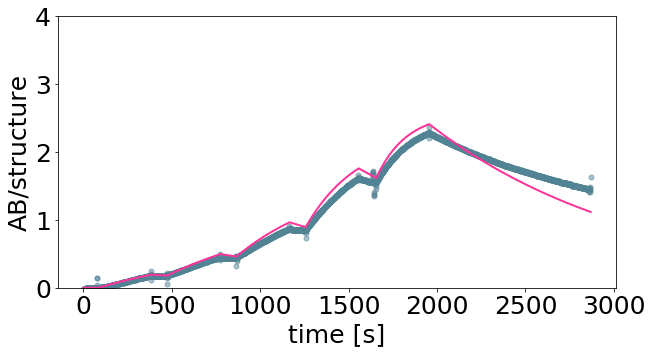

[17.29594203]


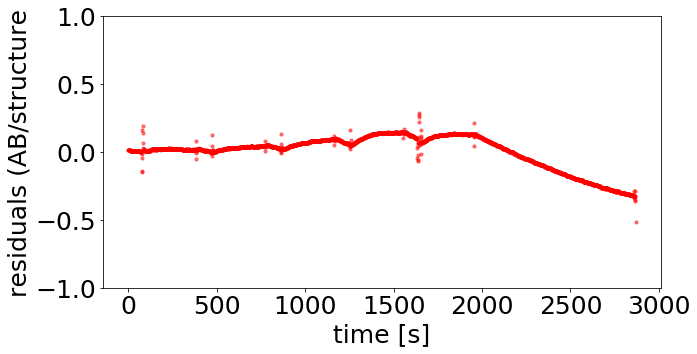

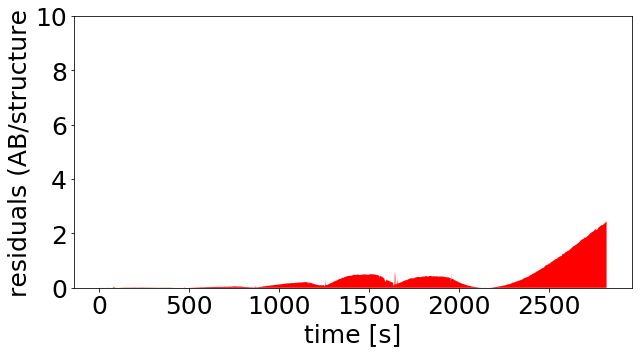

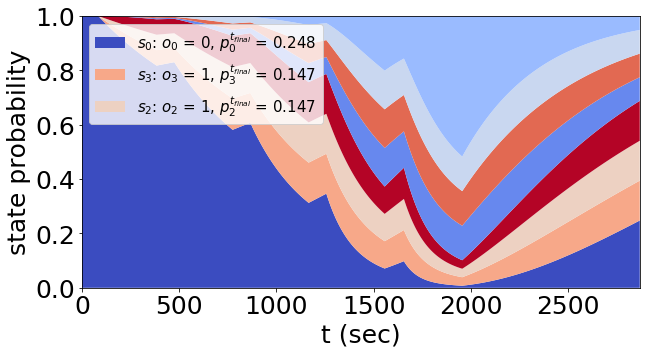

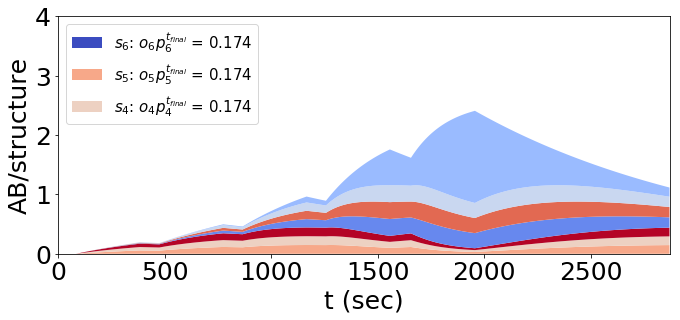

[array([1.23794422])]
('(fit_annealing) variable parameter: ', array([18.]), 'log10 variable parameter: ', array([1.25527251]))
basinhopping step 0: f 1576.02
basinhopping step 1: f 1576.02 trial_f 1576.02 accepted 1  lowest_f 1576.02
found new global minimum on step 1 with function value 1576.02
('JR2_config_e', [1.2610351090758523])


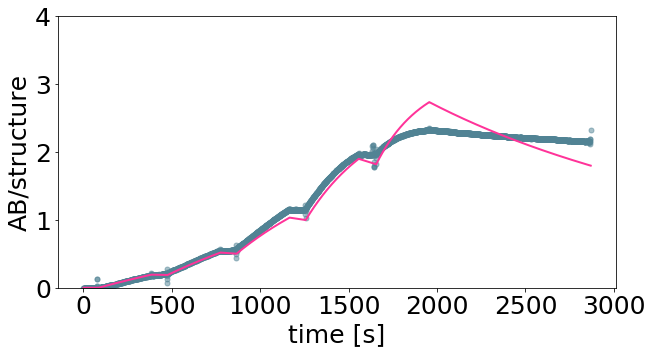

[18.24043155]


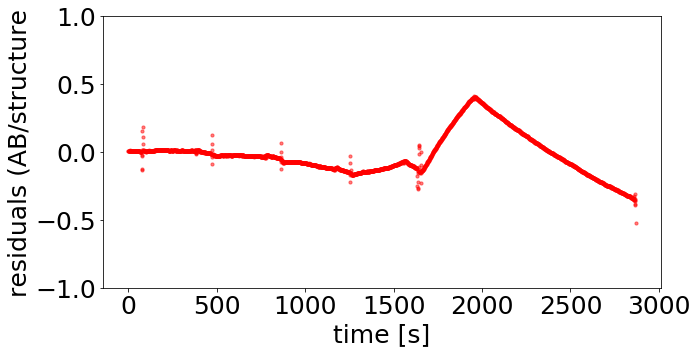

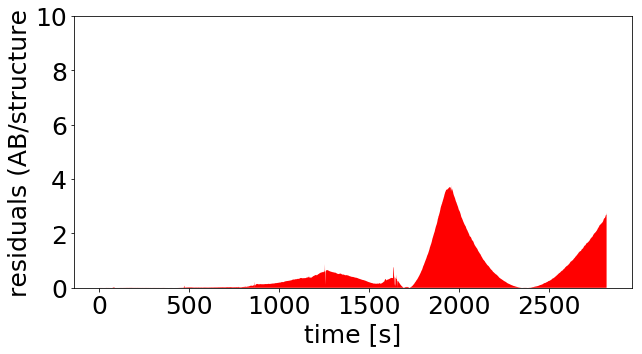

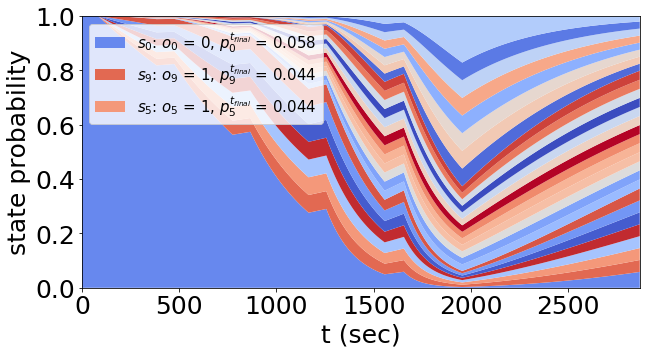

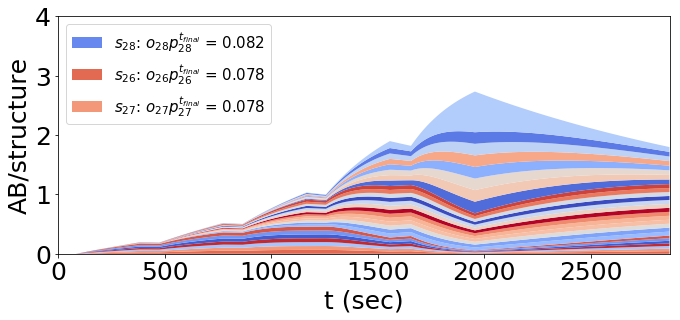

[array([1.26103511])]
('(fit_annealing) variable parameter: ', array([18.]), 'log10 variable parameter: ', array([1.25527251]))
basinhopping step 0: f 1796.53
basinhopping step 1: f 1796.53 trial_f 1796.53 accepted 1  lowest_f 1796.53
('JR2_config_f', [1.2527558067657474])


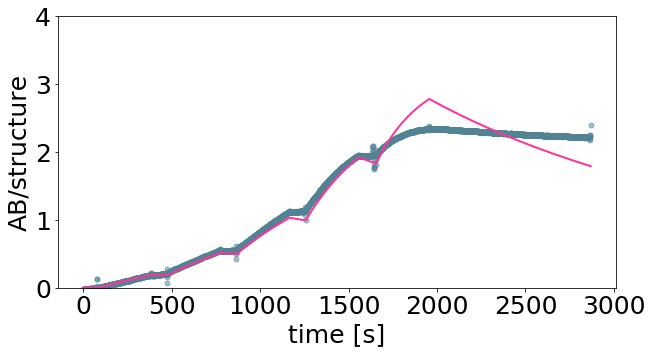

[17.89599323]


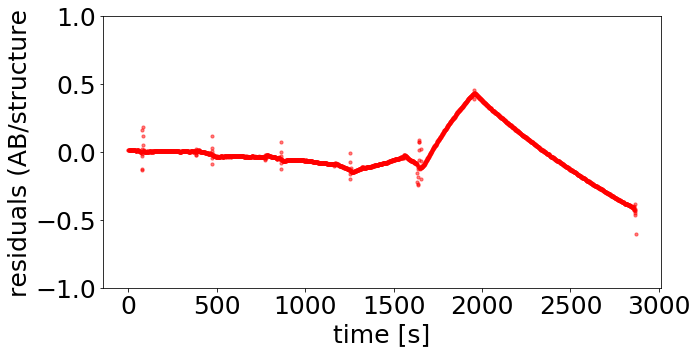

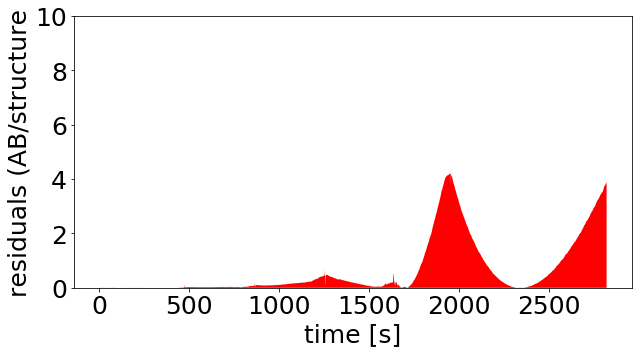

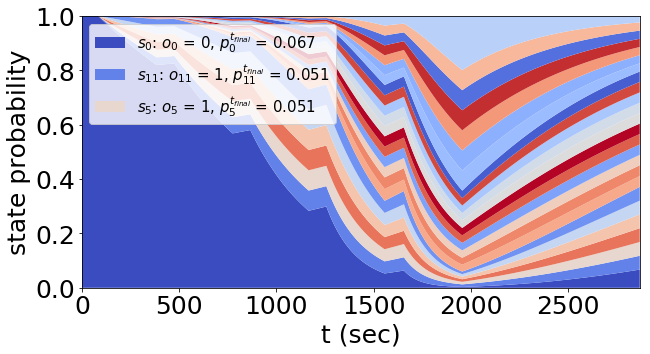

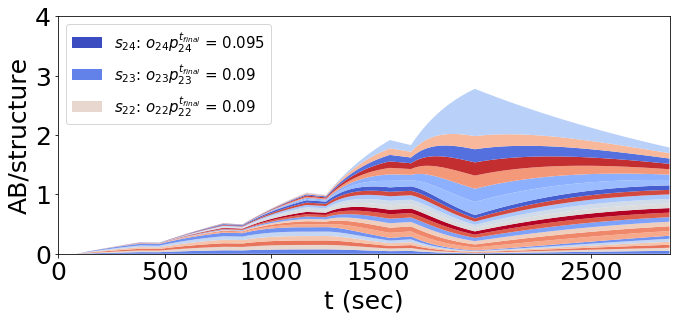

[array([1.25275581])]
('(fit_annealing) variable parameter: ', array([18.]), 'log10 variable parameter: ', array([1.25527251]))
basinhopping step 0: f 1300.31
basinhopping step 1: f 1300.31 trial_f 1300.31 accepted 1  lowest_f 1300.31
('JR2_config_g', [1.2515059162266469])


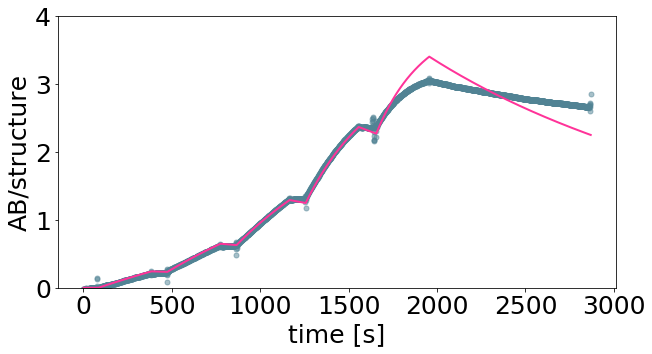

[17.84456297]


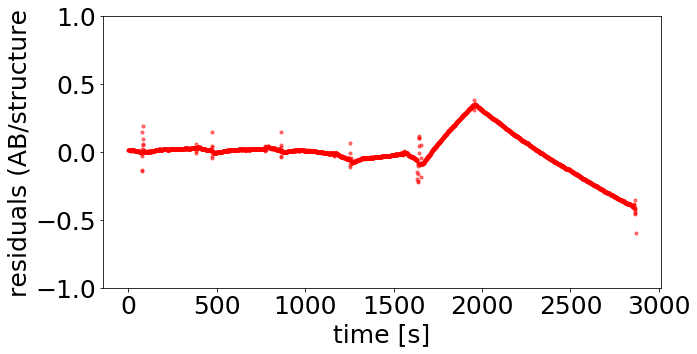

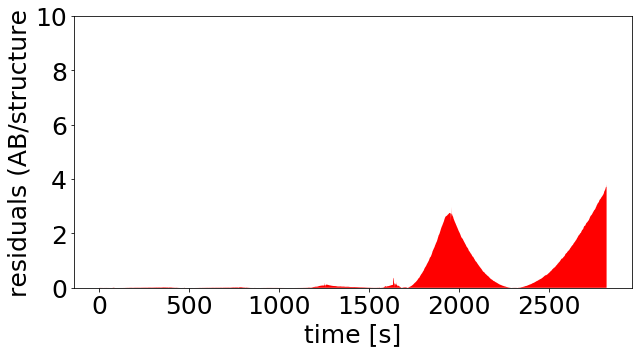

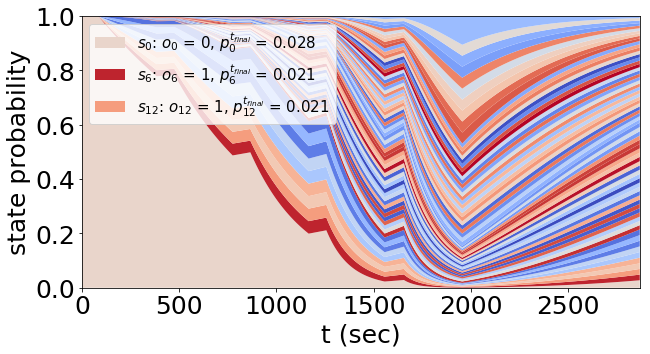

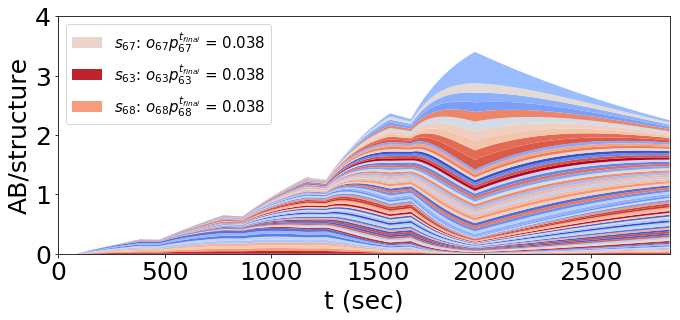

[array([1.25150592])]
('(fit_annealing) variable parameter: ', array([18.]), 'log10 variable parameter: ', array([1.25527251]))
basinhopping step 0: f 2453.48
basinhopping step 1: f 2453.48 trial_f 2453.48 accepted 1  lowest_f 2453.48
('JR2_config_h', [1.2478201428268907])


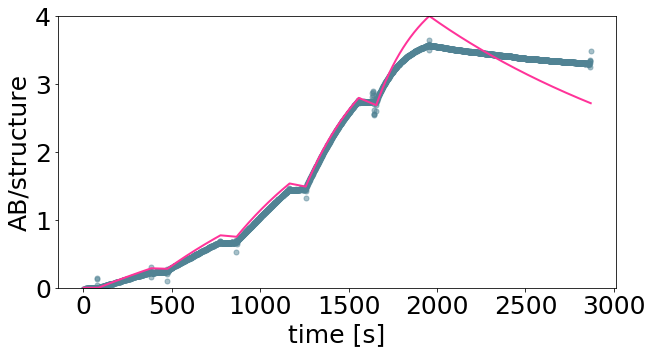

[17.69376043]


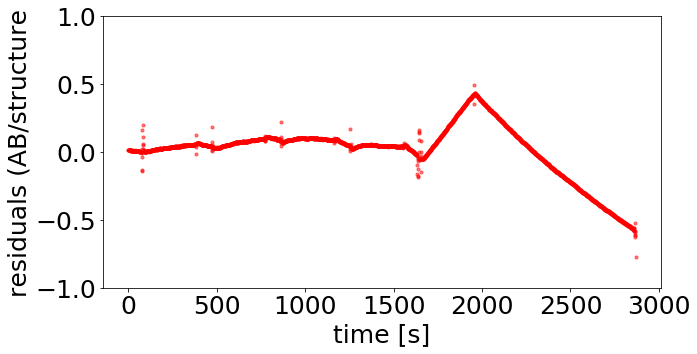

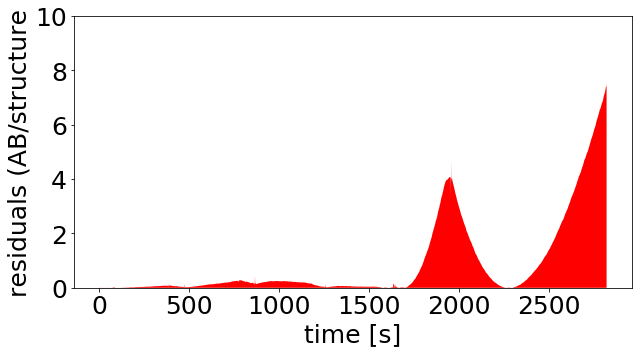

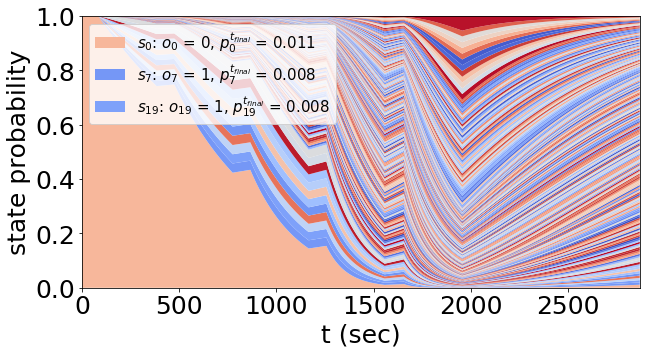

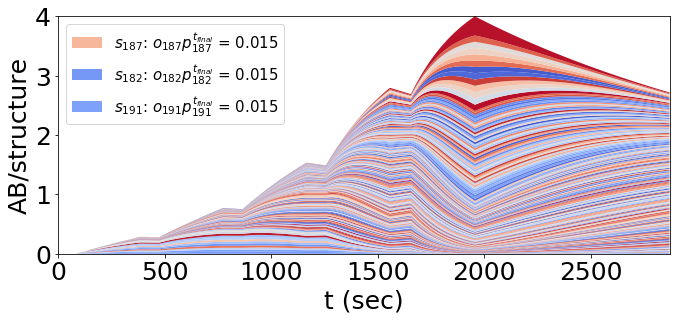

[array([1.24782014])]
('(fit_annealing) variable parameter: ', array([ 1.,  1., 18.]), 'log10 variable parameter: ', array([0.        , 0.        , 1.25527251]))
basinhopping step 0: f 58.7742
basinhopping step 1: f 58.7742 trial_f 58.7742 accepted 1  lowest_f 58.7742
('JR2_config_e', [0.07702603027962396, -1.42805684738099, 1.3096835915714882])


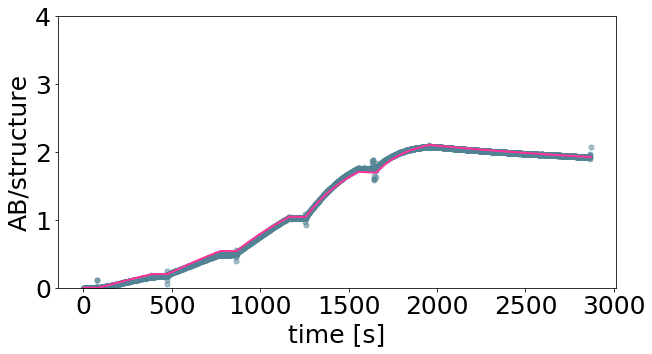

[ 1.19405967  0.03732013 20.40250963]


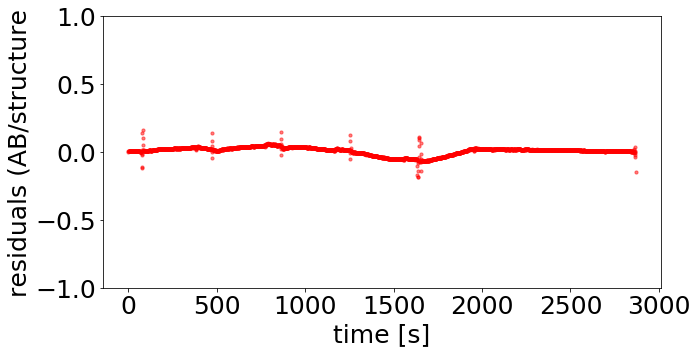

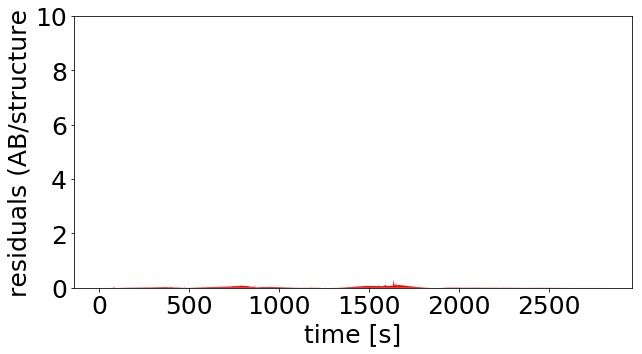

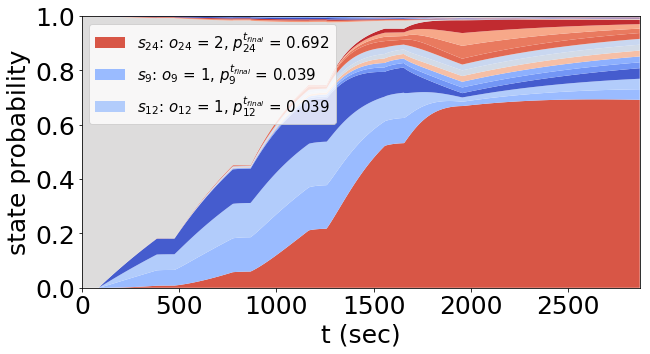

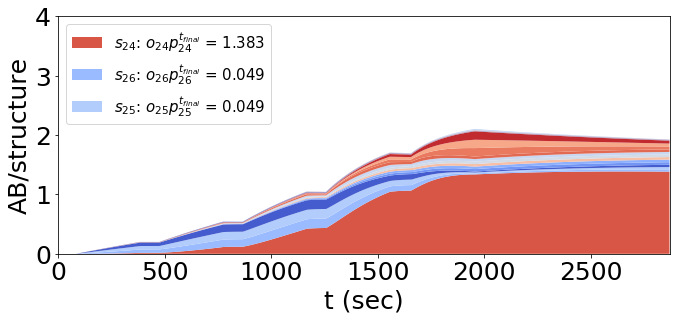

[array([ 0.07702603, -1.42805685,  1.30968359])]
('(fit_annealing) variable parameter: ', array([18.]), 'log10 variable parameter: ', array([1.25527251]))
basinhopping step 0: f 79.2141
basinhopping step 1: f 79.2141 trial_f 79.2141 accepted 1  lowest_f 79.2141
found new global minimum on step 1 with function value 79.2141
('JR2_config_a', [1.2676627812428378])


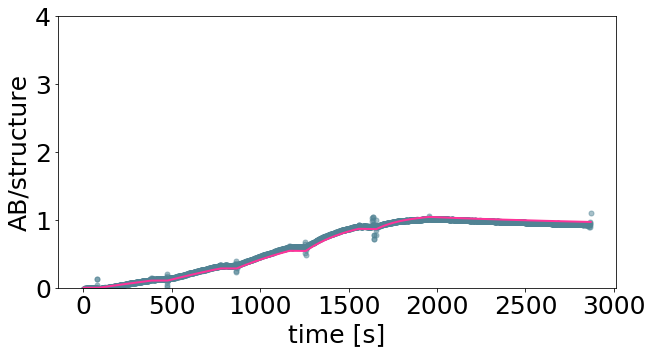

[18.52092961]


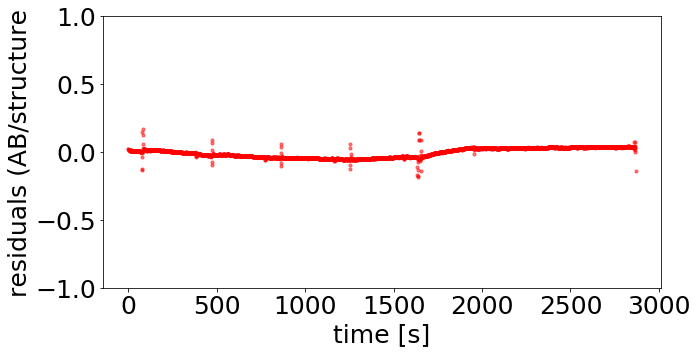

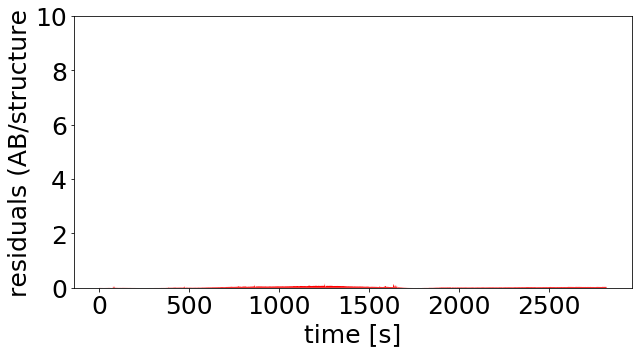

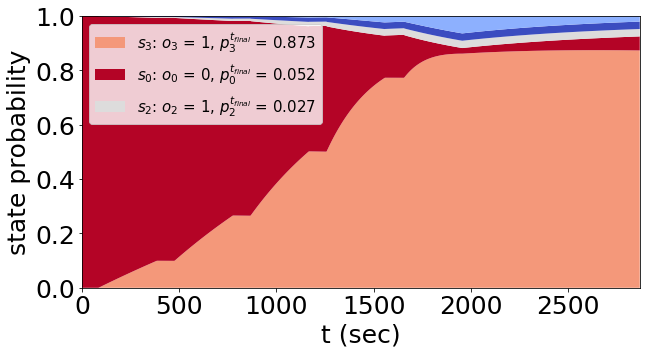

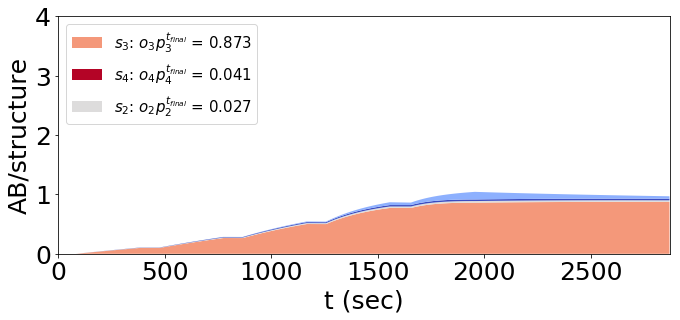

[array([1.26766278])]
('(fit_annealing) variable parameter: ', array([18.]), 'log10 variable parameter: ', array([1.25527251]))
basinhopping step 0: f 222.807
basinhopping step 1: f 222.807 trial_f 222.807 accepted 1  lowest_f 222.807
('JR2_config_b', [1.2387683829149592])


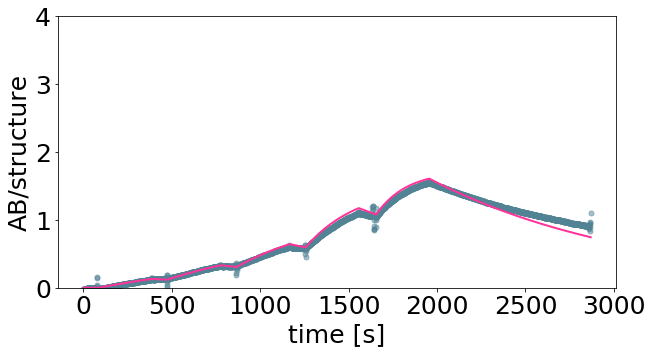

[17.32879575]


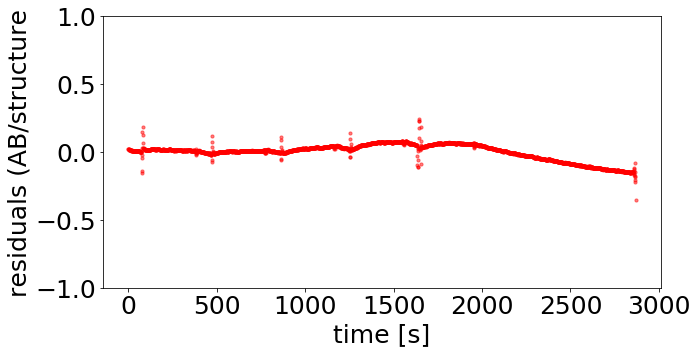

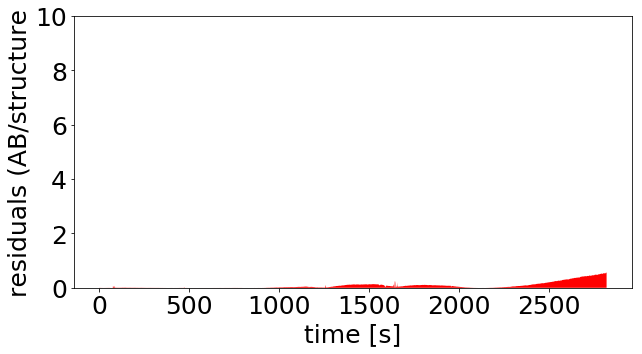

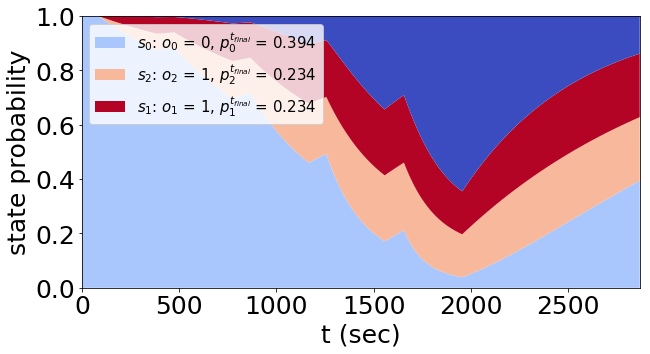

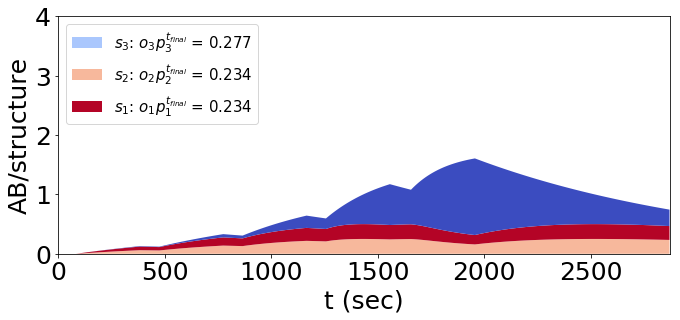

[array([1.23876838])]
('(fit_annealing) variable parameter: ', array([18.]), 'log10 variable parameter: ', array([1.25527251]))
basinhopping step 0: f 66.9478
basinhopping step 1: f 66.9478 trial_f 66.9478 accepted 1  lowest_f 66.9478
('JR2_config_c', [1.2629701810537066])


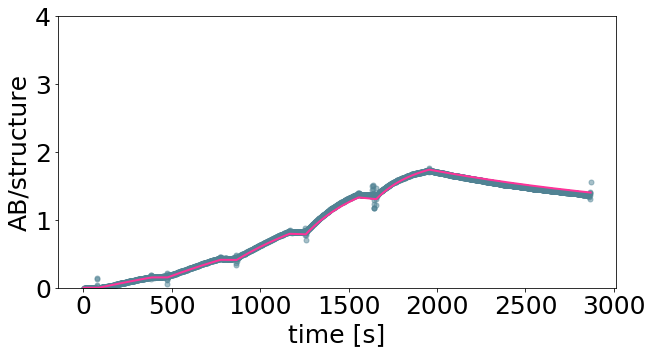

[18.32188619]


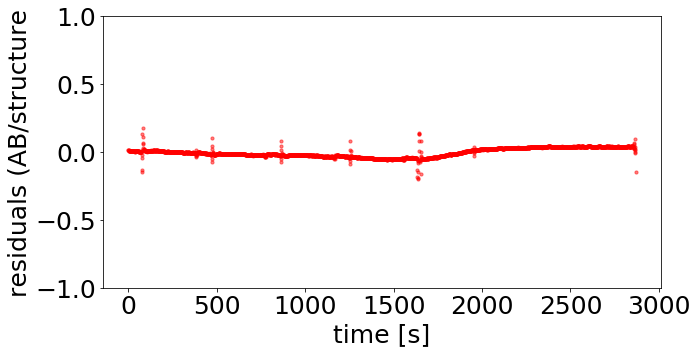

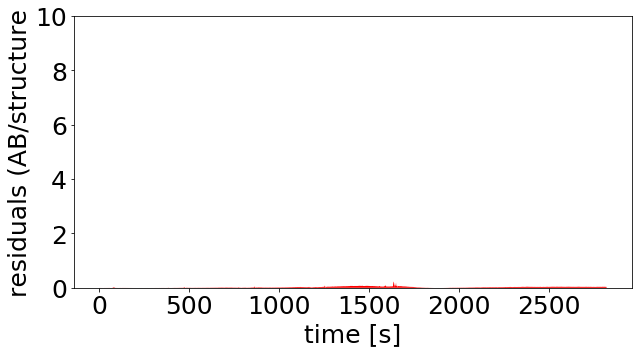

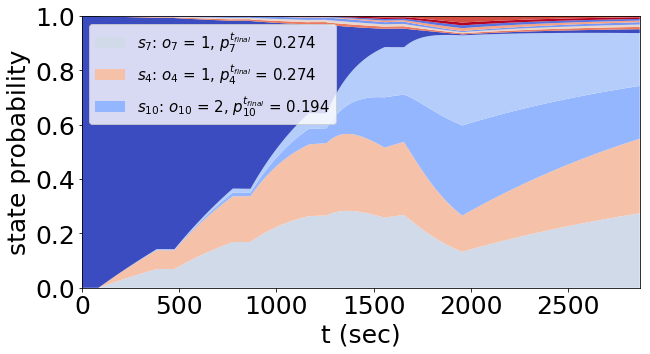

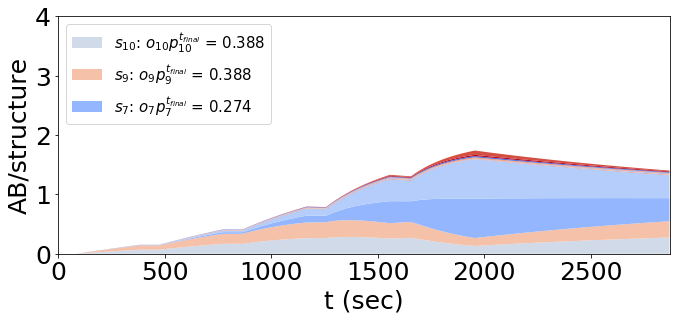

[array([1.26297018])]
('(fit_annealing) variable parameter: ', array([18.]), 'log10 variable parameter: ', array([1.25527251]))
basinhopping step 0: f 974.01
basinhopping step 1: f 974.01 trial_f 974.01 accepted 1  lowest_f 974.01
found new global minimum on step 1 with function value 974.01
('JR2_config_d', [1.2379442211064702])


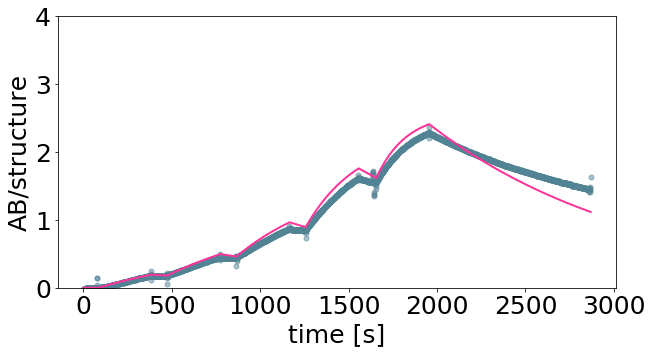

[17.29594203]


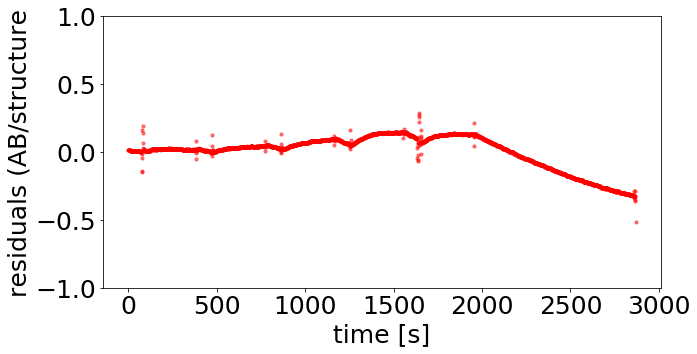

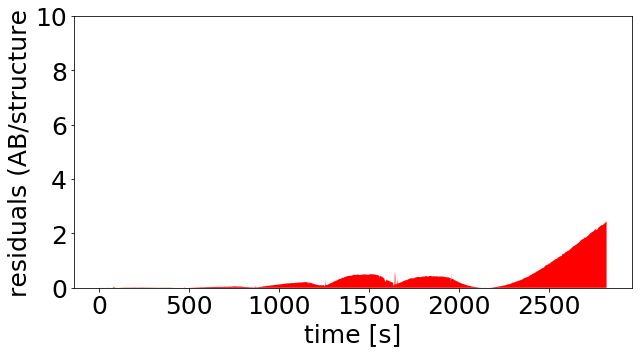

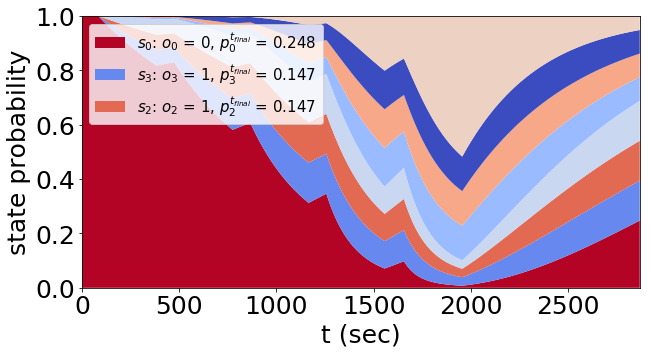

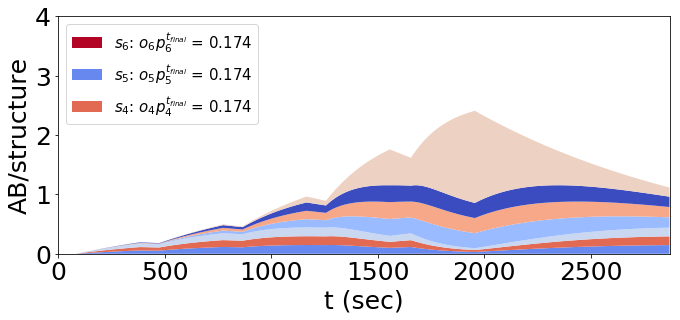

[array([1.23794422])]
('(fit_annealing) variable parameter: ', array([18.]), 'log10 variable parameter: ', array([1.25527251]))
basinhopping step 0: f 58.7742
basinhopping step 1: f 58.7742 trial_f 58.7742 accepted 1  lowest_f 58.7742
('JR2_config_e', [1.3096835916893972])


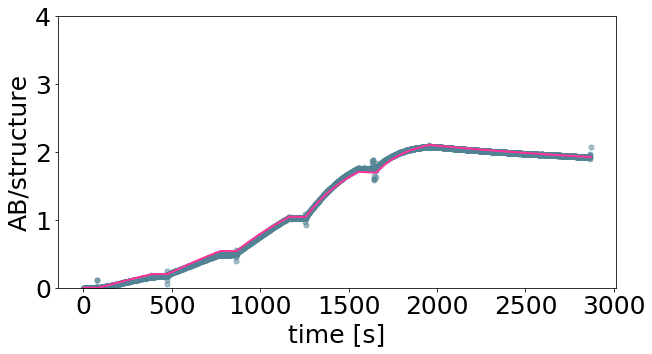

[20.40250964]


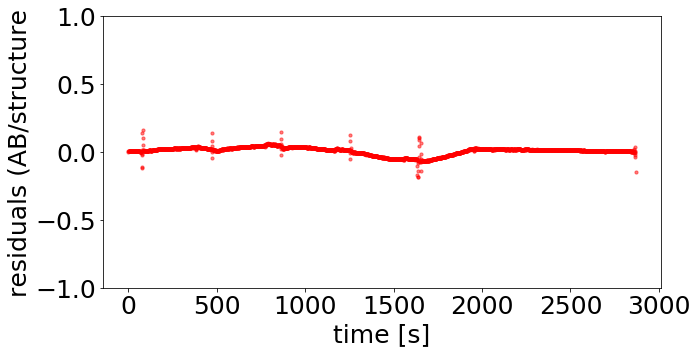

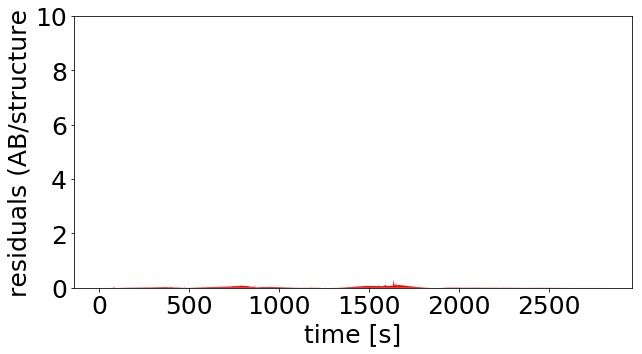

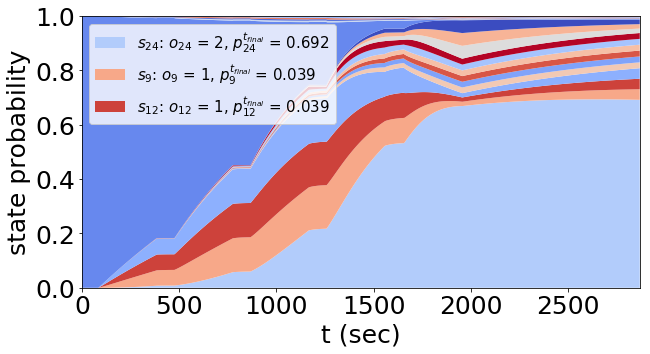

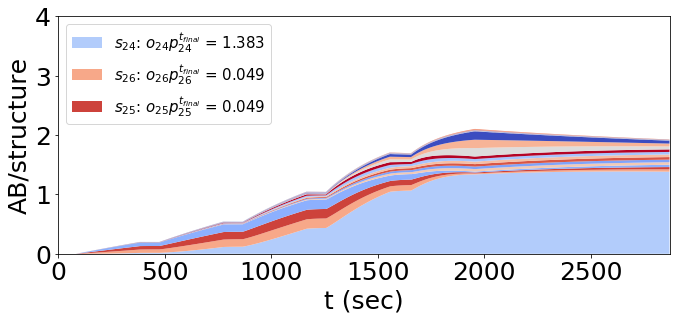

[array([1.30968359])]
('(fit_annealing) variable parameter: ', array([18.]), 'log10 variable parameter: ', array([1.25527251]))
basinhopping step 0: f 87.4016
basinhopping step 1: f 87.4016 trial_f 87.4016 accepted 1  lowest_f 87.4016
('JR2_config_f', [1.3058456075935576])


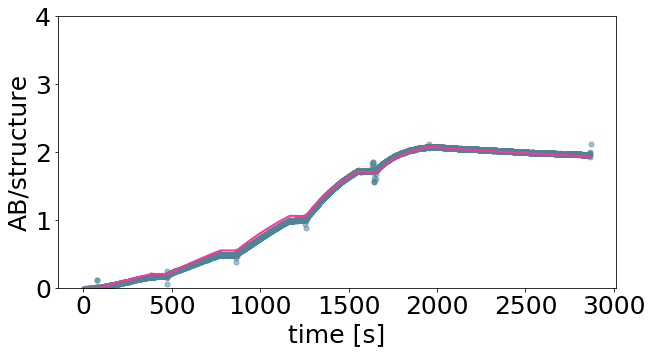

[20.2230012]


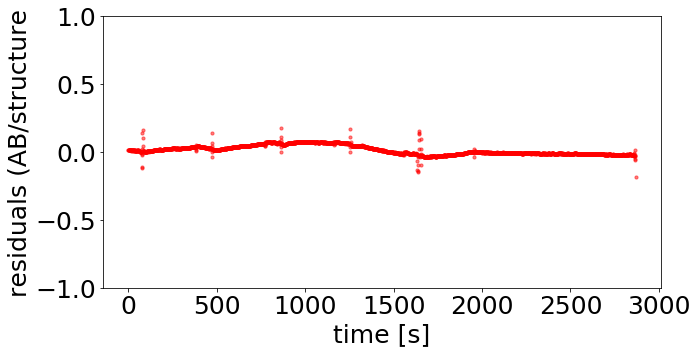

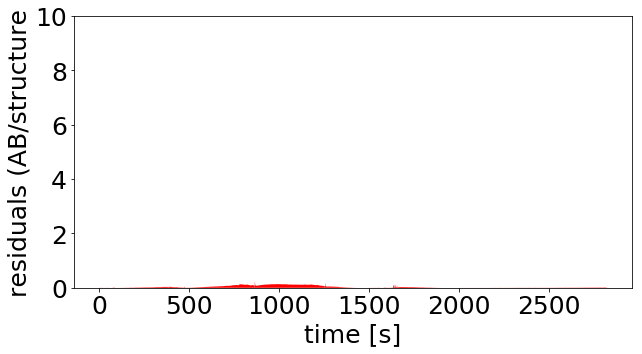

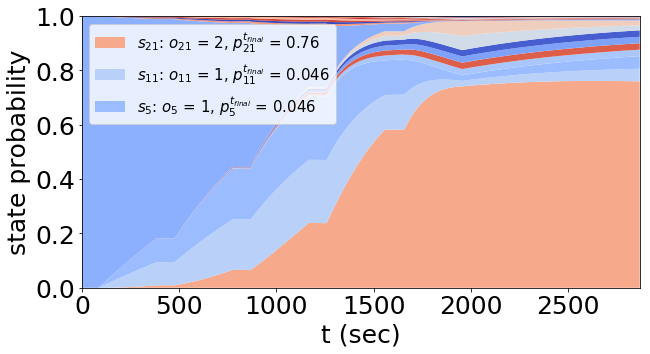

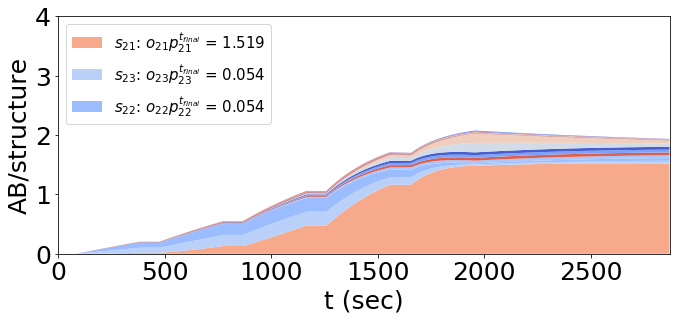

[array([1.30584561])]
('(fit_annealing) variable parameter: ', array([18.]), 'log10 variable parameter: ', array([1.25527251]))
basinhopping step 0: f 271.771
basinhopping step 1: f 271.771 trial_f 271.771 accepted 1  lowest_f 271.771
('JR2_config_g', [1.2952649370591358])


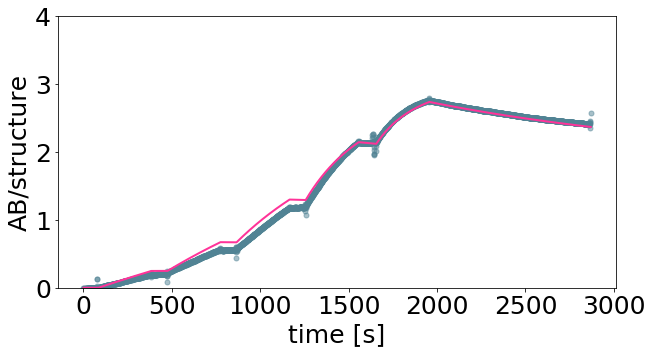

[19.7362636]


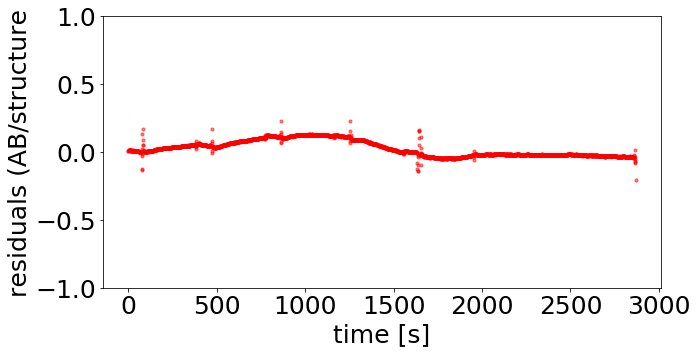

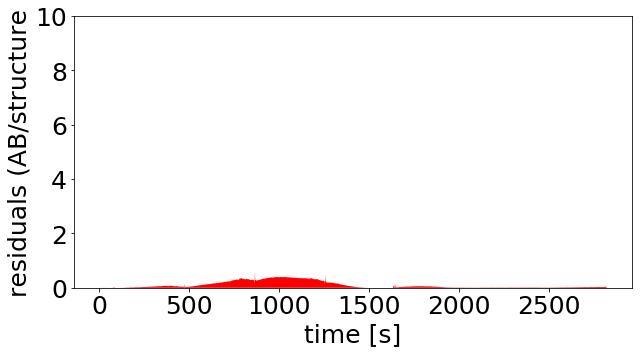

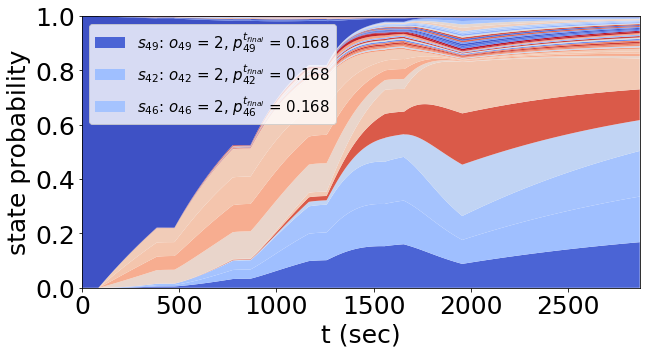

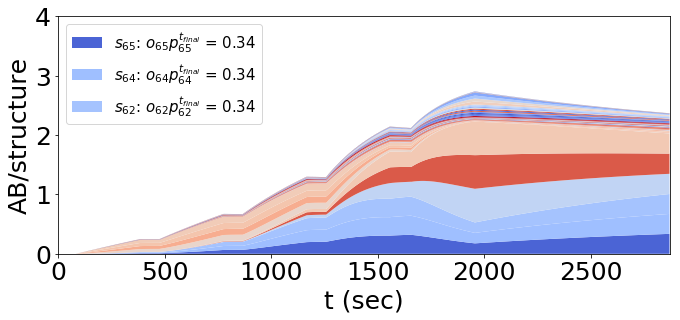

[array([1.29526494])]
('(fit_annealing) variable parameter: ', array([18.]), 'log10 variable parameter: ', array([1.25527251]))
basinhopping step 0: f 1146.7
basinhopping step 1: f 1146.7 trial_f 1146.7 accepted 1  lowest_f 1146.7
('JR2_config_h', [1.2960523176802912])


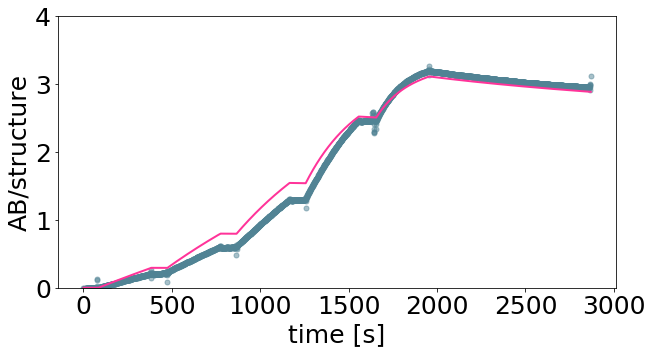

[19.77207812]


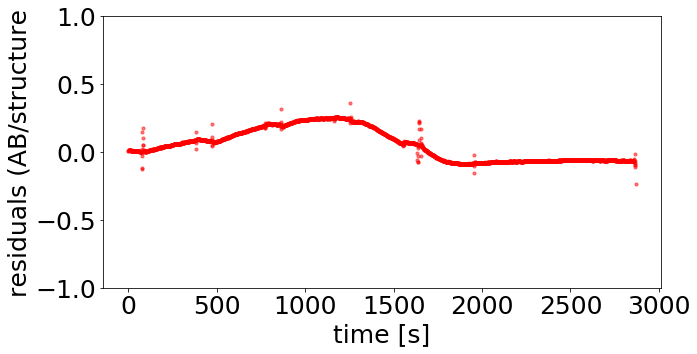

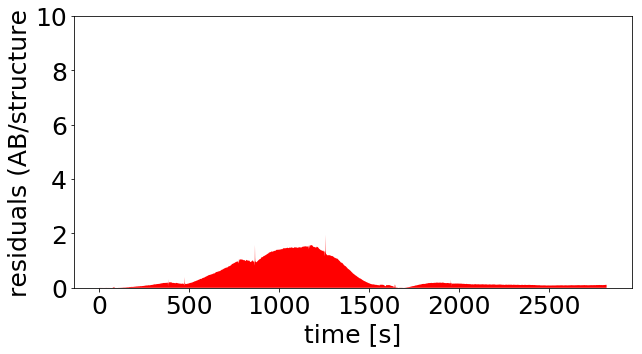

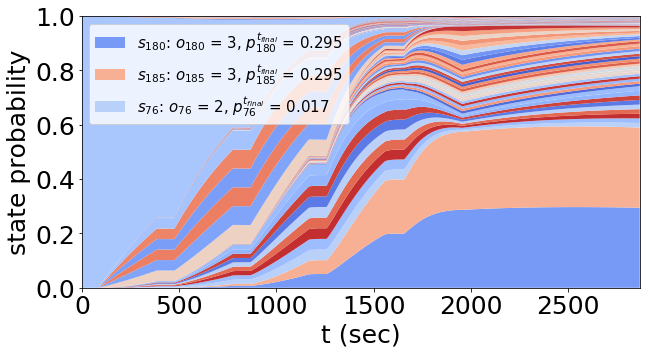

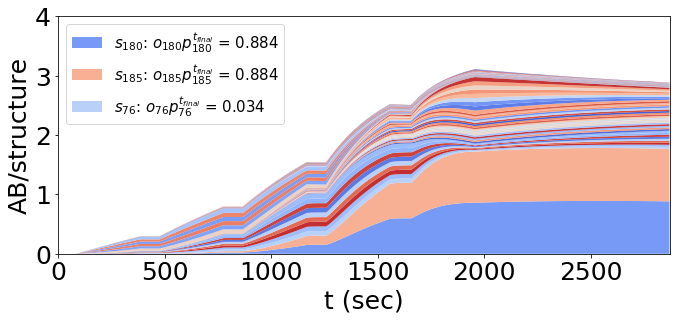

[array([1.29605232])]
('(fit_annealing) variable parameter: ', array([ 1.,  1., 18.]), 'log10 variable parameter: ', array([0.        , 0.        , 1.25527251]))
basinhopping step 0: f 33.0716
basinhopping step 1: f 33.0716 trial_f 33.0716 accepted 1  lowest_f 33.0716
('JR2_config_f', [0.7750864727424536, -0.677368028731923, 1.3135367930081947])


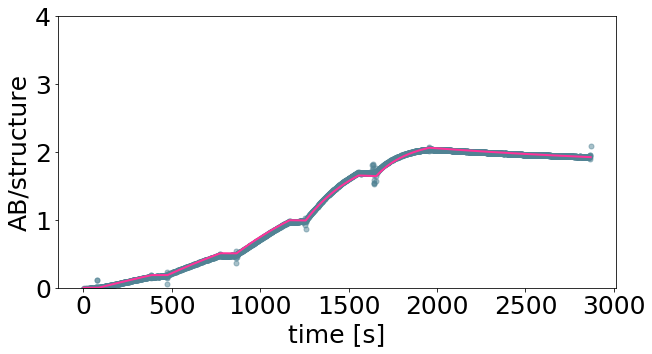

[ 5.95780758  0.21019964 20.58433272]


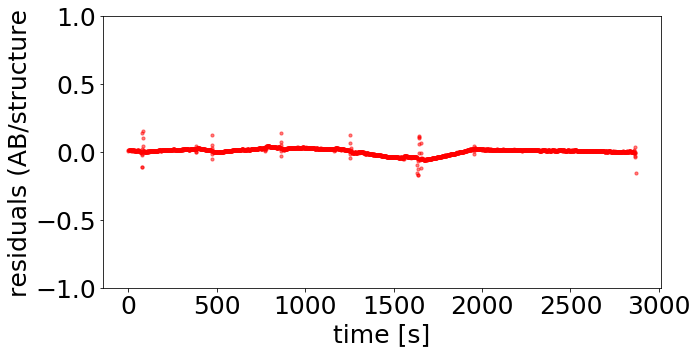

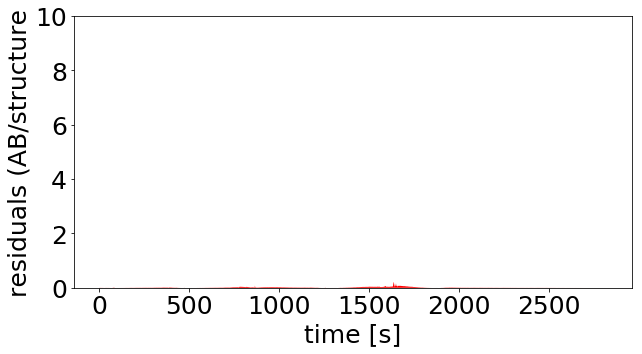

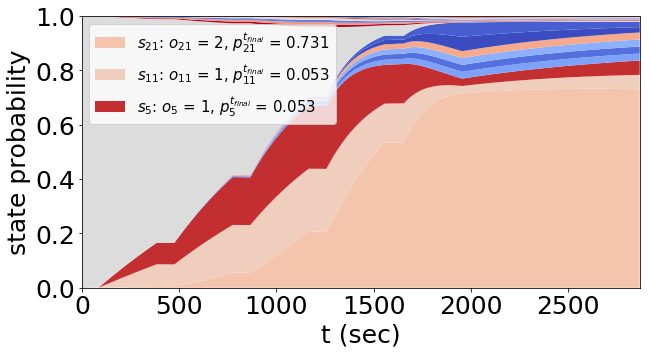

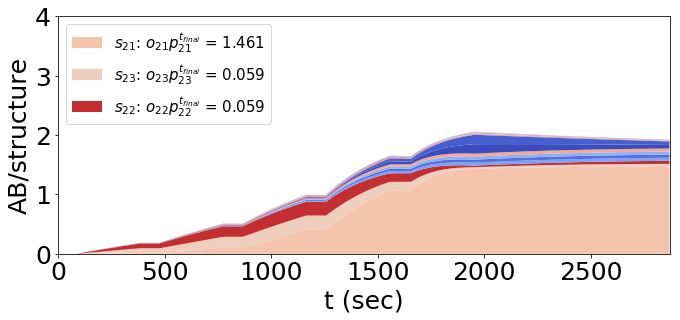

[array([ 0.77508647, -0.67736803,  1.31353679])]
('(fit_annealing) variable parameter: ', array([18.]), 'log10 variable parameter: ', array([1.25527251]))
basinhopping step 0: f 141.18
basinhopping step 1: f 141.18 trial_f 141.18 accepted 1  lowest_f 141.18
found new global minimum on step 1 with function value 141.18
('JR2_config_a', [1.2742050835026504])


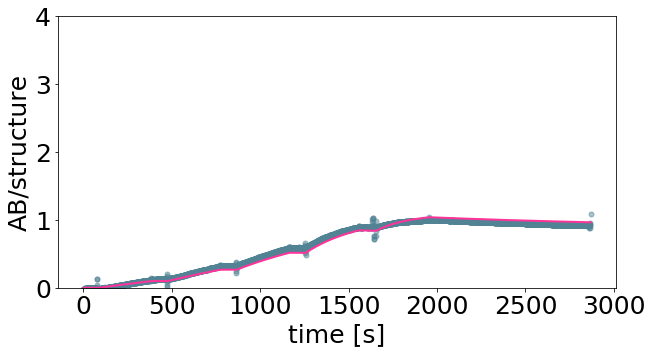

[18.80204482]


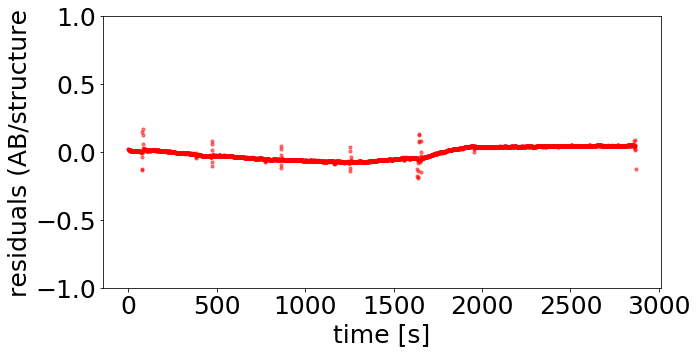

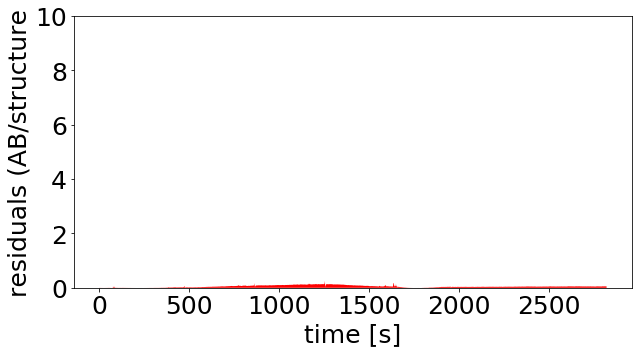

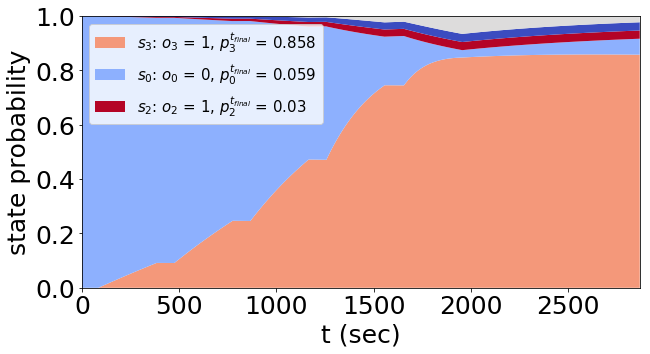

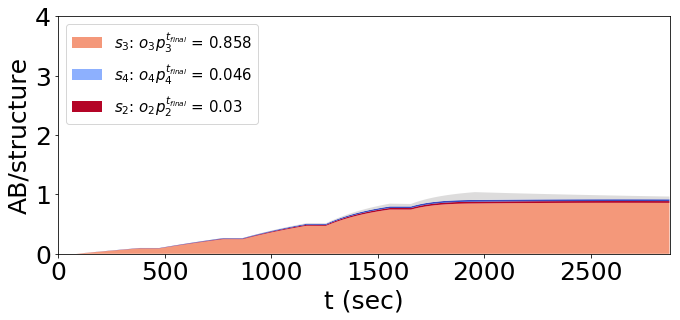

[array([1.27420508])]
('(fit_annealing) variable parameter: ', array([18.]), 'log10 variable parameter: ', array([1.25527251]))
basinhopping step 0: f 222.807
basinhopping step 1: f 222.807 trial_f 222.807 accepted 1  lowest_f 222.807
('JR2_config_b', [1.2387683829149592])


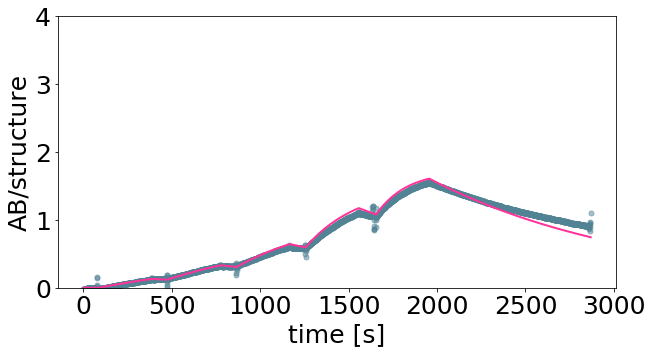

[17.32879575]


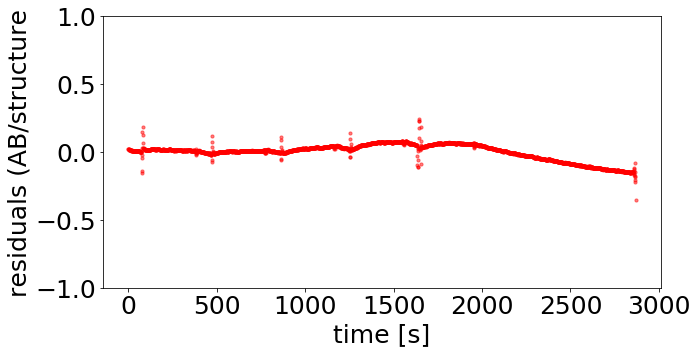

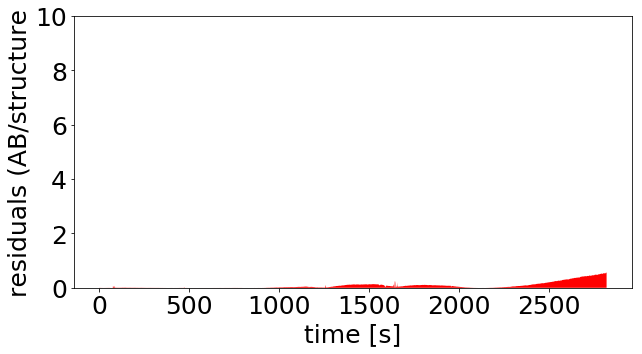

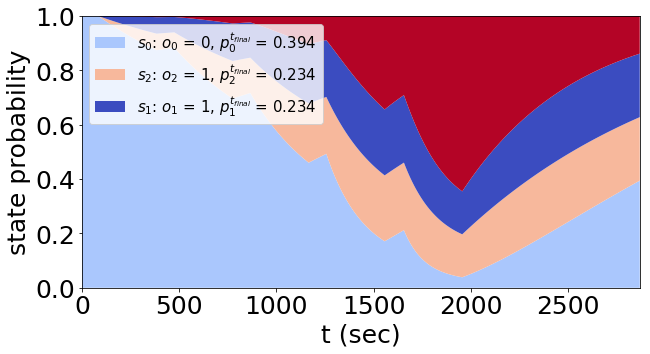

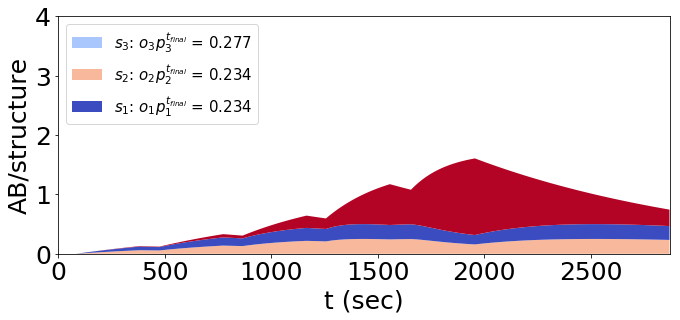

[array([1.23876838])]
('(fit_annealing) variable parameter: ', array([18.]), 'log10 variable parameter: ', array([1.25527251]))
basinhopping step 0: f 177.567
basinhopping step 1: f 177.567 trial_f 177.567 accepted 1  lowest_f 177.567
('JR2_config_c', [1.272096612919583])


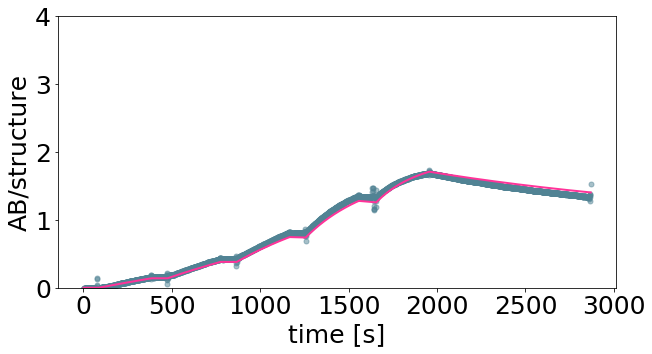

[18.71098338]


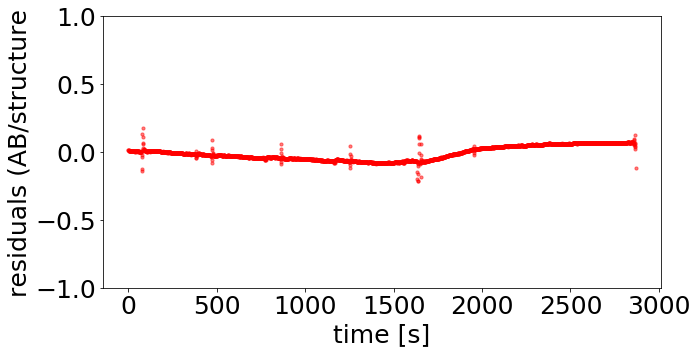

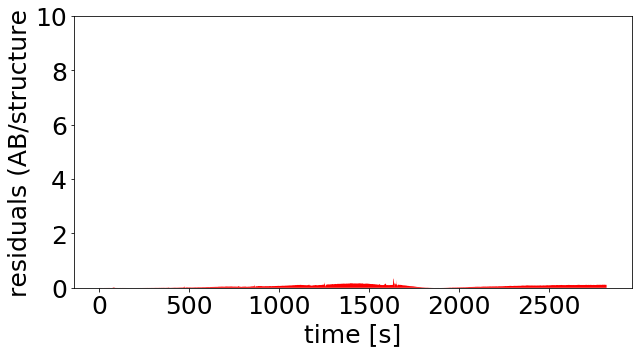

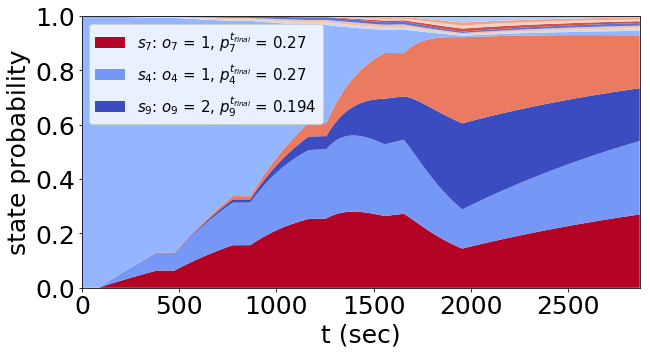

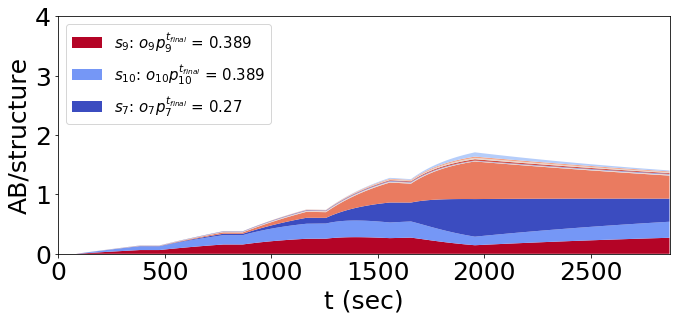

[array([1.27209661])]
('(fit_annealing) variable parameter: ', array([18.]), 'log10 variable parameter: ', array([1.25527251]))
basinhopping step 0: f 974.01
basinhopping step 1: f 974.01 trial_f 974.01 accepted 1  lowest_f 974.01
('JR2_config_d', [1.2379442211009093])


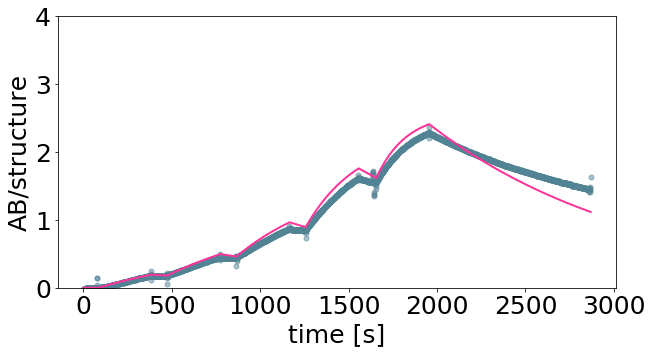

[17.29594203]


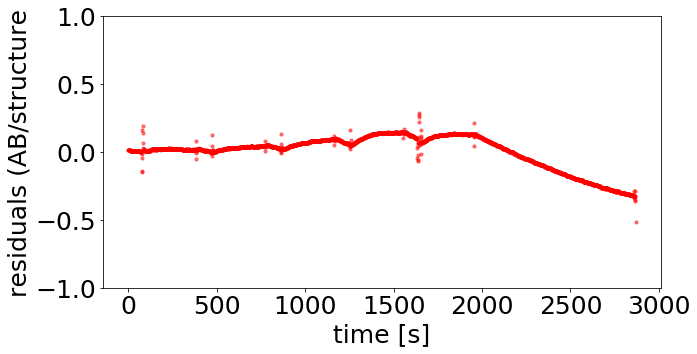

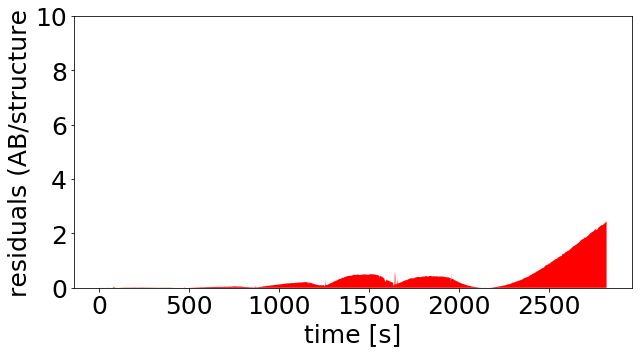

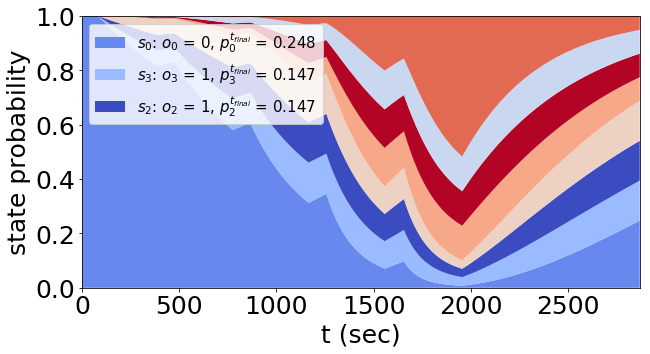

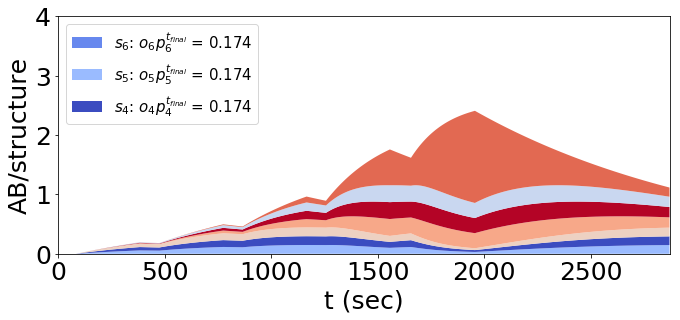

[array([1.23794422])]
('(fit_annealing) variable parameter: ', array([18.]), 'log10 variable parameter: ', array([1.25527251]))
basinhopping step 0: f 981.602
basinhopping step 1: f 981.602 trial_f 981.602 accepted 1  lowest_f 981.602
('JR2_config_e', [1.3715037237099328])


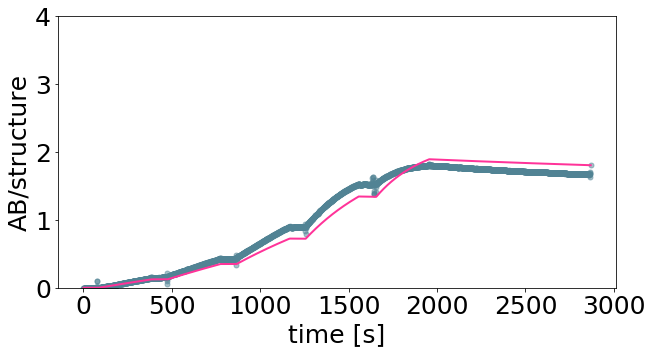

[23.52359663]


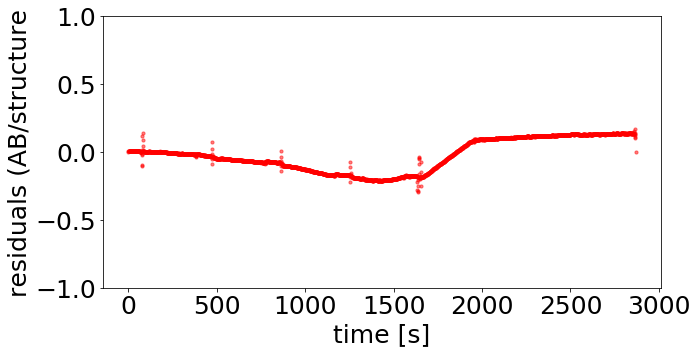

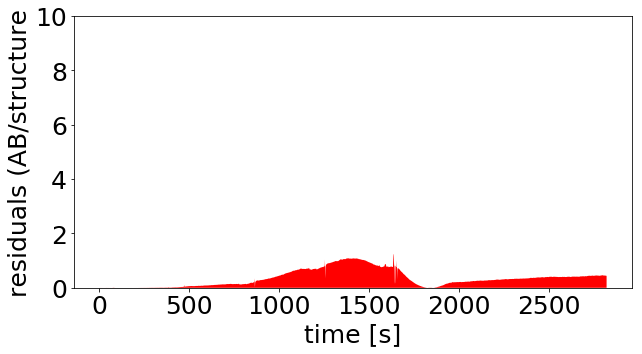

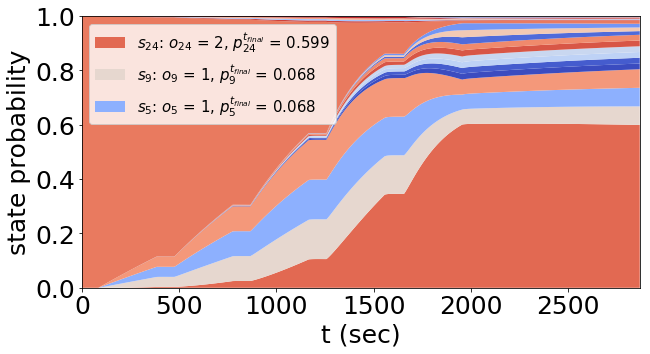

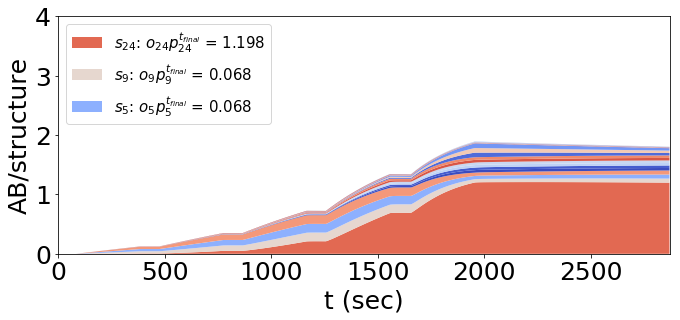

[array([1.37150372])]
('(fit_annealing) variable parameter: ', array([18.]), 'log10 variable parameter: ', array([1.25527251]))
basinhopping step 0: f 33.0716
basinhopping step 1: f 33.0716 trial_f 33.0716 accepted 1  lowest_f 33.0716
('JR2_config_f', [1.3135367903087678])


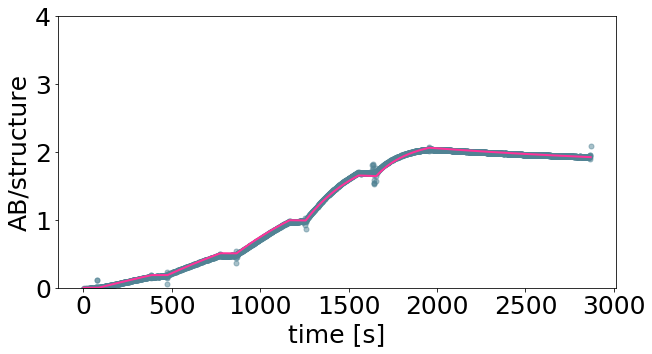

[20.58433259]


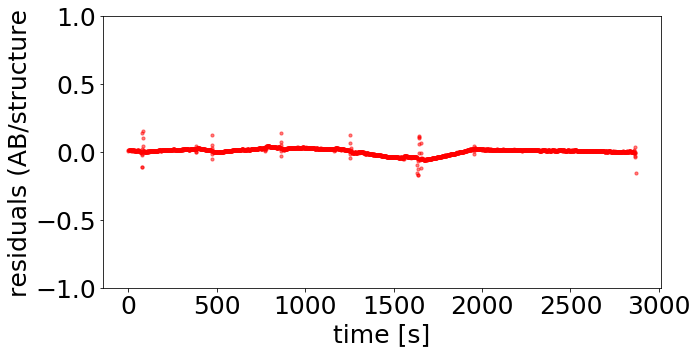

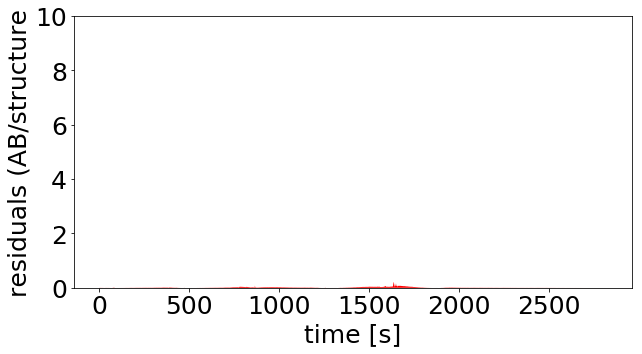

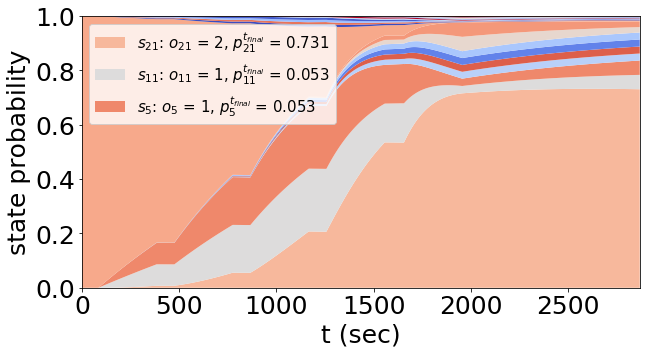

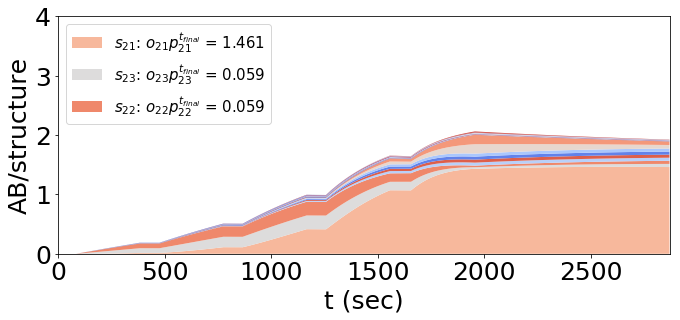

[array([1.31353679])]
('(fit_annealing) variable parameter: ', array([18.]), 'log10 variable parameter: ', array([1.25527251]))
basinhopping step 0: f 13895.8
basinhopping step 1: f 13895.8 trial_f 13895.8 accepted 1  lowest_f 13895.8
('JR2_config_g', [1.4771212547196624])


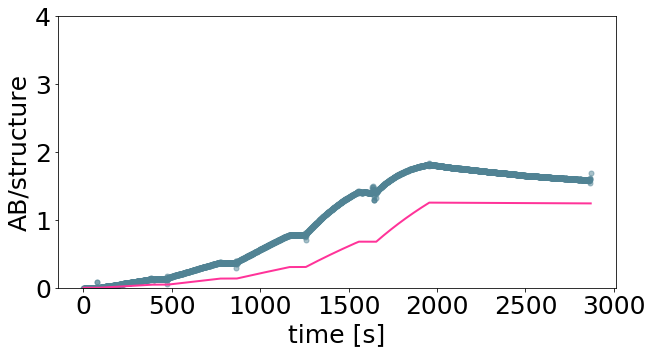

[30.]


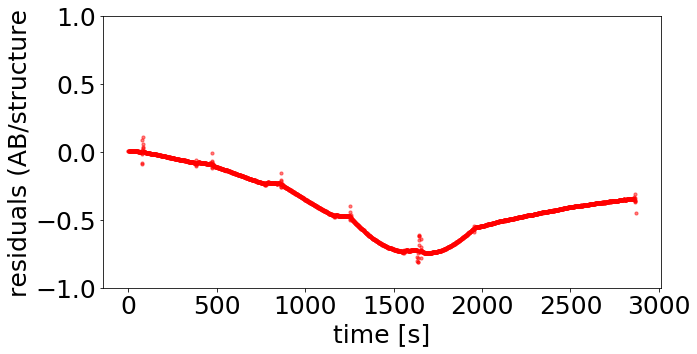

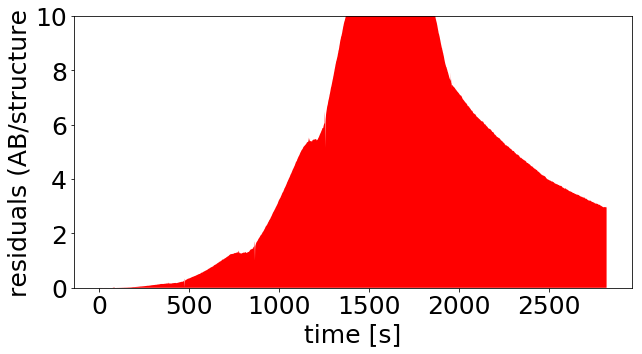

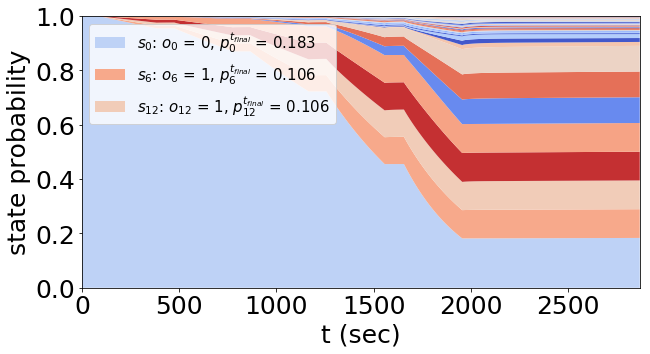

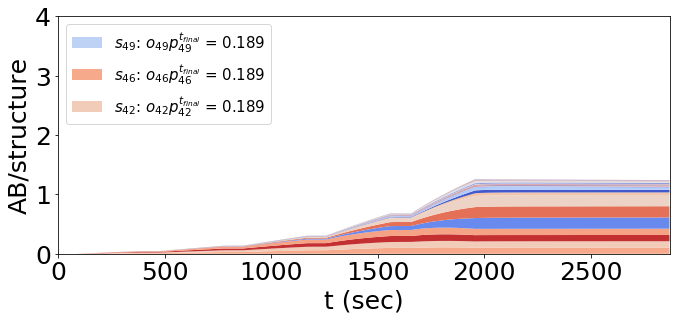

[array([1.47712125])]
('(fit_annealing) variable parameter: ', array([18.]), 'log10 variable parameter: ', array([1.25527251]))
basinhopping step 0: f 138175
basinhopping step 1: f 138175 trial_f 138175 accepted 1  lowest_f 138175
('JR2_config_h', [1.4771212547196624])


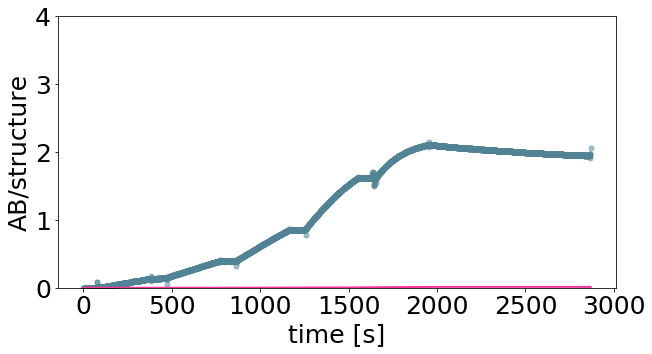

[30.]


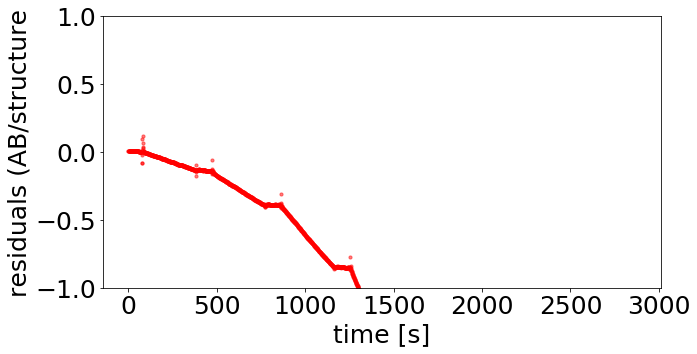

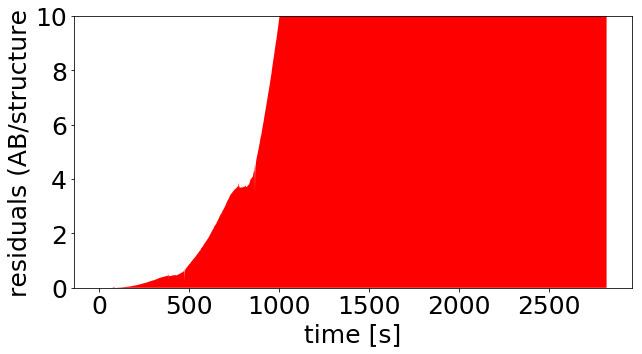

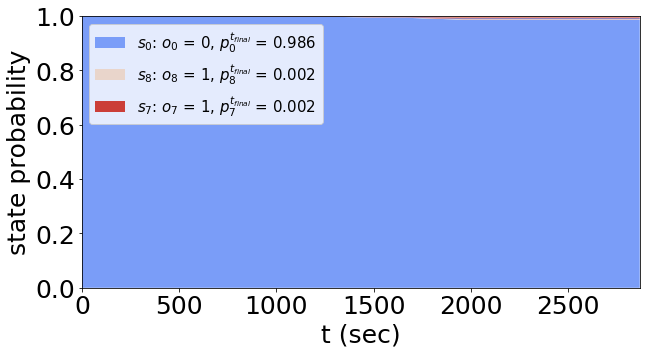

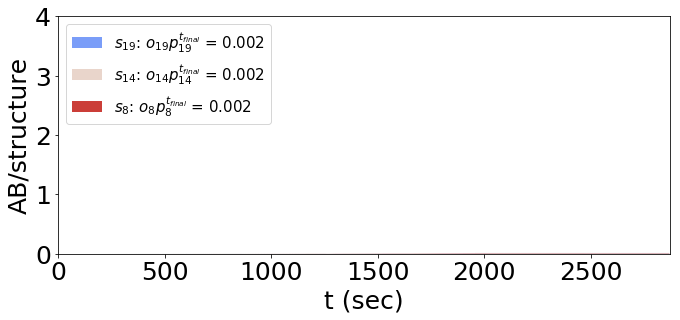

[array([1.47712125])]
('(fit_annealing) variable parameter: ', array([ 1.,  1., 18.]), 'log10 variable parameter: ', array([0.        , 0.        , 1.25527251]))
basinhopping step 0: f 77.3499
basinhopping step 1: f 77.3499 trial_f 77.3499 accepted 1  lowest_f 77.3499
('JR2_config_g', [0.5369509921246045, -0.6201237542628606, 1.3039236454154797])


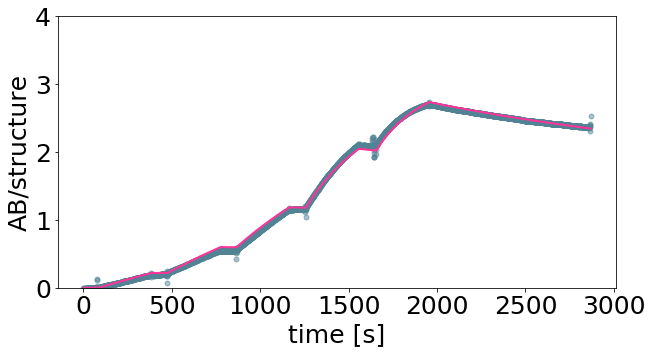

[ 3.44311075  0.23981495 20.13370242]


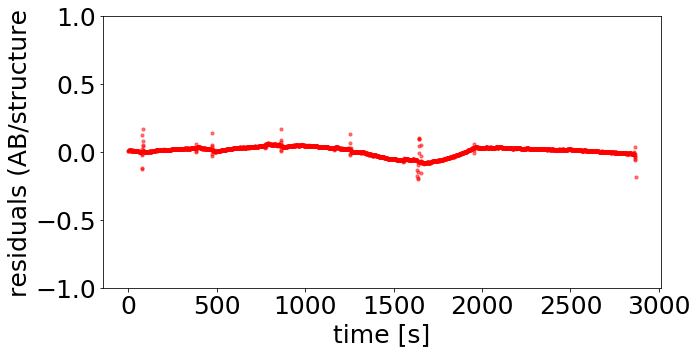

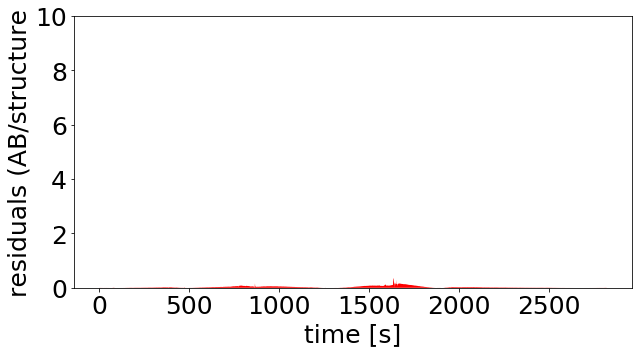

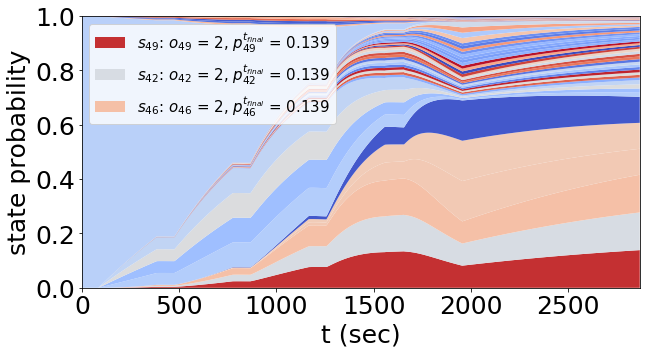

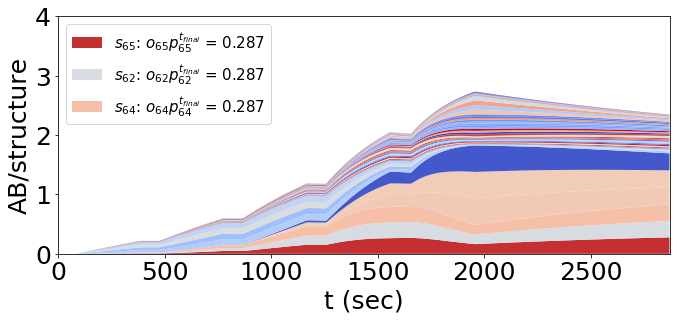

[array([ 0.53695099, -0.62012375,  1.30392365])]
('(fit_annealing) variable parameter: ', array([18.]), 'log10 variable parameter: ', array([1.25527251]))
basinhopping step 0: f 160.816
basinhopping step 1: f 160.816 trial_f 160.816 accepted 1  lowest_f 160.816
found new global minimum on step 1 with function value 160.816
('JR2_config_a', [1.2649183167971])


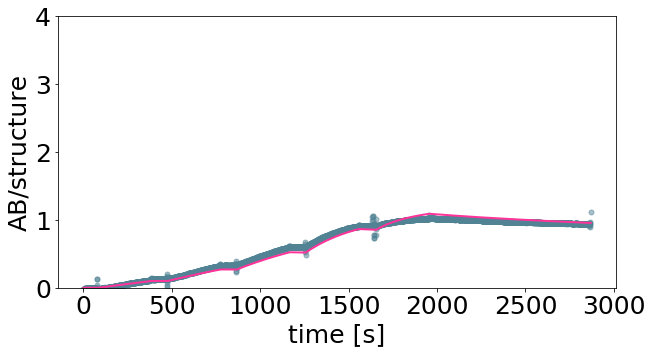

[18.40425817]


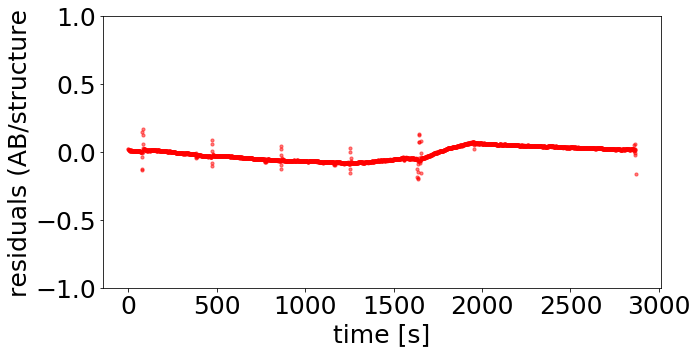

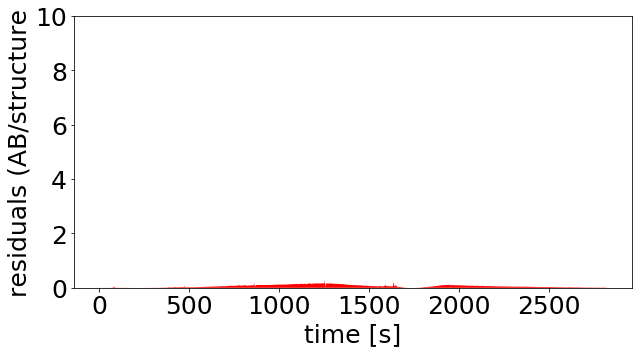

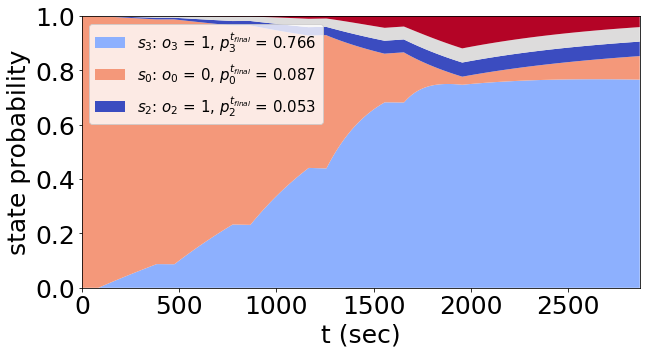

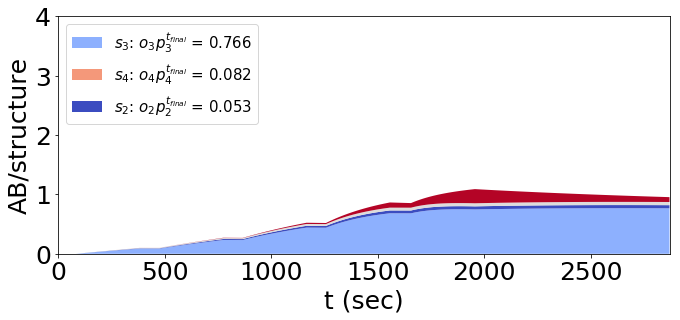

[array([1.26491832])]
('(fit_annealing) variable parameter: ', array([18.]), 'log10 variable parameter: ', array([1.25527251]))
basinhopping step 0: f 222.807
basinhopping step 1: f 222.807 trial_f 222.807 accepted 1  lowest_f 222.807
('JR2_config_b', [1.2387683829149592])


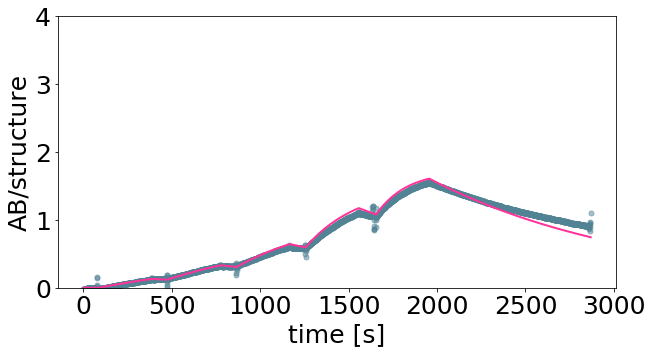

[17.32879575]


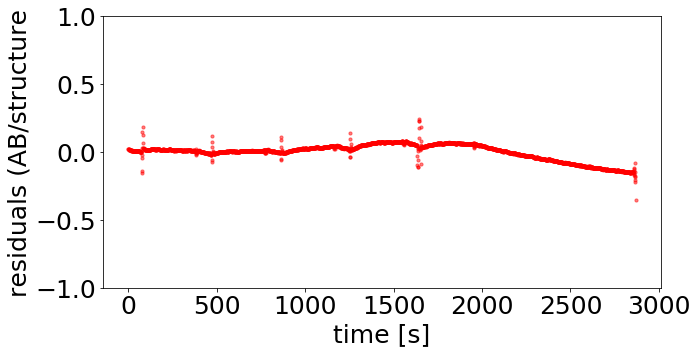

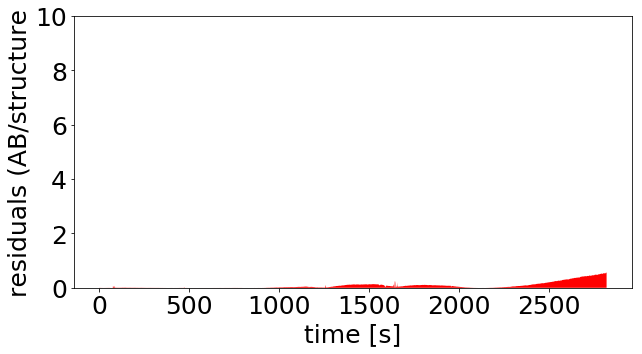

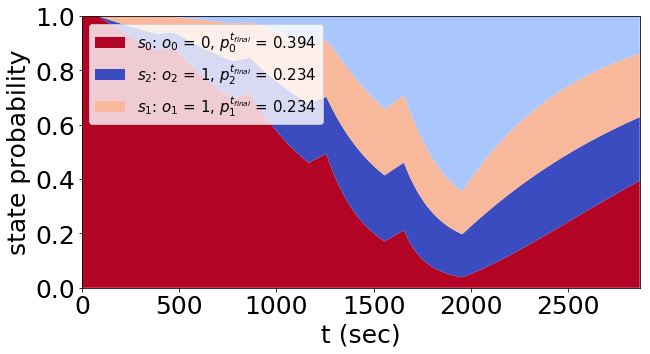

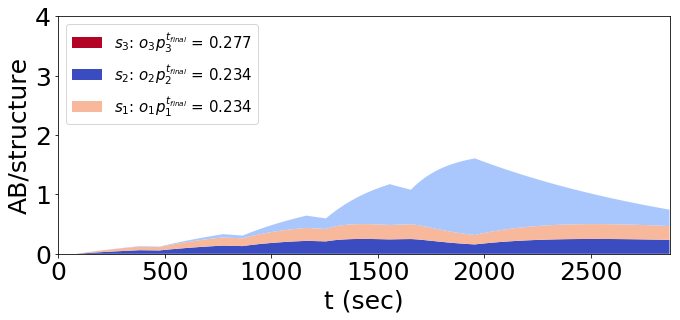

[array([1.23876838])]
('(fit_annealing) variable parameter: ', array([18.]), 'log10 variable parameter: ', array([1.25527251]))
basinhopping step 0: f 124.586
basinhopping step 1: f 124.586 trial_f 124.586 accepted 1  lowest_f 124.586
found new global minimum on step 1 with function value 124.586
('JR2_config_c', [1.2635232278243242])


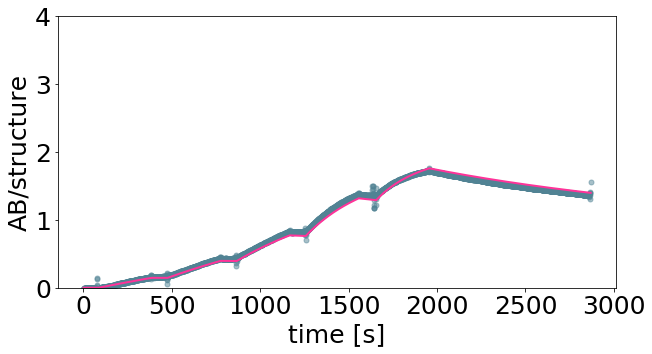

[18.34523282]


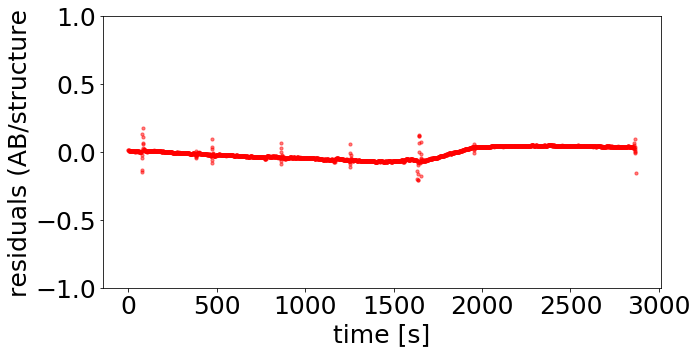

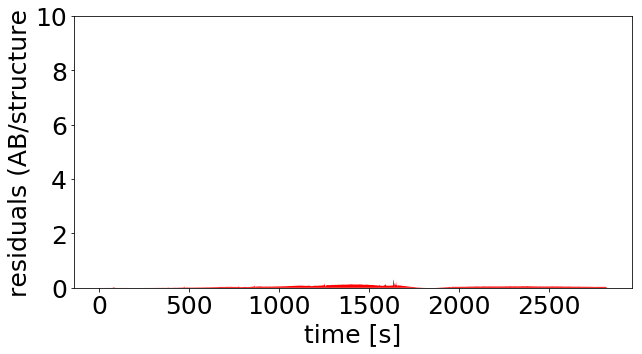

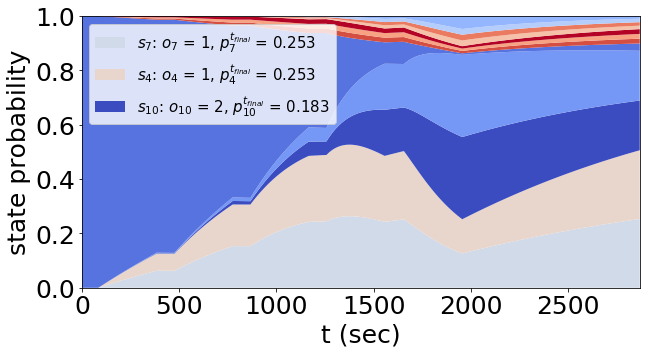

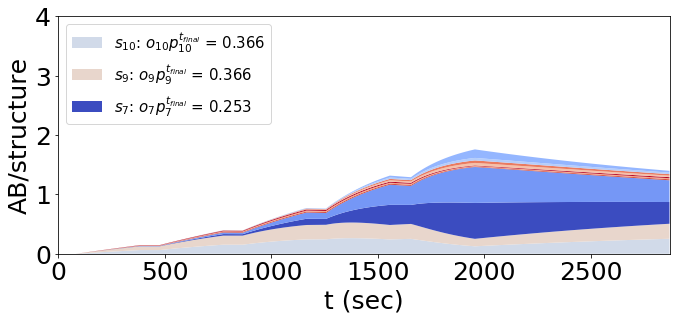

[array([1.26352323])]
('(fit_annealing) variable parameter: ', array([18.]), 'log10 variable parameter: ', array([1.25527251]))
basinhopping step 0: f 974.01
basinhopping step 1: f 974.01 trial_f 974.01 accepted 1  lowest_f 974.01
found new global minimum on step 1 with function value 974.01
('JR2_config_d', [1.2379442211078273])


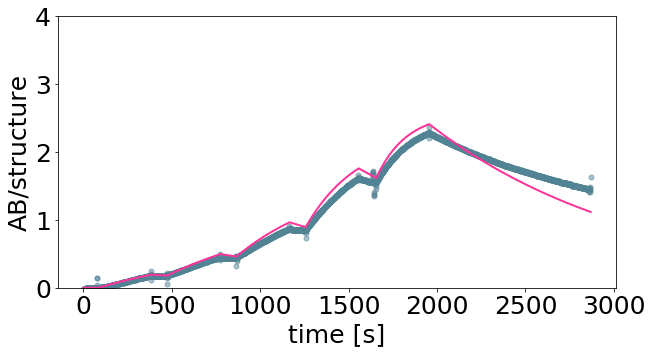

[17.29594203]


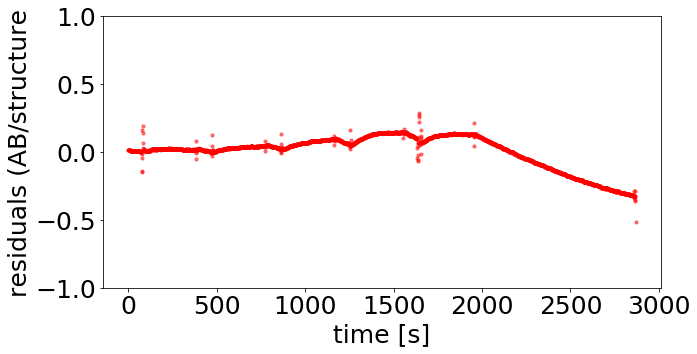

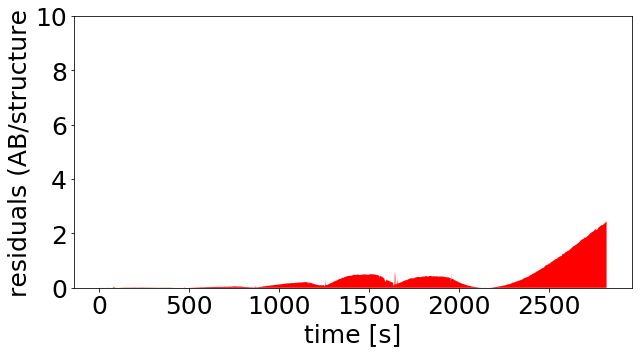

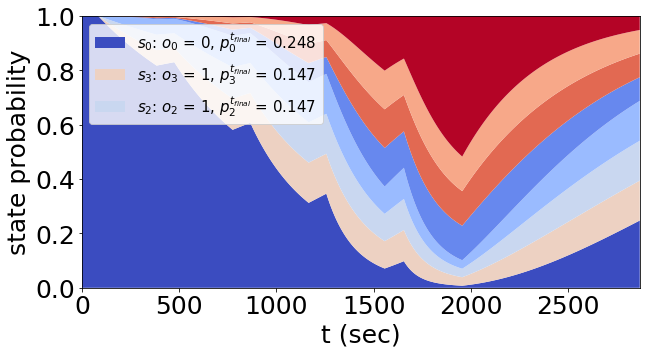

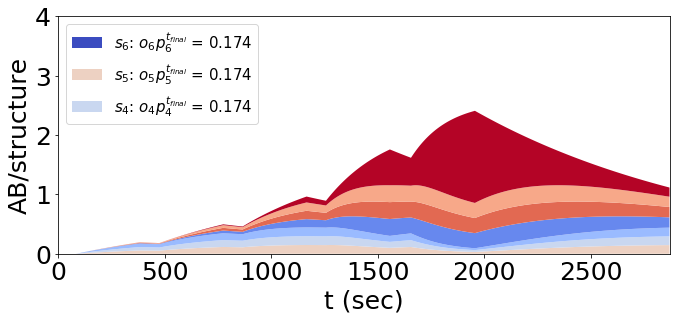

[array([1.23794422])]
('(fit_annealing) variable parameter: ', array([18.]), 'log10 variable parameter: ', array([1.25527251]))
basinhopping step 0: f 118.409
basinhopping step 1: f 118.409 trial_f 118.409 accepted 1  lowest_f 118.409
('JR2_config_e', [1.30687611545255])


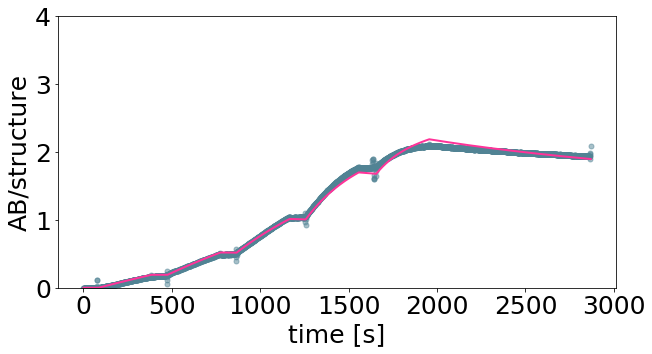

[20.27104396]


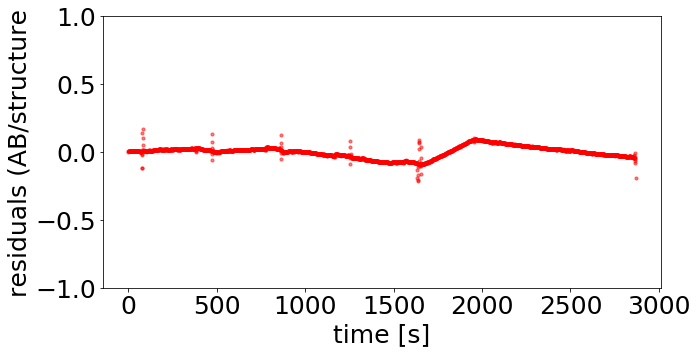

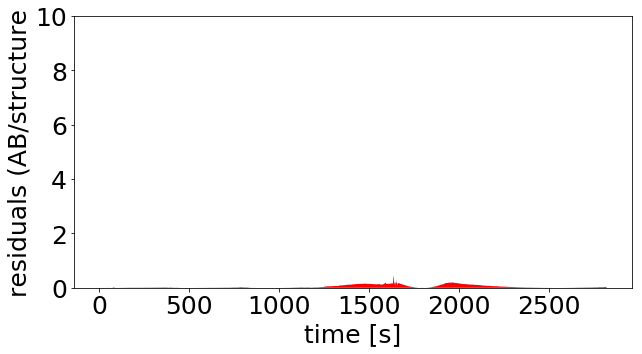

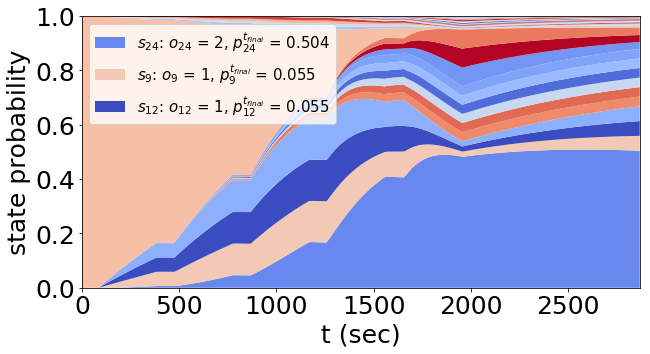

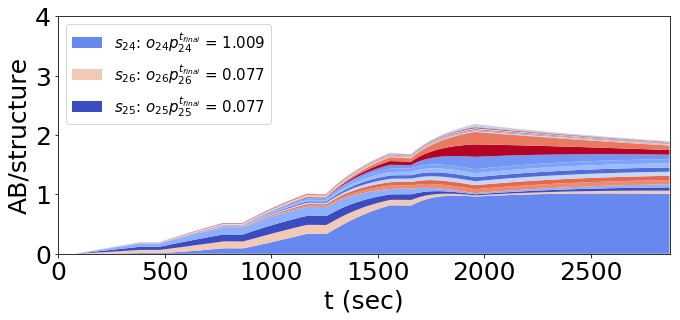

[array([1.30687612])]
('(fit_annealing) variable parameter: ', array([18.]), 'log10 variable parameter: ', array([1.25527251]))
basinhopping step 0: f 67.787
basinhopping step 1: f 67.787 trial_f 67.787 accepted 1  lowest_f 67.787
('JR2_config_f', [1.3015201830550163])


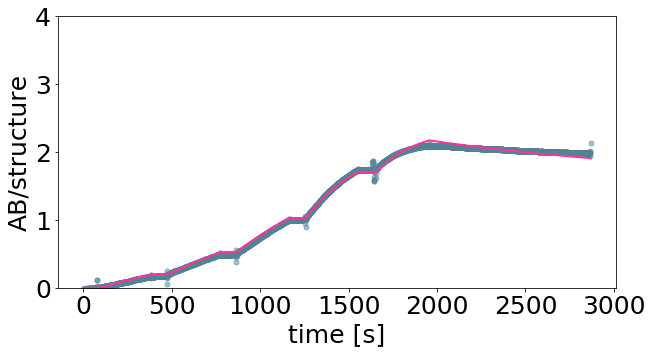

[20.02258671]


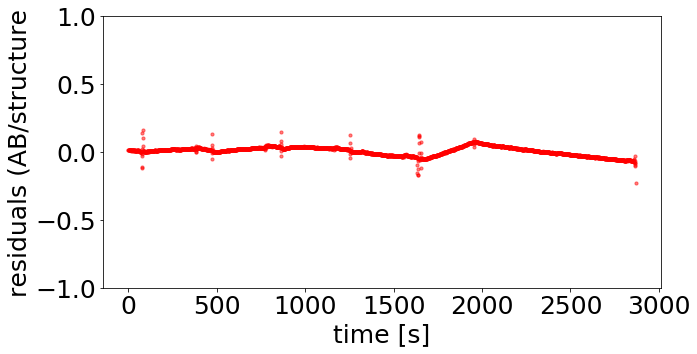

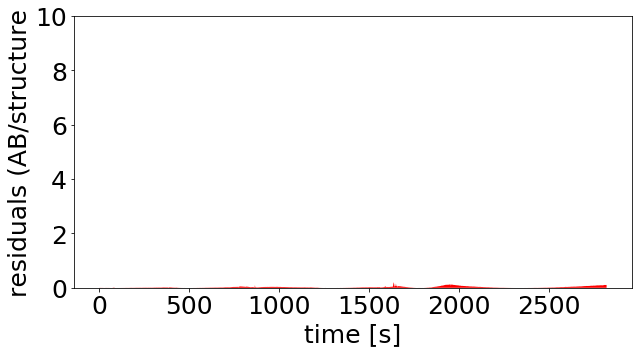

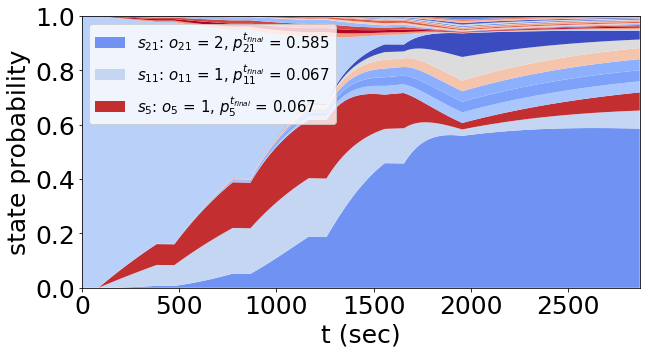

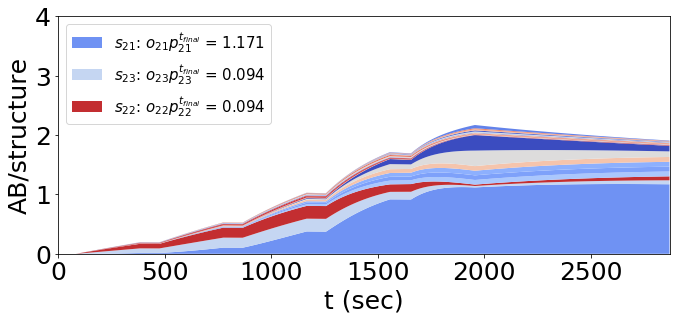

[array([1.30152018])]
('(fit_annealing) variable parameter: ', array([18.]), 'log10 variable parameter: ', array([1.25527251]))
basinhopping step 0: f 77.3499
basinhopping step 1: f 77.3499 trial_f 77.3499 accepted 1  lowest_f 77.3499
found new global minimum on step 1 with function value 77.3499
('JR2_config_g', [1.3039236642865726])


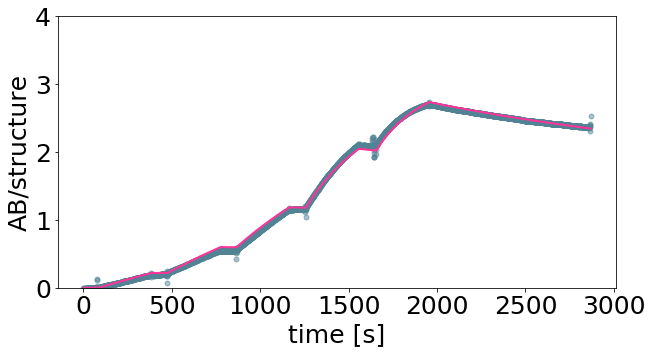

[20.1337033]


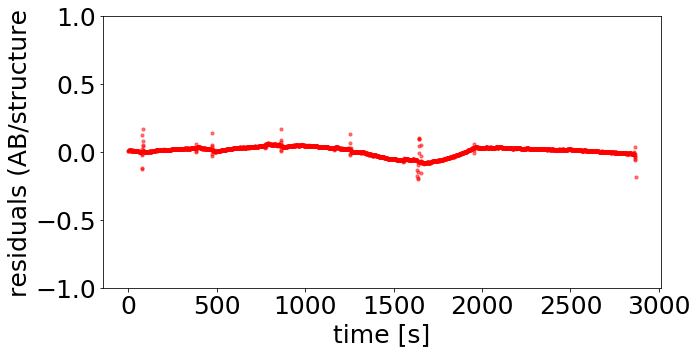

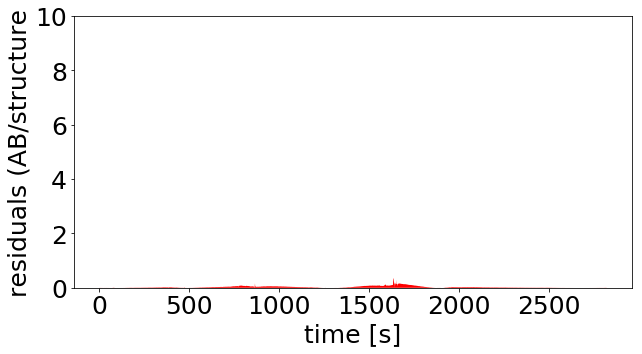

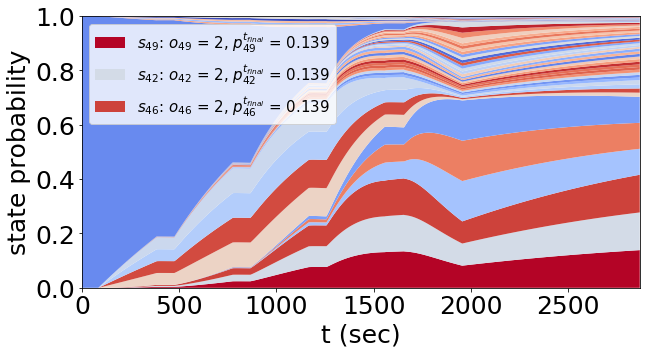

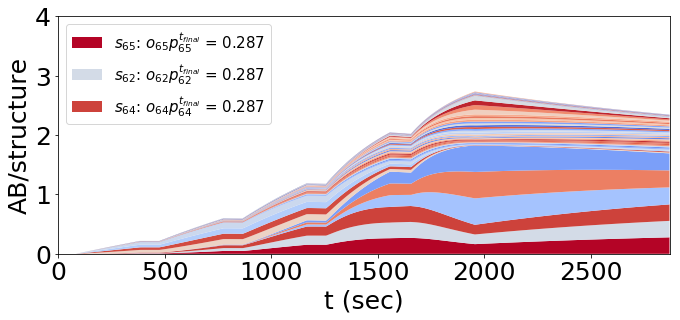

[array([1.30392366])]
('(fit_annealing) variable parameter: ', array([18.]), 'log10 variable parameter: ', array([1.25527251]))
basinhopping step 0: f 1709.06
basinhopping step 1: f 1709.06 trial_f 1709.06 accepted 1  lowest_f 1709.06
found new global minimum on step 1 with function value 1709.06
('JR2_config_h', [1.436743943507096])


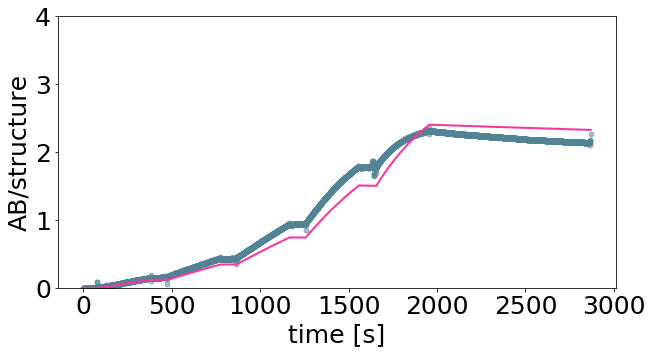

[27.33656509]


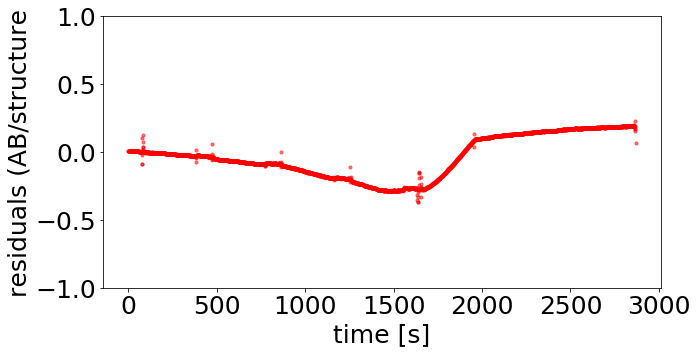

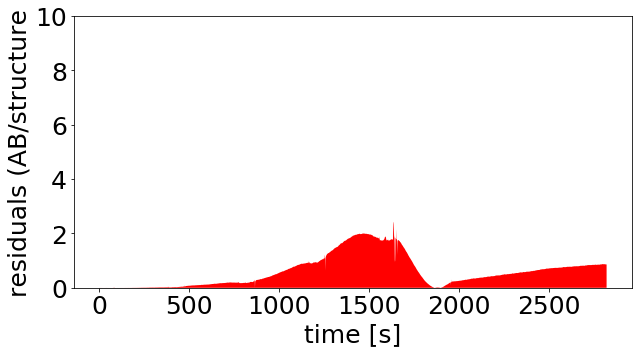

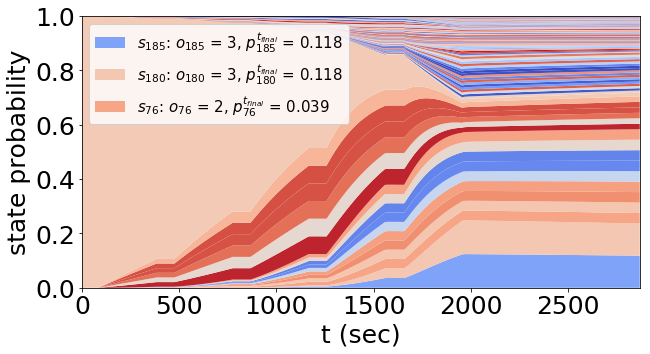

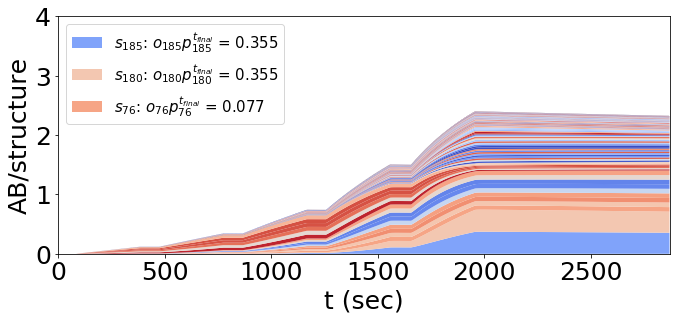

[array([1.43674394])]
('(fit_annealing) variable parameter: ', array([ 1.,  1., 18.]), 'log10 variable parameter: ', array([0.        , 0.        , 1.25527251]))
basinhopping step 0: f 125.682
basinhopping step 1: f 125.682 trial_f 125.682 accepted 1  lowest_f 125.682
('JR2_config_h', [0.4263931552957429, -0.7037322667155818, 1.3189956276713957])


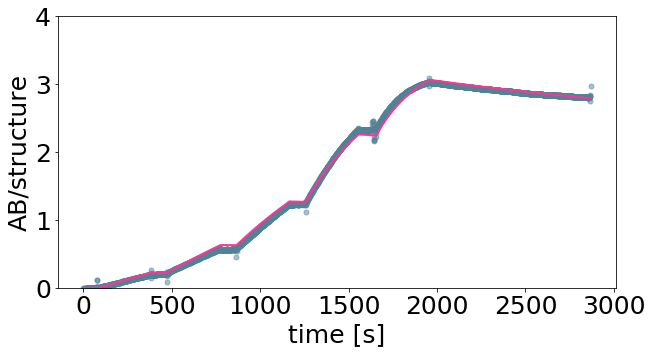

[ 2.66927399  0.19781888 20.84469897]


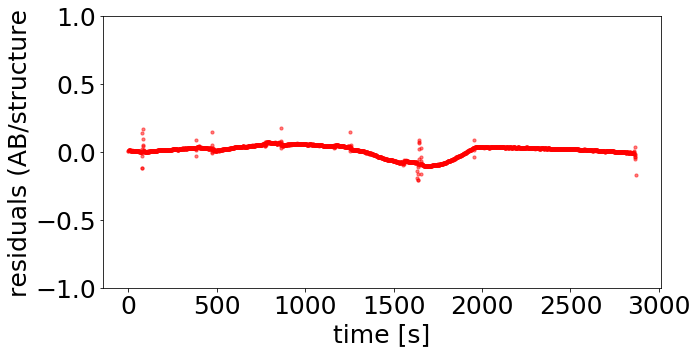

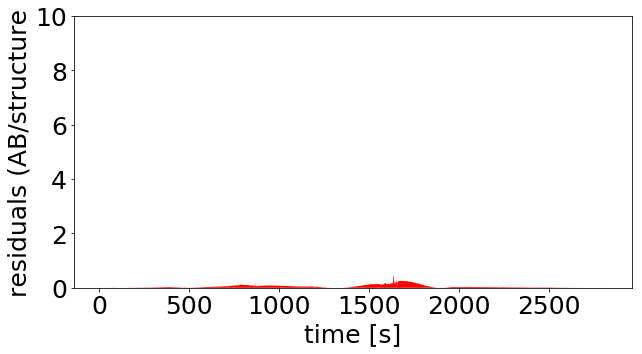

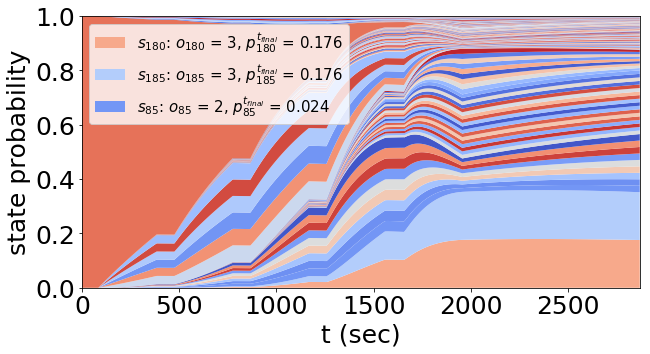

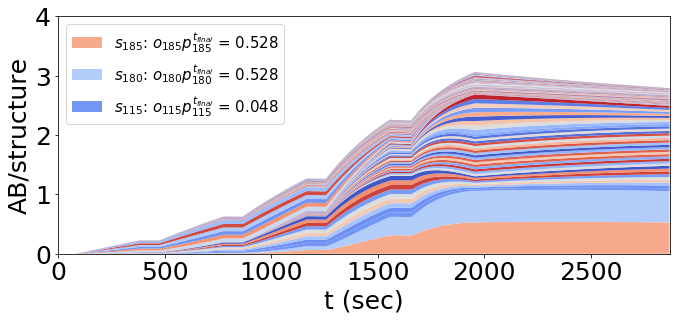

[array([ 0.42639316, -0.70373227,  1.31899563])]
('(fit_annealing) variable parameter: ', array([18.]), 'log10 variable parameter: ', array([1.25527251]))
basinhopping step 0: f 156.696
basinhopping step 1: f 156.696 trial_f 156.696 accepted 1  lowest_f 156.696
('JR2_config_a', [1.262959961565602])


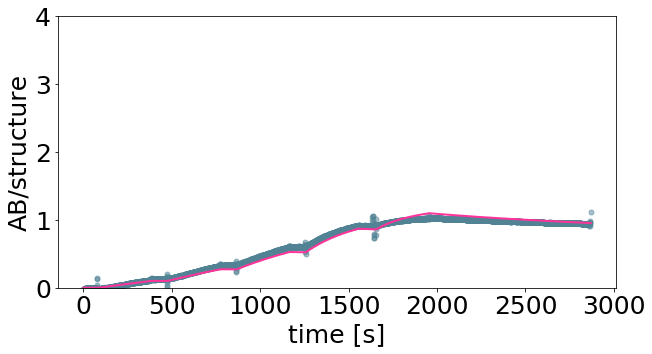

[18.32145506]


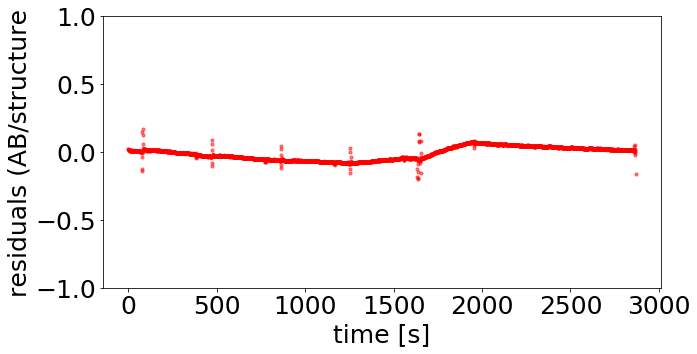

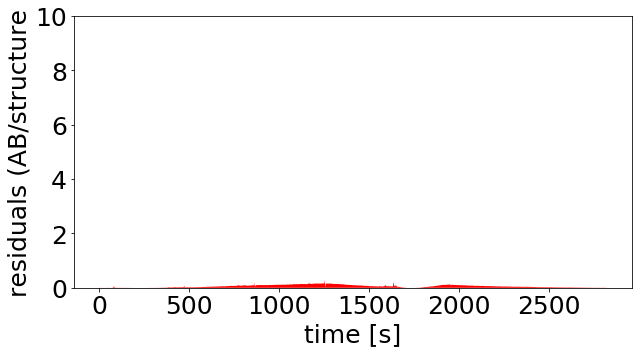

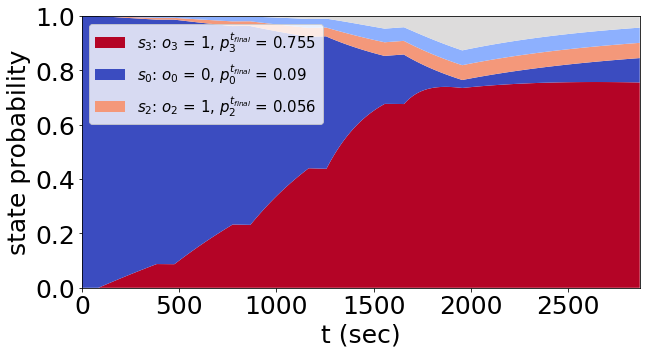

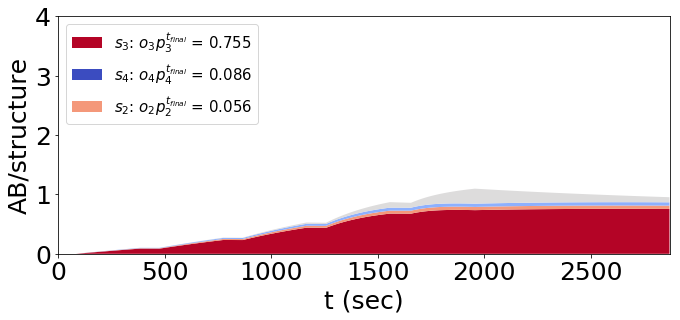

[array([1.26295996])]
('(fit_annealing) variable parameter: ', array([18.]), 'log10 variable parameter: ', array([1.25527251]))
basinhopping step 0: f 222.807
basinhopping step 1: f 222.807 trial_f 222.807 accepted 1  lowest_f 222.807
('JR2_config_b', [1.2387683829149592])


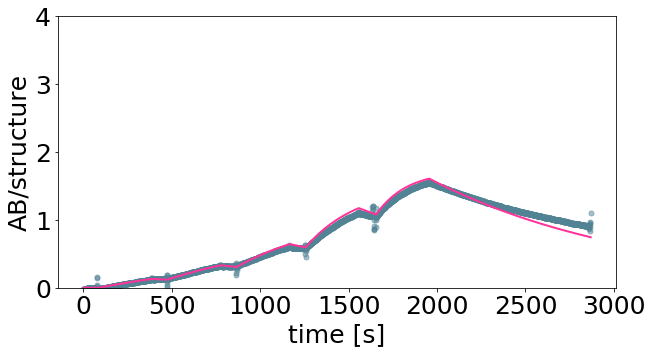

[17.32879575]


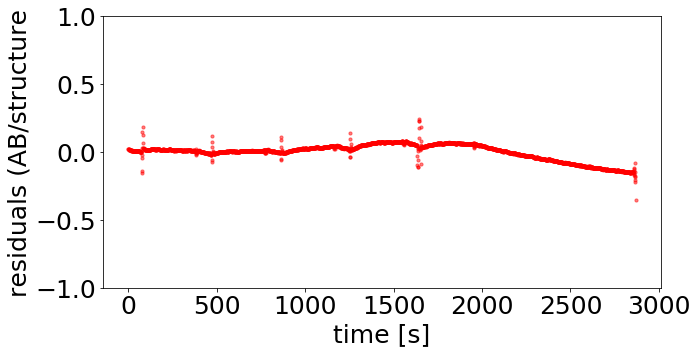

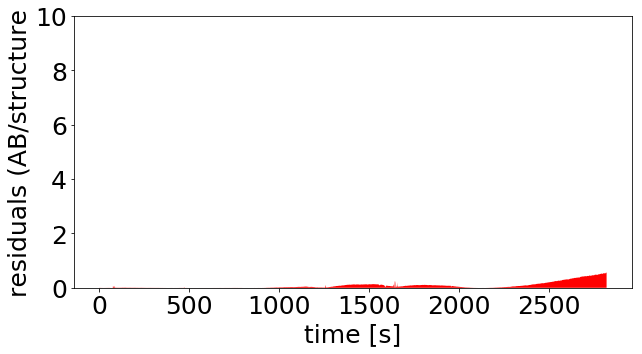

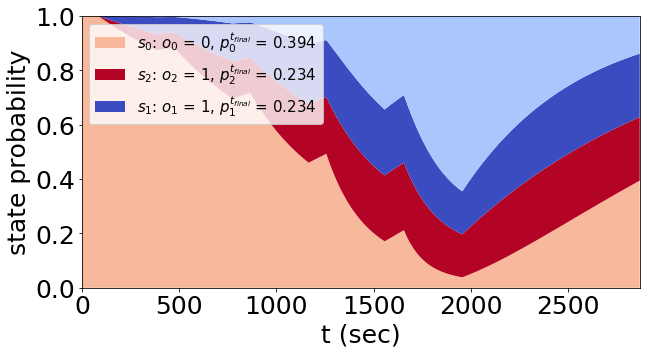

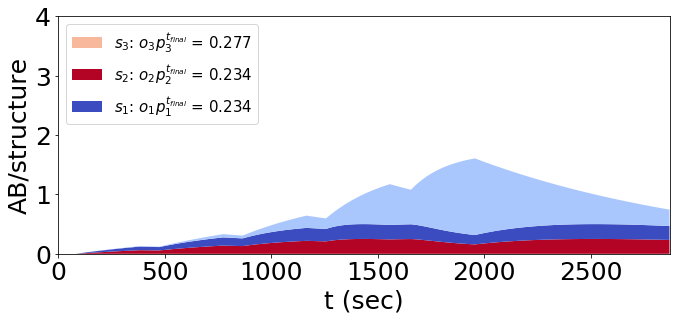

[array([1.23876838])]
('(fit_annealing) variable parameter: ', array([18.]), 'log10 variable parameter: ', array([1.25527251]))
basinhopping step 0: f 115.928
basinhopping step 1: f 115.928 trial_f 115.928 accepted 1  lowest_f 115.928
('JR2_config_c', [1.2622277728104745])


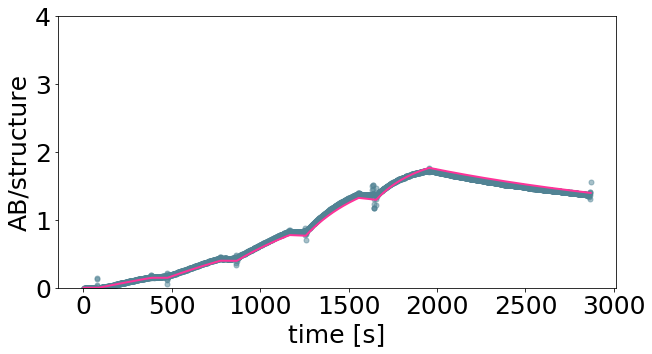

[18.29059245]


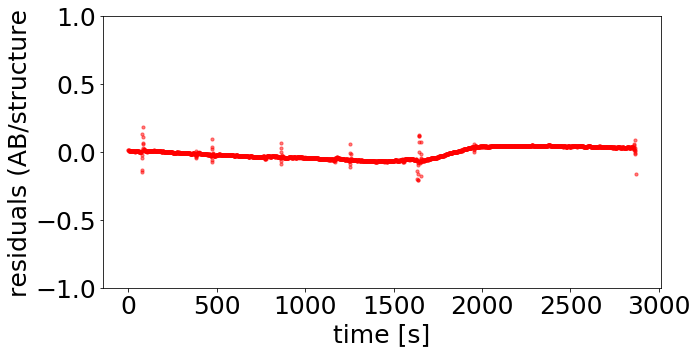

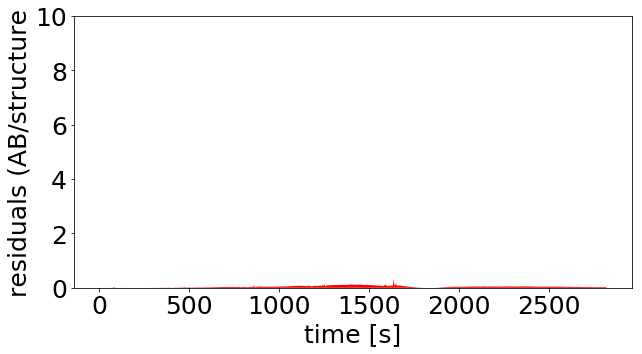

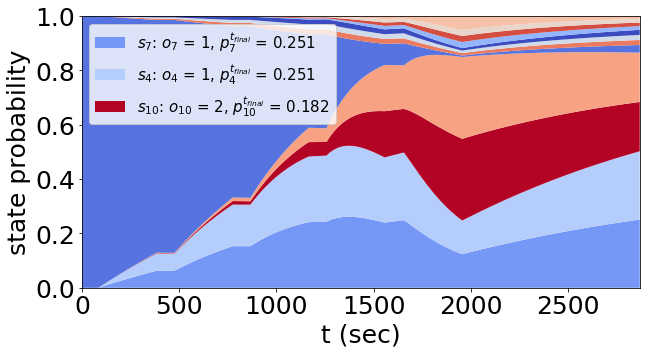

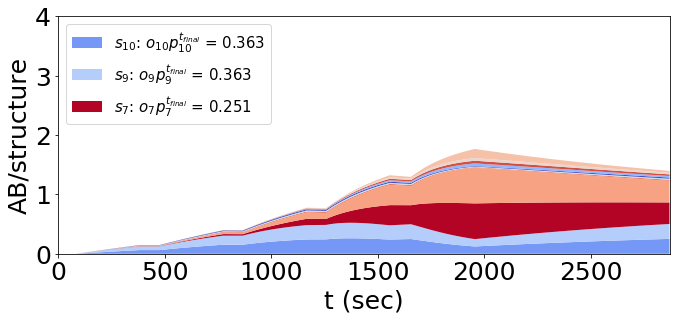

[array([1.26222777])]
('(fit_annealing) variable parameter: ', array([18.]), 'log10 variable parameter: ', array([1.25527251]))
basinhopping step 0: f 974.01
basinhopping step 1: f 974.01 trial_f 974.01 accepted 1  lowest_f 974.01
found new global minimum on step 1 with function value 974.01
('JR2_config_d', [1.2379442210906442])


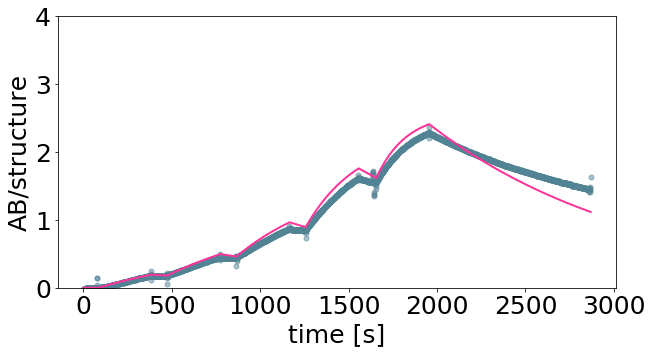

[17.29594203]


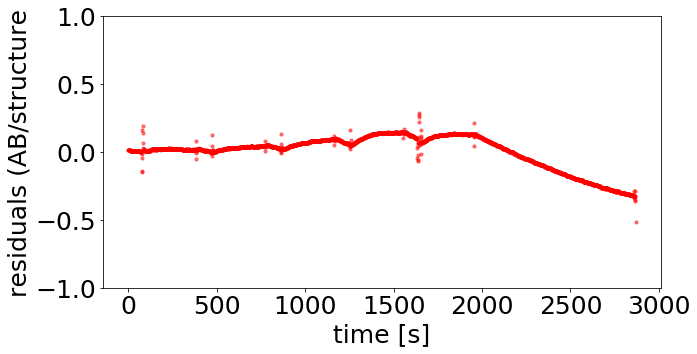

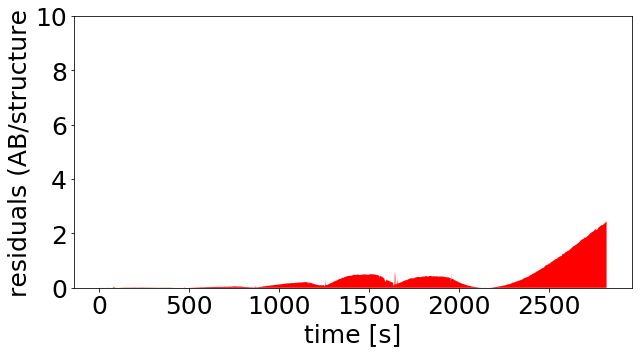

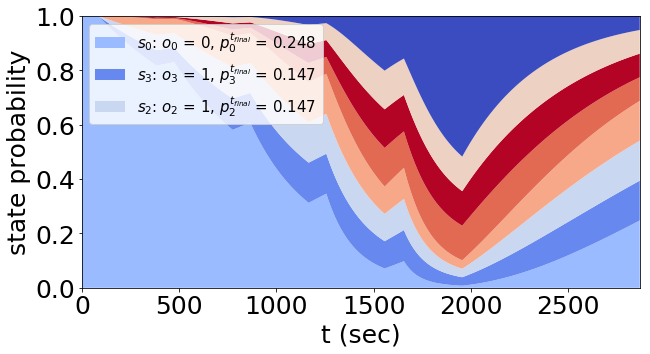

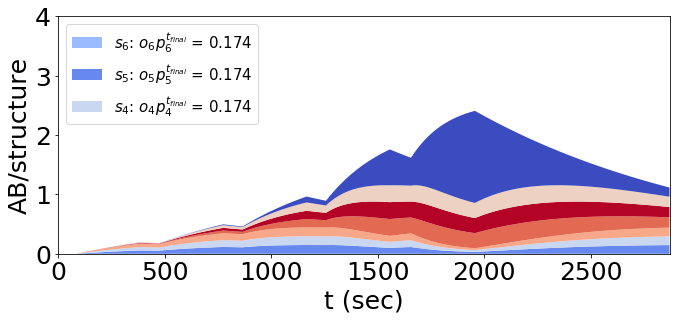

[array([1.23794422])]
('(fit_annealing) variable parameter: ', array([18.]), 'log10 variable parameter: ', array([1.25527251]))
basinhopping step 0: f 118.29
basinhopping step 1: f 118.29 trial_f 118.29 accepted 1  lowest_f 118.29
('JR2_config_e', [1.3043896800183052])


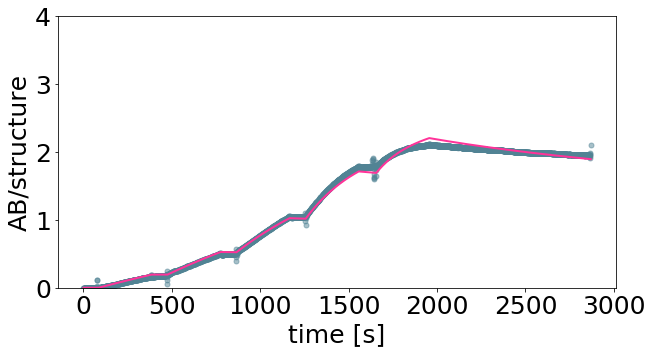

[20.15531918]


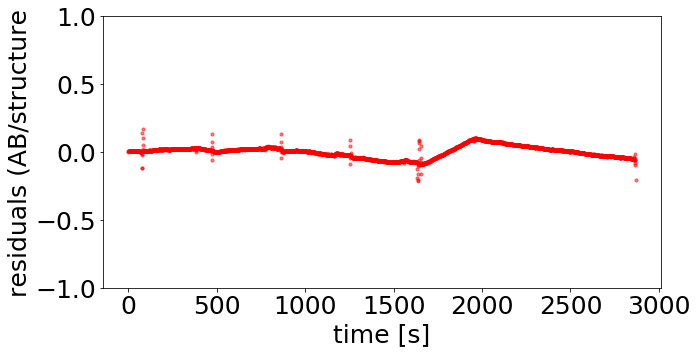

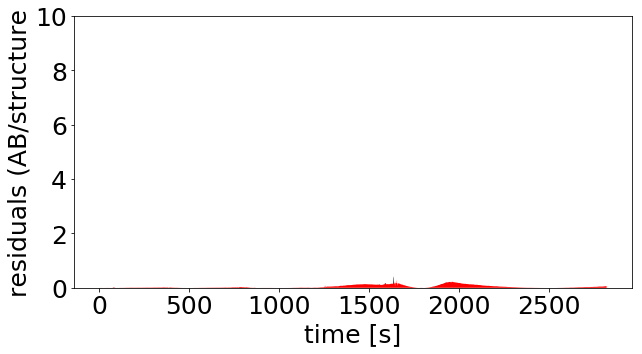

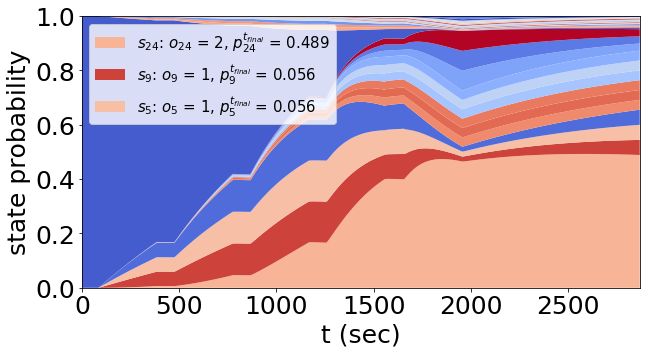

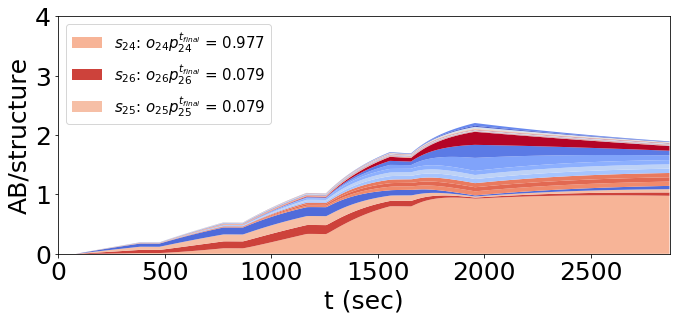

[array([1.30438968])]
('(fit_annealing) variable parameter: ', array([18.]), 'log10 variable parameter: ', array([1.25527251]))
basinhopping step 0: f 78.2649
basinhopping step 1: f 78.2649 trial_f 78.2649 accepted 1  lowest_f 78.2649
found new global minimum on step 1 with function value 78.2649
('JR2_config_f', [1.2998413478689772])


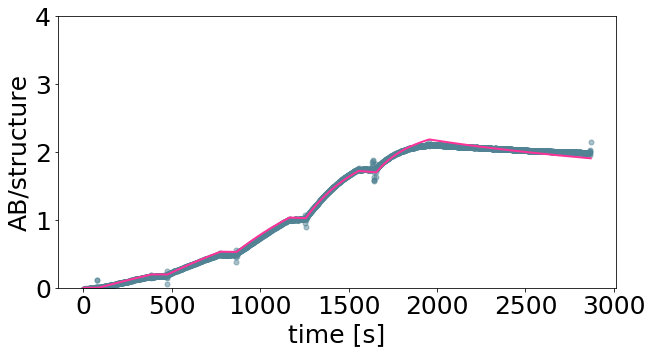

[19.94533559]


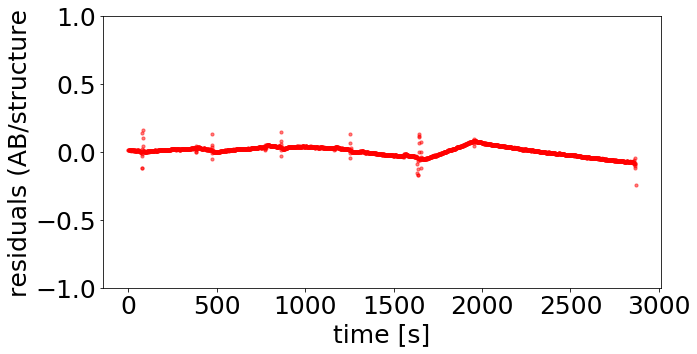

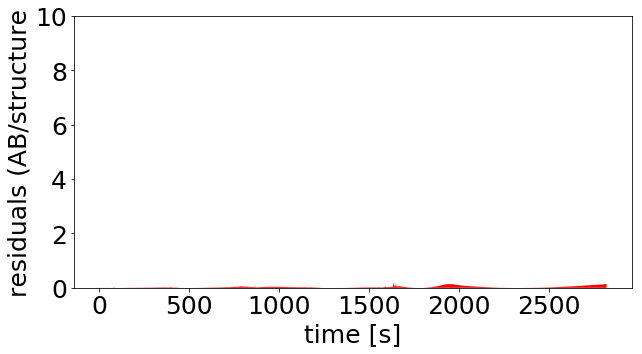

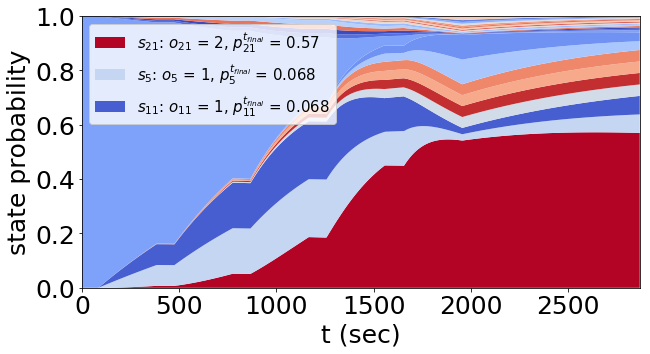

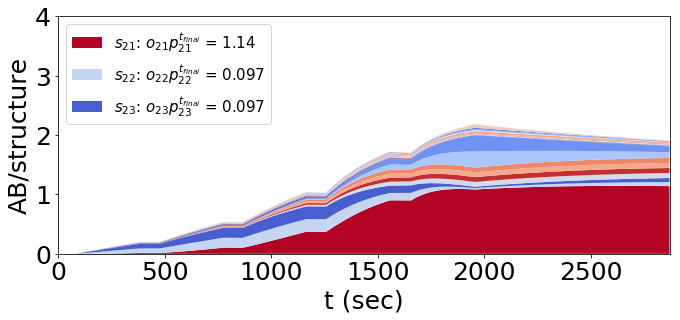

[array([1.29984135])]
('(fit_annealing) variable parameter: ', array([18.]), 'log10 variable parameter: ', array([1.25527251]))
basinhopping step 0: f 151.028
basinhopping step 1: f 151.028 trial_f 151.028 accepted 1  lowest_f 151.028
found new global minimum on step 1 with function value 151.028
('JR2_config_g', [1.2934950870088207])


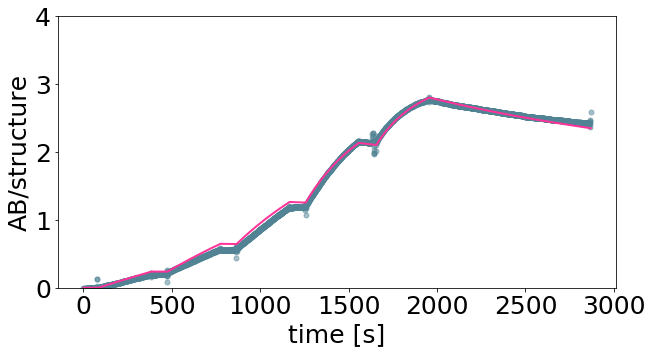

[19.65599744]


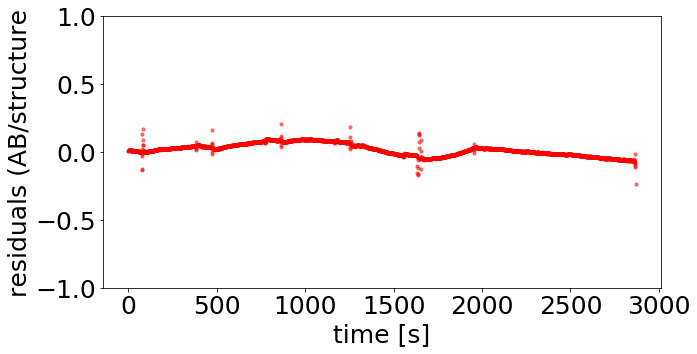

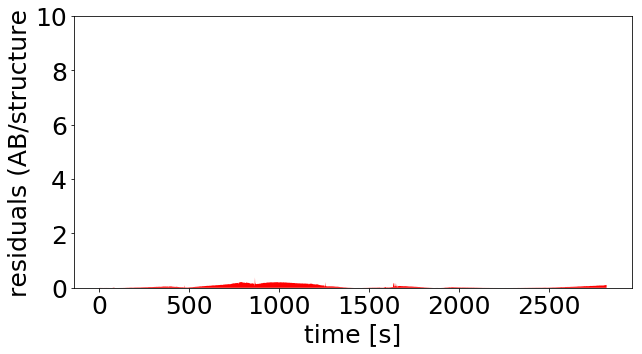

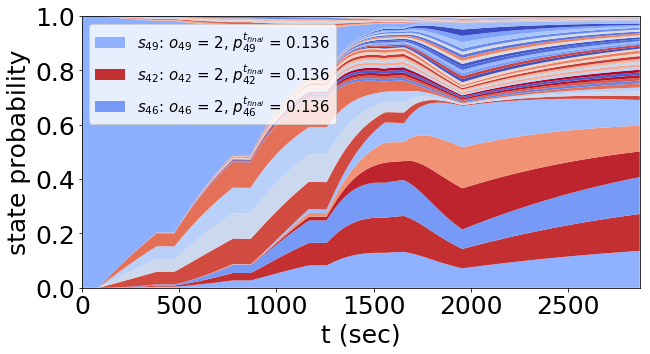

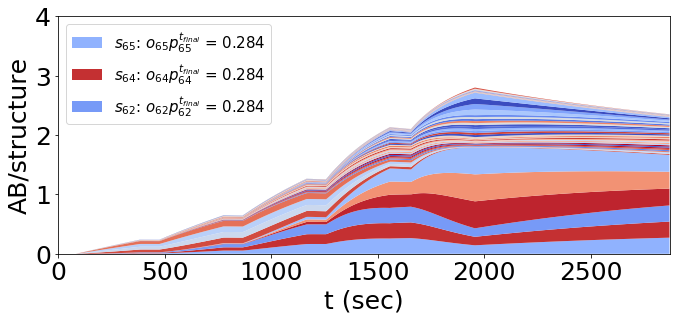

[array([1.29349509])]
('(fit_annealing) variable parameter: ', array([18.]), 'log10 variable parameter: ', array([1.25527251]))
basinhopping step 0: f 125.682
basinhopping step 1: f 125.682 trial_f 125.682 accepted 1  lowest_f 125.682
found new global minimum on step 1 with function value 125.682
('JR2_config_h', [1.3189956287814624])


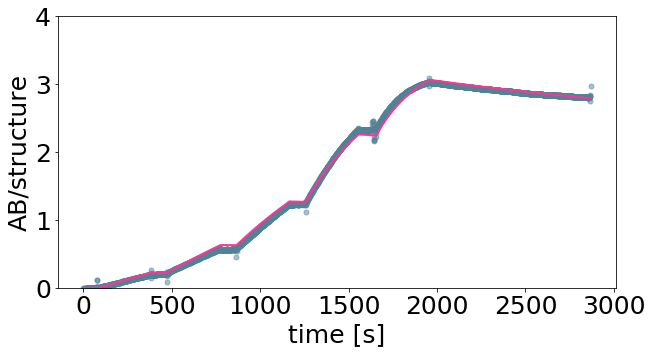

[20.84469903]


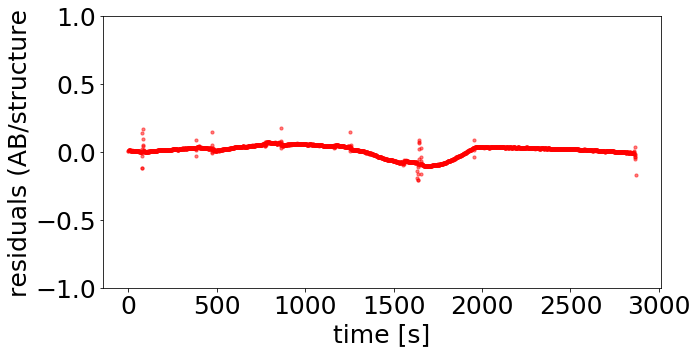

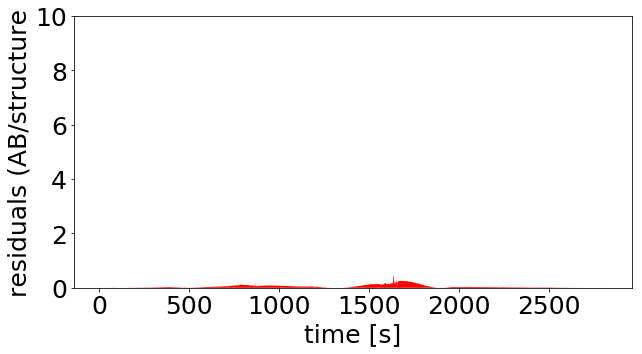

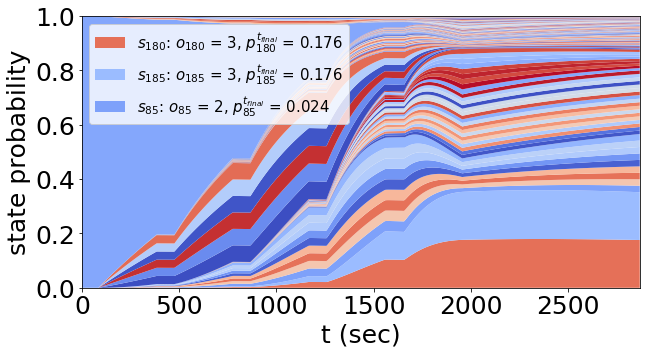

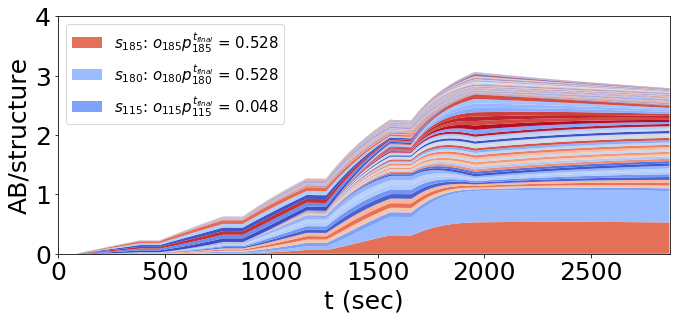

[array([1.31899563])]


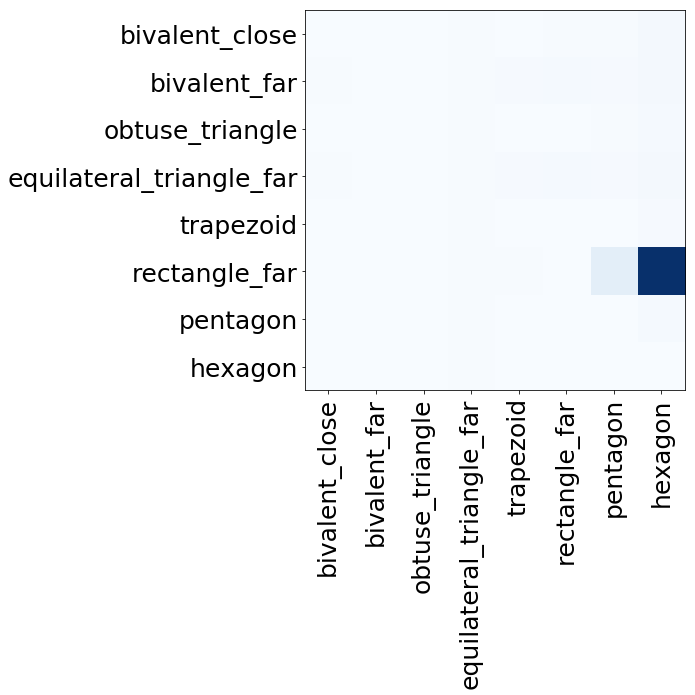

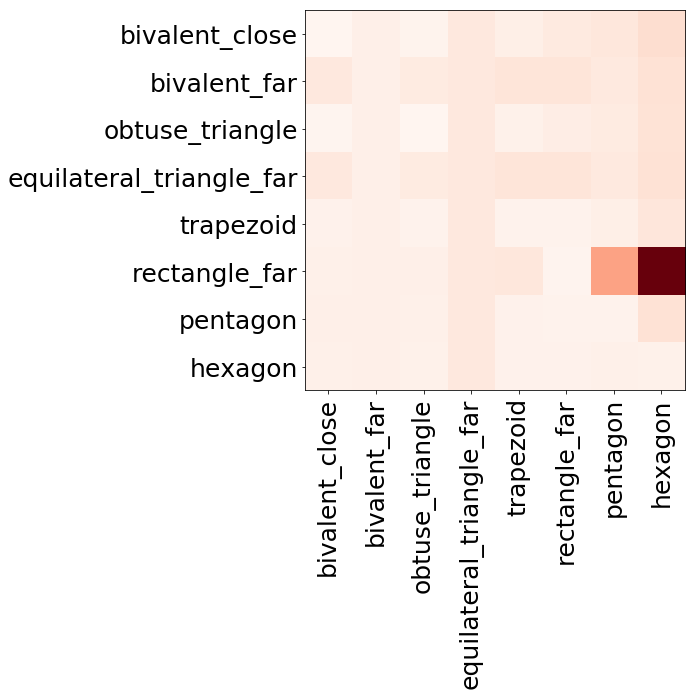

In [14]:
imp.reload(mk)
training_set = np.zeros((len(data_sets)),dtype=np.object)
test_set = np.zeros((len(data_sets),len(data_sets)),dtype=np.object)
fitting_quality_matrix = np.zeros((len(data_sets),len(data_sets)))
fitting_quality_matrix2= np.zeros((len(data_sets),len(data_sets)))
for training_data in range(len(data_sets)):
    training_set[training_data] = mk.Fitting(np.array([[data_sets[training_data][0], data_sets[training_data][1], 14.28]]),
                        run_type = "biv_3param", 
                        mono_rates = np.array([k_on, k_off]),
                        KD_biv = 10.0, 
                        concentrations = concentrations, 
                        time_points = time_points, 
                        scaling_constant = norm1,
                        output_dir =master_name+"/train"+data_sets[training_data][1],
                        k_monobiv = 1,
                        k_bivmono = 1,
                                            )
    training_set[training_data] .set_bounds(((-9,2),(-9,2),(np.log10(17),np.log10(21))))
    training_set[training_data] .print_graph = False
    training_xopt = training_set[training_data].fit_annealing()
    

    training_xopt_pow = np.power(10,training_xopt)
    KD_biv, norm_2 = training_xopt_pow[0][1]/training_xopt_pow[0][0], training_xopt_pow[0][2]
    logKD_biv, lognorm_2 =xopt_compilation_2[0][1]/xopt_compilation_2[0][0], xopt_compilation_2[0][1]
#     KD_biv, norm_2 = training_xopt_pow[0][0], training_xopt_pow[0][1]
#     logKD_biv, lognorm_2 =training_xopt[0][0], training_xopt[0][1]
    for test_data in range(len(data_sets)):
        rates_test = np.array([k_on,k_off])
        test_set[training_data, test_data] = mk.Fitting(np.array([[data_sets[test_data][0], data_sets[test_data][1], 14.28]]),
                                   run_type = "biv_scale_only", 
                                    mono_rates = np.array([k_on, k_off]),
                                    KD_biv = KD_biv, 
                                    concentrations = concentrations, 
                                    time_points = time_points, 
                                    scaling_constant = norm1,
                                    output_dir = master_name+"/train"+data_sets[training_data][1]+"_test"+data_sets[test_data][1],
                                    k_monobiv = training_xopt_pow[0][0],
                                    k_bivmono = training_xopt_pow[0][1]
                                                       )
        test_set[training_data, test_data].run_data = mk.fetch_and_normalize_data('data_directory/' + data_sets[test_data][0] + '.txt', normalize_const=1)
        test_set[training_data, test_data].master_error=np.zeros(1)
        test_set[training_data, test_data].print_graph = False
        norm = 19
        test_set[training_data, test_data].set_bounds([(np.log10(10),np.log10(30))])
        xopt_test = test_set[training_data, test_data].fit_annealing()
        
        
        
        
        
        
        k = 50
        krange = range(0,k)
        total_auto_correlation = 0
        autocorrelations = np.zeros((len(test_set[training_data, test_data].residuals)-k+1))
        for i in range(0, len(test_set[training_data, test_data].residuals)-k+1):
            k_mer = test_set[training_data, test_data].residuals[i:i+k]
            autocorrelations[i] = np.sqrt(np.correlate(krange, k_mer)**2)/k

        fitting_quality_matrix[training_data,test_data] = np.sum(autocorrelations*np.abs(test_set[training_data, test_data].residuals[0:-(k-1)]))
        fitting_quality_matrix2[training_data,test_data] = np.sum(np.abs(test_set[training_data, test_data].residuals))

        
pkl.dump([fitting_quality_matrix, 
          fitting_quality_matrix2, training_set, test_set
         ], open(master_name+'/pickle_directory/cross_validation_matrix.pickle', 'wb'))
        
        
fig = plt.figure(figsize=(7,7))
plt.rcParams.update({'font.size': 10})

ax1 = fig.add_subplot(111)
ax1.set_yticks(np.arange(0,len(data_sets)))

ax1.imshow(fitting_quality_matrix,cmap="Blues") 
ax1.set_yticklabels([x[1] for x in data_sets],rotation=0)
ax1.set_xticks(np.arange(0,len(data_sets)))
ax1.set_xticklabels([x[1] for x in data_sets],rotation=90)
plt.savefig(master_name+"/fitting_matrix_weightedresiduals.svg")
plt.show()
plt.close()
fig = plt.figure(figsize=(7,7))
plt.rcParams.update({'font.size': 10})

ax1 = fig.add_subplot(111)
ax1.set_yticks(np.arange(0,len(data_sets)))

ax1.imshow(fitting_quality_matrix2,cmap="Reds") 
ax1.set_yticklabels([x[1] for x in data_sets],rotation=0)
ax1.set_xticks(np.arange(0,len(data_sets)))
ax1.set_xticklabels([x[1] for x in data_sets],rotation=90)
plt.savefig(master_name+"/fitting_matrix_residuals.svg")
plt.show()
plt.close()

In [41]:
import pickle as pkl
fitting_quality_matrix, fitting_quality_matrix2, training_set, test_set = \
    pkl.load(open(master_name+'/pickle_directory/cross_validation_matrix.pickle', 'rb'))

In [23]:
training_xopt_pow

NameError: name 'training_xopt_pow' is not defined

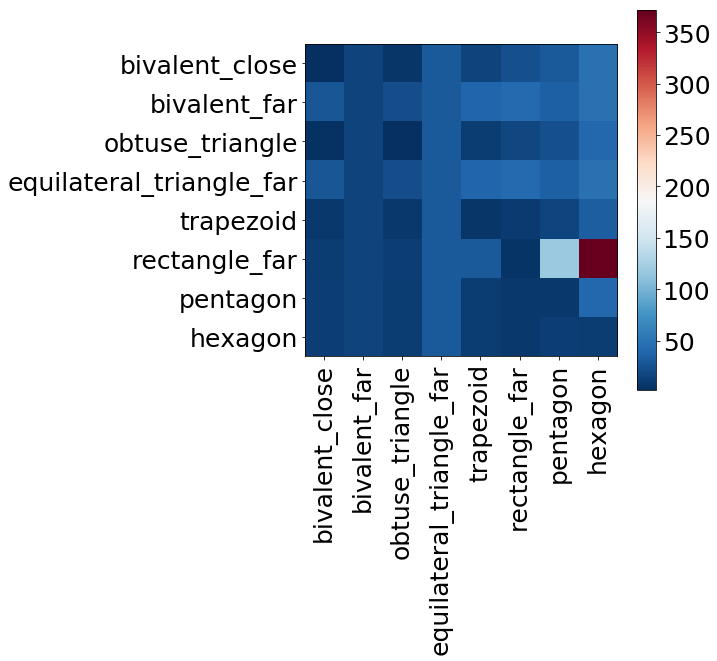

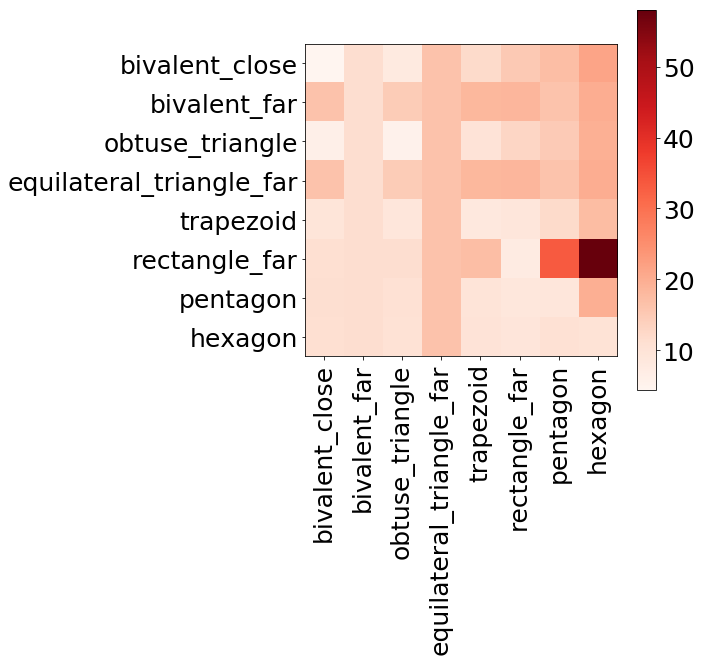

In [64]:
fig = plt.figure(figsize=(7,7))
plt.rcParams.update({'font.size': 10})

ax1 = fig.add_subplot(111)
ax1.set_yticks(np.arange(0,len(data_sets)))

im = ax1.imshow(fitting_quality_matrix**0.5,cmap="RdBu_r") 
ax1.set_yticklabels([x[1] for x in data_sets],rotation=0)
ax1.set_xticks(np.arange(0,len(data_sets)))
ax1.set_xticklabels([x[1] for x in data_sets],rotation=90)

fig.colorbar(im,ax=ax1)
plt.savefig(master_name+"/fitting_matrix_weightedresiduals.svg")
plt.show()
plt.close()

fig = plt.figure(figsize=(7,7))
plt.rcParams.update({'font.size': 10})

ax1 = fig.add_subplot(111)
ax1.set_yticks(np.arange(0,len(data_sets)))

im = ax1.imshow(fitting_quality_matrix2**.5,cmap="Reds") 
ax1.set_yticklabels([x[1] for x in data_sets],rotation=0)
ax1.set_xticks(np.arange(0,len(data_sets)))
ax1.set_xticklabels([x[1] for x in data_sets],rotation=90)
fig.colorbar(im,ax=ax1)
plt.savefig(master_name+"/fitting_matrix_residuals.svg")
plt.show()
plt.close()

